<a href="https://colab.research.google.com/github/jcalandra/audiosynthesis_dl/blob/master/src/Pict2Audio_multineural.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pict2Audio : A Neural Network that associates Pictures to Audio Descriptors

This project consists in associating a sound with one or more characteristics defined by audio descriptors with a picture drawn by a composer . The long-term goal is to allow the composer to develop his own composition language in order to associate it with sounds from some effects banks.

I will first be interested in pitch, and I will propose as input to a Convolutional Neural Network trained for classification a database of couples:
- an image drawn by the composer,
- the label of the sound extract corresponding to the associated note pitch.
After training, we want to obtain a sound for a given image at the input of the network.

Validation tests will be conducted by verifying that the sounds obtained correspond to the desired descriptors.

**You will find the multilabel version at the following link :**
[https://colab.research.google.com/drive/1_ZTdR2CG_eekUUtqAG9Bqa7RixHL8v93](https://colab.research.google.com/drive/1_ZTdR2CG_eekUUtqAG9Bqa7RixHL8v93)

## Importation of the libraries

First, we need to import all the package and libraries necessary to run the code.

The backend Tensorflow is used with the library Keras to implement the neural network.

In [0]:
print('[INFO] loading the librairies...')
from __future__ import print_function
import os
from PIL import Image

import numpy as np
import random
import matplotlib
import matplotlib.pyplot as plt

import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Dense, Activation, BatchNormalization,Dropout, Conv2D, MaxPooling2D, Flatten
from keras.optimizers import RMSprop
from keras.preprocessing import image
print('tensorflow:', tf.__version__)
print('keras:', keras.__version__)

[INFO] loading the librairies...
tensorflow: 1.13.1
keras: 2.2.4


Using TensorFlow backend.



## Importation of the Dataset :

the dataset is imported from github, using the repository audiosynthesis_dl. In this repository, you can also find documentation about sound synthesis using Neural Networks.

In [0]:
# First, import git repository
! git clone https://github.com/jcalandra/audiosynthesis_dl.git


Cloning into 'audiosynthesis_dl'...
remote: Enumerating objects: 290, done.
remote: Counting objects: 100% (290/290), done.
remote: Compressing objects: 100% (275/275), done.
remote: Total 629 (delta 21), reused 266 (delta 10), pack-reused 339
Receiving objects: 100% (629/629), 9.72 MiB | 19.98 MiB/s, done.
Resolving deltas: 100% (92/92), done.


Then, run the following script in the same environment :

https://colab.research.google.com/drive/1lJELWVC4DmQSNOw0fat4KrzTo_GmVbpZ

To avoid downloading a heavy set of data on the computer, I chose to generate the pictures directly and load them from google colab

In [0]:
print('[INFO] importing the librairies...')
import cv2
from google.colab.patches import cv2_imshow
from google.colab import files

[INFO] importing the librairies...


In [0]:
## GLOBAL VALUES

print('[INFO] loading global values...')
NB_PITCH = 12
NB_THICK = 6
NB_COLOR = 8
PICT_WIDTH = 400
NB_CHANNEL = 3
LINE_WIDTH = PICT_WIDTH//NB_PITCH #33

NB_CARACTERISTICS = 3

# number of versions for a same pitch
NB_VERSION_TRAIN = 30
NB_VERSION_VALIDATION = 10

# number of trained and validation pictures /!\ choose a multiple of NB_PITCH !
NB_TRAIN = NB_PITCH*NB_VERSION_TRAIN
NB_VALIDATION = NB_PITCH*NB_VERSION_VALIDATION

[INFO] loading global values...


In [0]:
## LOADING THE BASELINE

print('[INFO] loading the baseline...')
baseline = cv2.imread('audiosynthesis_dl/data/base_quadrillage.png')
#cv2_imshow(baseline)

[INFO] loading the baseline...


[INFO] generating training dataset...


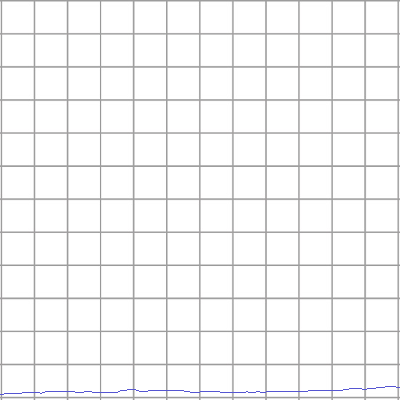

pitch69_thick0_color4_0_train.png


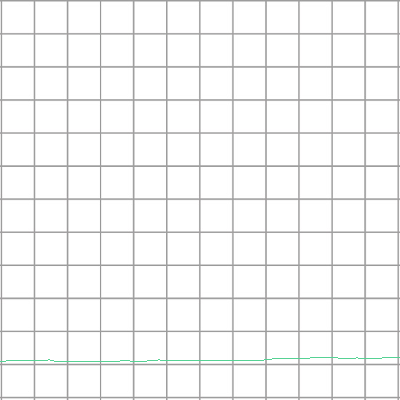

pitch70_thick0_color5_1_train.png


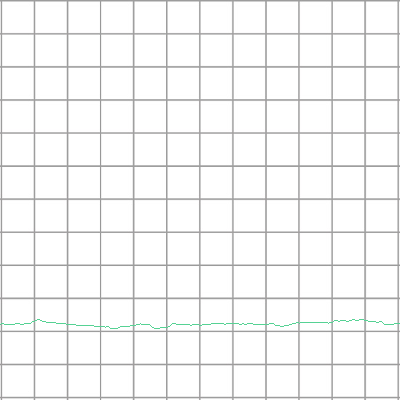

pitch71_thick0_color5_2_train.png


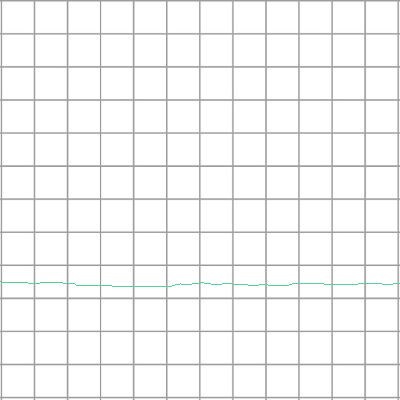

pitch72_thick0_color5_3_train.png


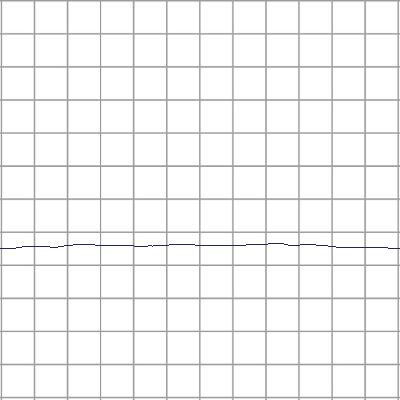

pitch73_thick0_color0_4_train.png


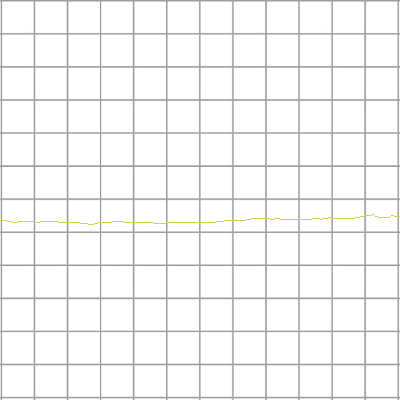

pitch74_thick0_color6_5_train.png


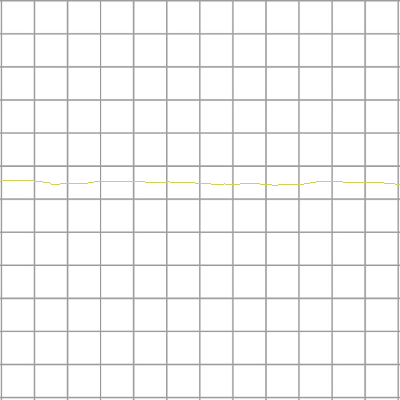

pitch75_thick0_color6_6_train.png


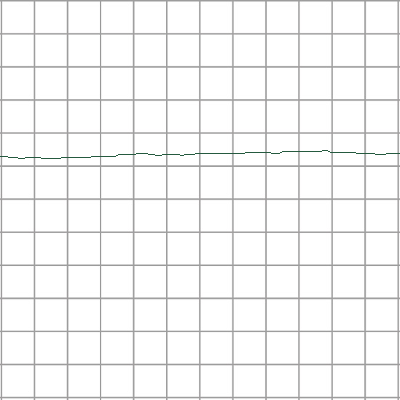

pitch76_thick0_color1_7_train.png


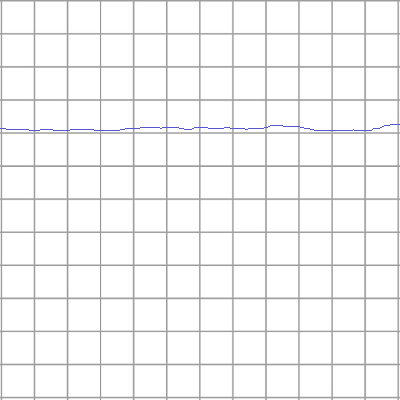

pitch77_thick0_color4_8_train.png


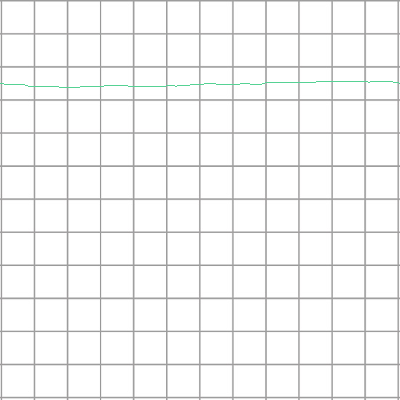

pitch78_thick0_color5_9_train.png


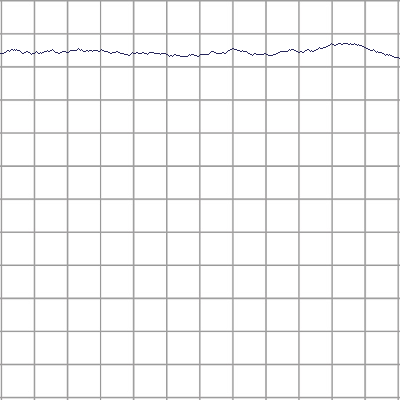

pitch79_thick0_color0_10_train.png


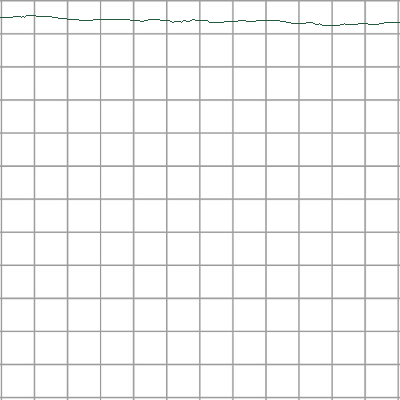

pitch80_thick0_color1_11_train.png


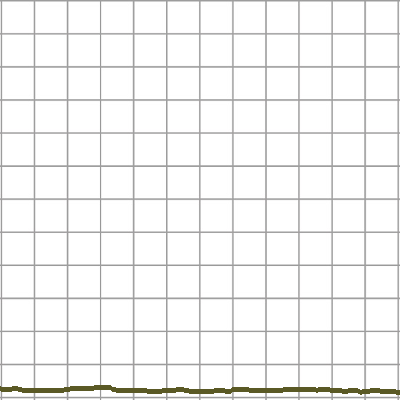

pitch69_thick1_color2_12_train.png


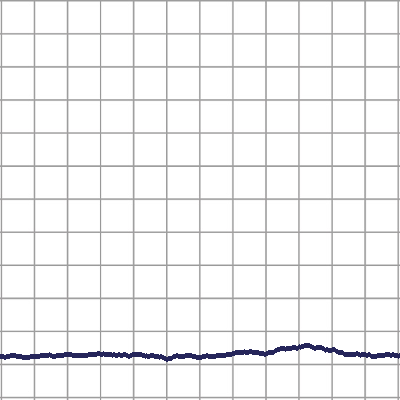

pitch70_thick1_color0_13_train.png


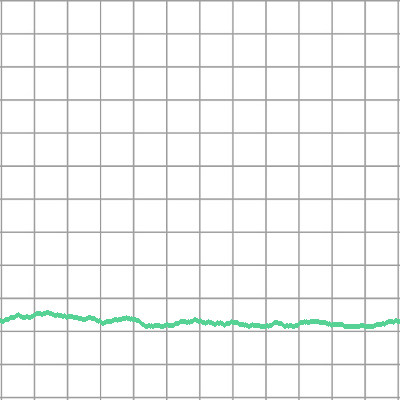

pitch71_thick1_color5_14_train.png


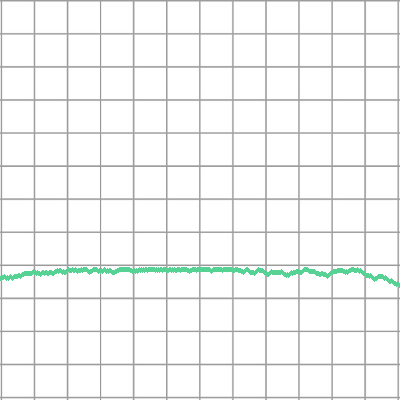

pitch72_thick1_color5_15_train.png


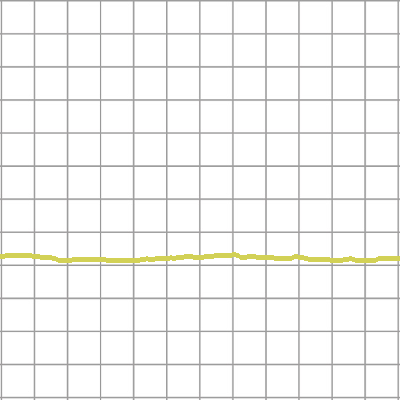

pitch73_thick1_color6_16_train.png


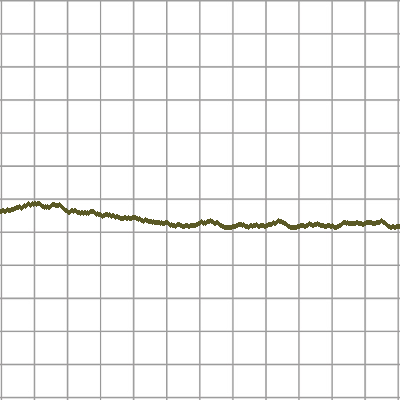

pitch74_thick1_color2_17_train.png


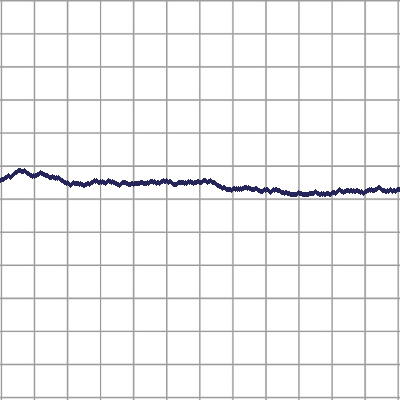

pitch75_thick1_color0_18_train.png


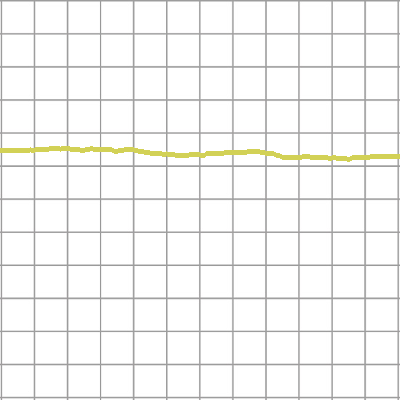

pitch76_thick1_color6_19_train.png


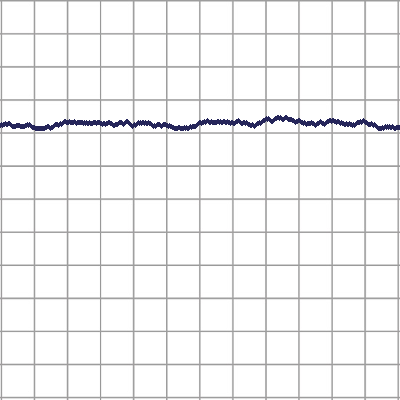

pitch77_thick1_color0_20_train.png


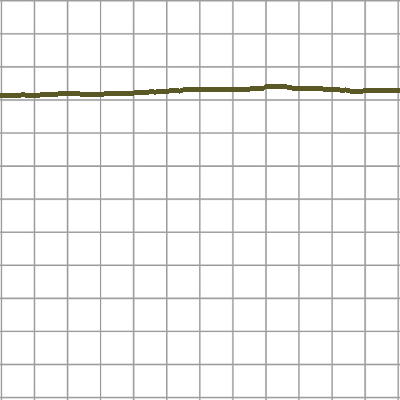

pitch78_thick1_color2_21_train.png


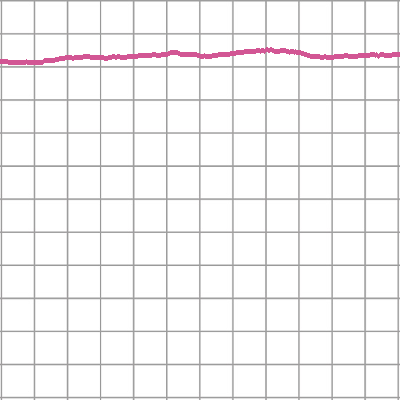

pitch79_thick1_color7_22_train.png


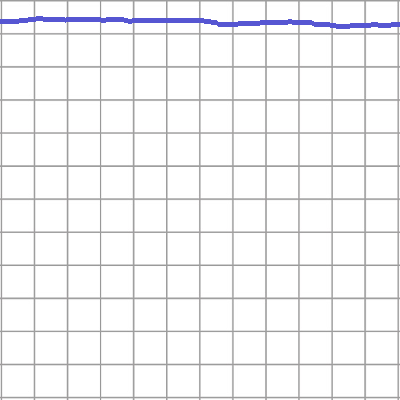

pitch80_thick1_color4_23_train.png


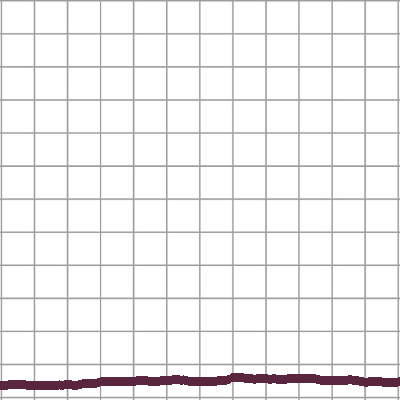

pitch69_thick2_color3_24_train.png


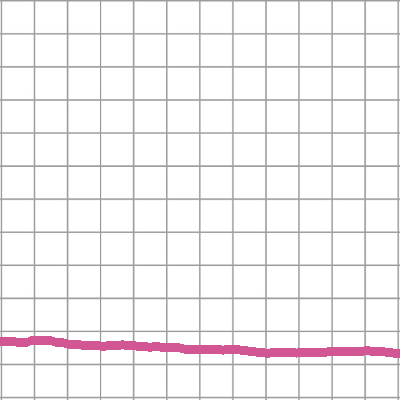

pitch70_thick2_color7_25_train.png


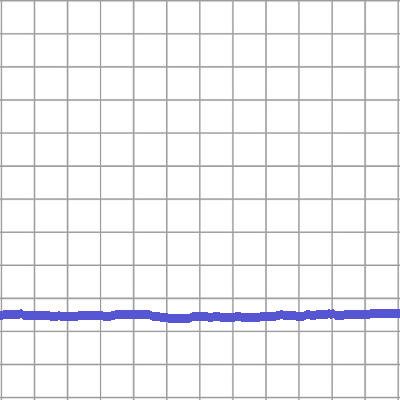

pitch71_thick2_color4_26_train.png


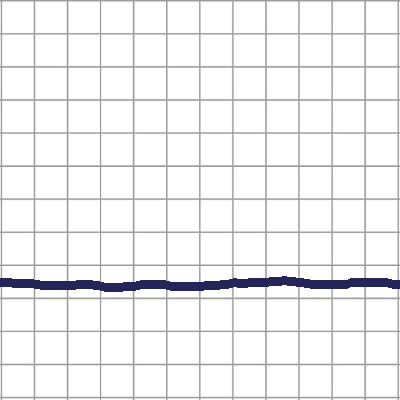

pitch72_thick2_color0_27_train.png


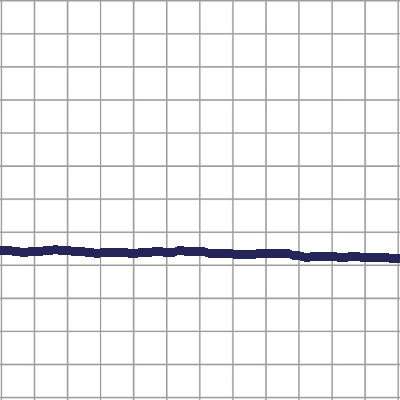

pitch73_thick2_color0_28_train.png


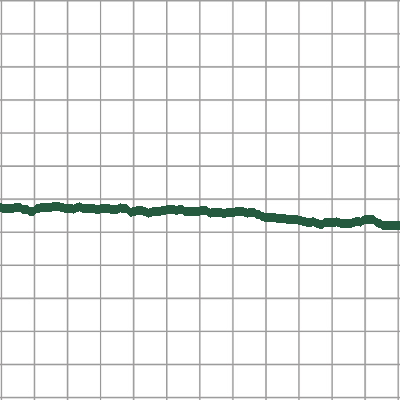

pitch74_thick2_color1_29_train.png


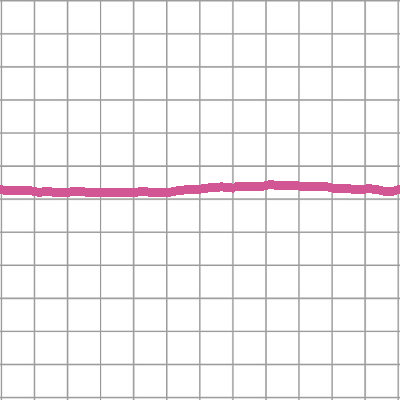

pitch75_thick2_color7_30_train.png


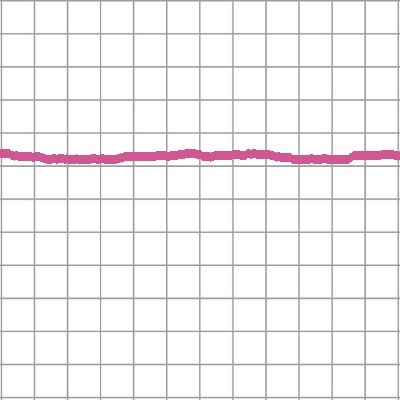

pitch76_thick2_color7_31_train.png


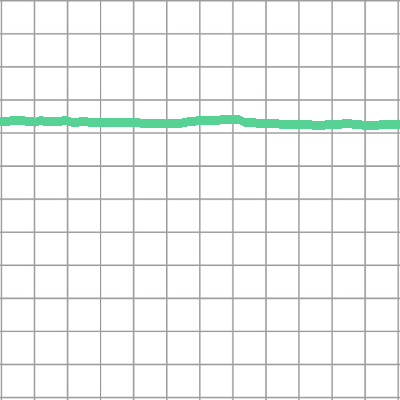

pitch77_thick2_color5_32_train.png


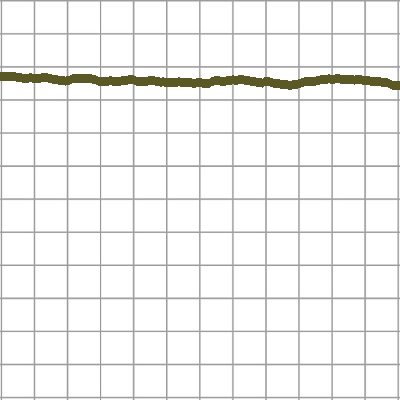

pitch78_thick2_color2_33_train.png


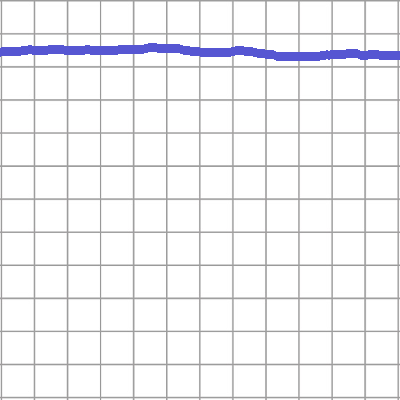

pitch79_thick2_color4_34_train.png


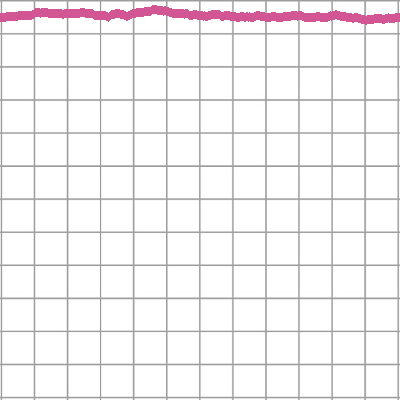

pitch80_thick2_color7_35_train.png


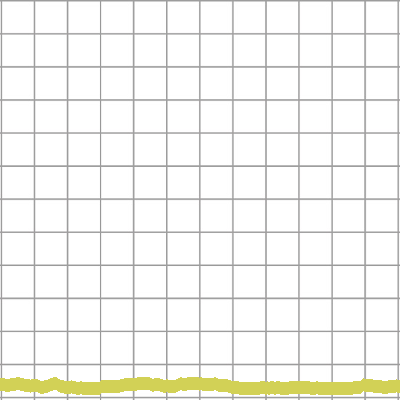

pitch69_thick3_color6_36_train.png


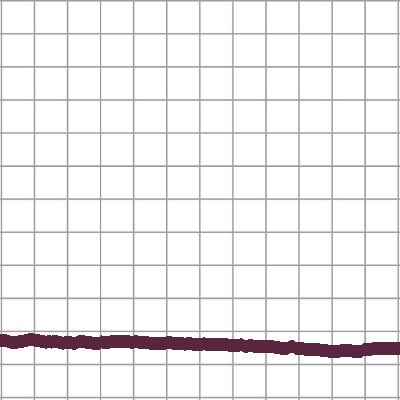

pitch70_thick3_color3_37_train.png


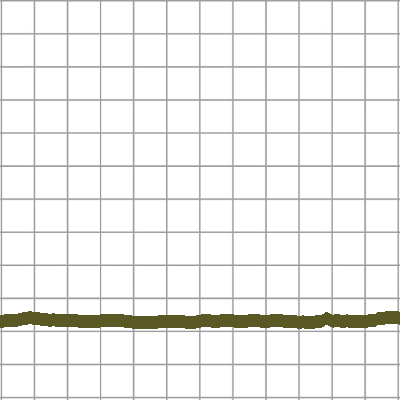

pitch71_thick3_color2_38_train.png


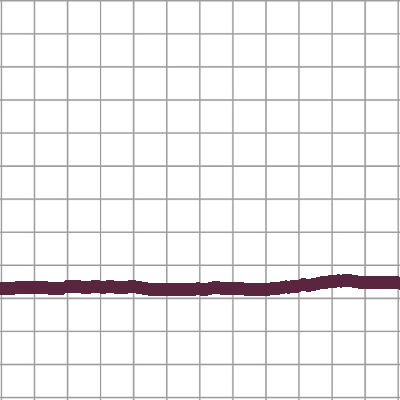

pitch72_thick3_color3_39_train.png


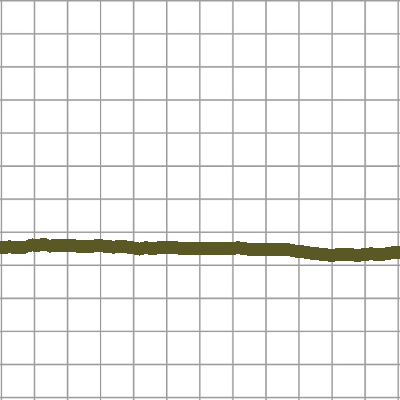

pitch73_thick3_color2_40_train.png


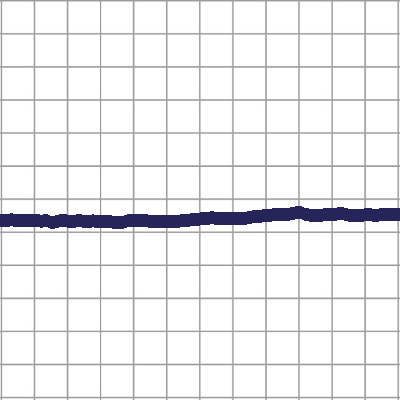

pitch74_thick3_color0_41_train.png


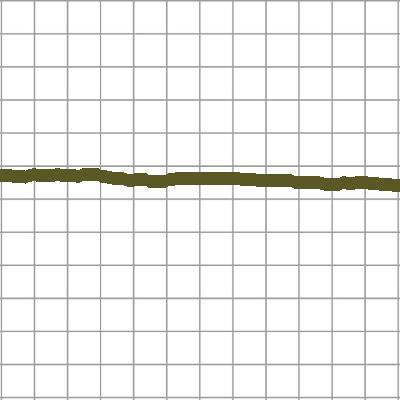

pitch75_thick3_color2_42_train.png


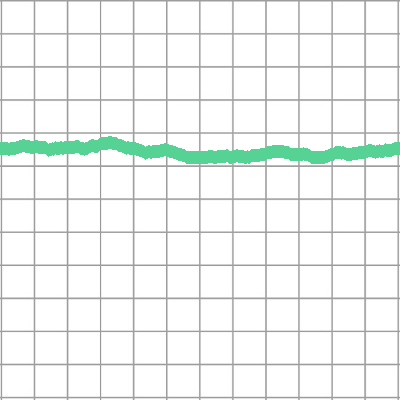

pitch76_thick3_color5_43_train.png


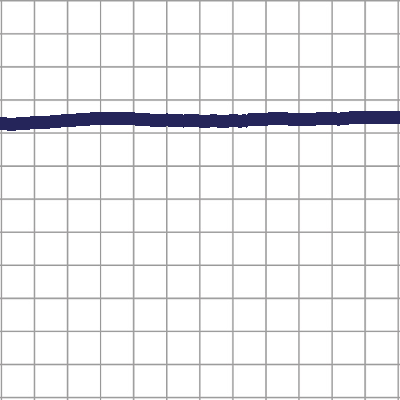

pitch77_thick3_color0_44_train.png


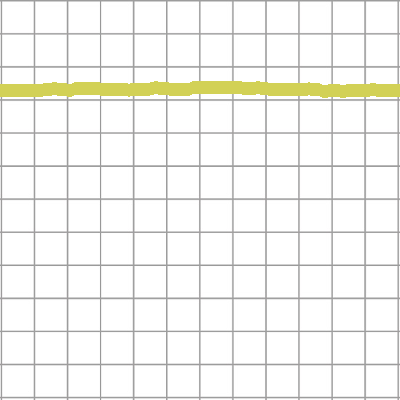

pitch78_thick3_color6_45_train.png


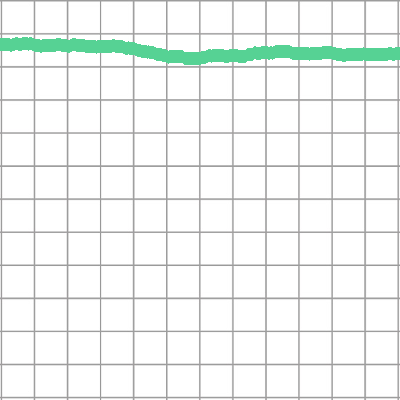

pitch79_thick3_color5_46_train.png


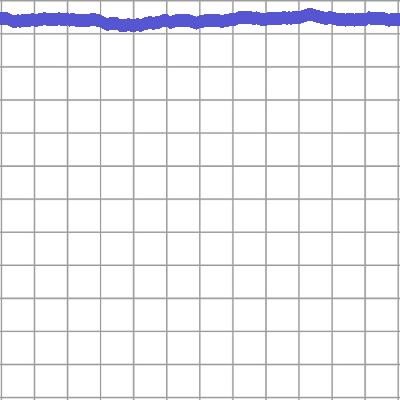

pitch80_thick3_color4_47_train.png


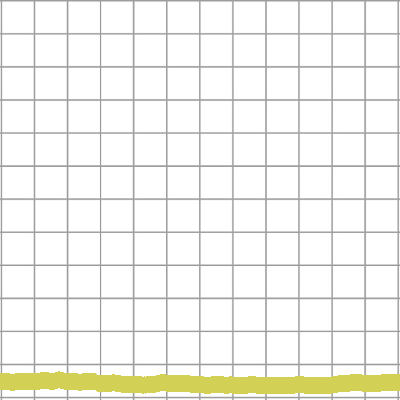

pitch69_thick4_color6_48_train.png


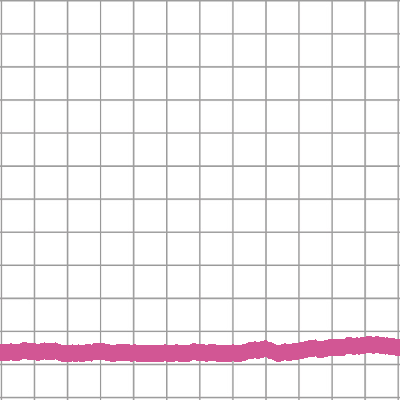

pitch70_thick4_color7_49_train.png


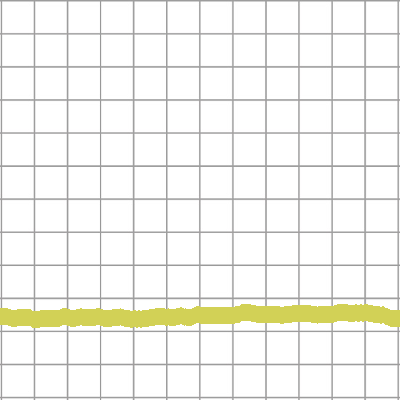

pitch71_thick4_color6_50_train.png


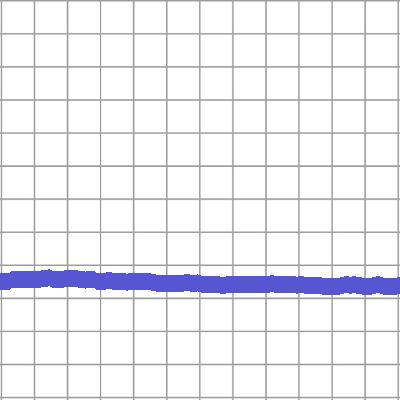

pitch72_thick4_color4_51_train.png


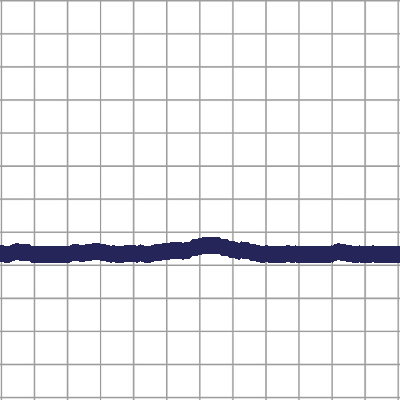

pitch73_thick4_color0_52_train.png


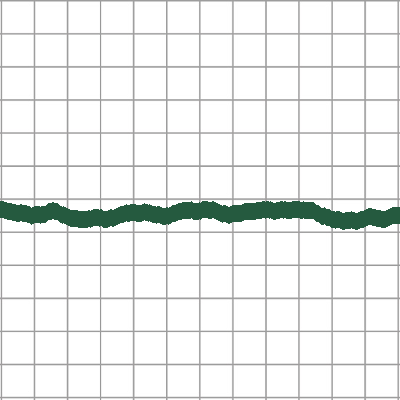

pitch74_thick4_color1_53_train.png


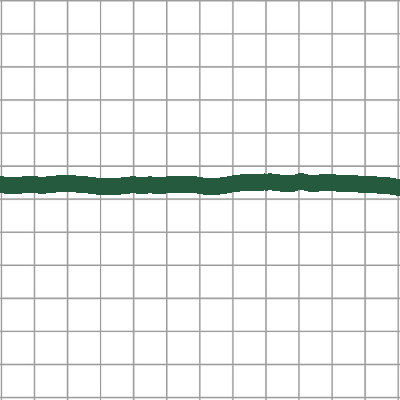

pitch75_thick4_color1_54_train.png


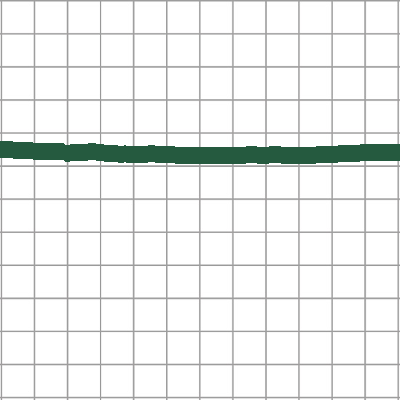

pitch76_thick4_color1_55_train.png


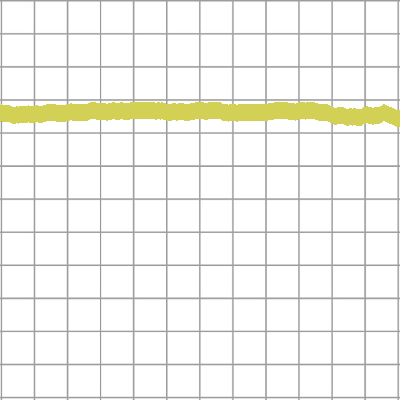

pitch77_thick4_color6_56_train.png


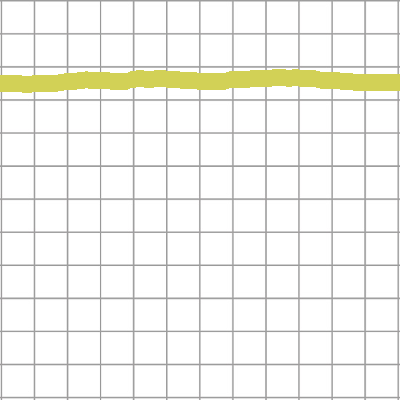

pitch78_thick4_color6_57_train.png


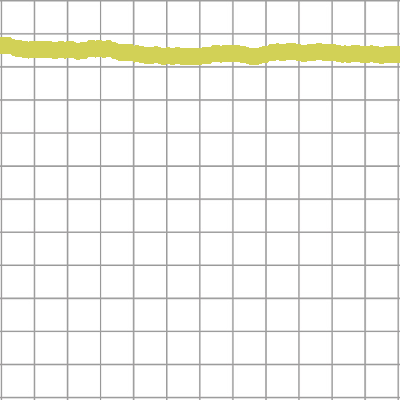

pitch79_thick4_color6_58_train.png


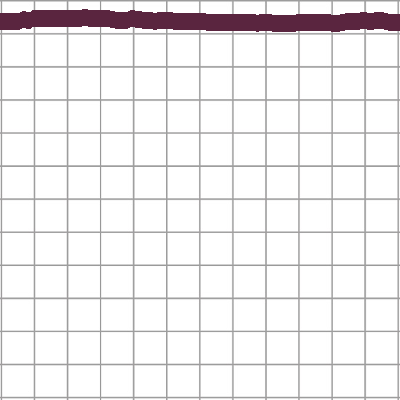

pitch80_thick4_color3_59_train.png


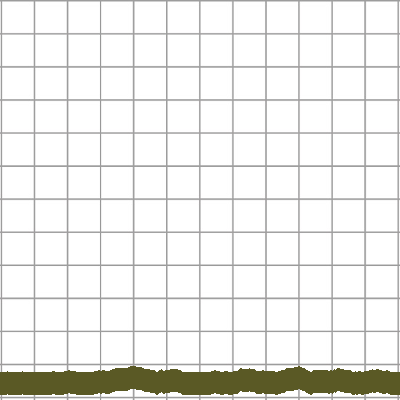

pitch69_thick5_color2_60_train.png


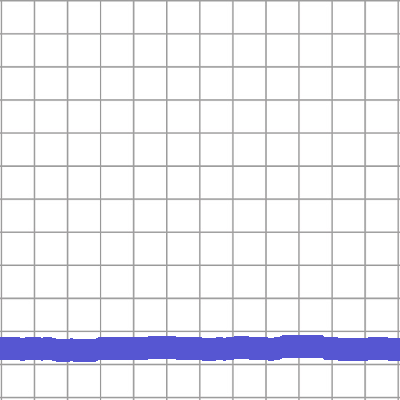

pitch70_thick5_color4_61_train.png


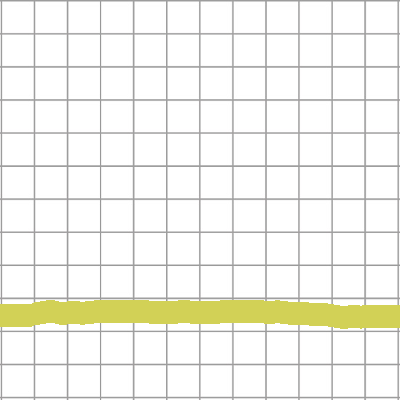

pitch71_thick5_color6_62_train.png


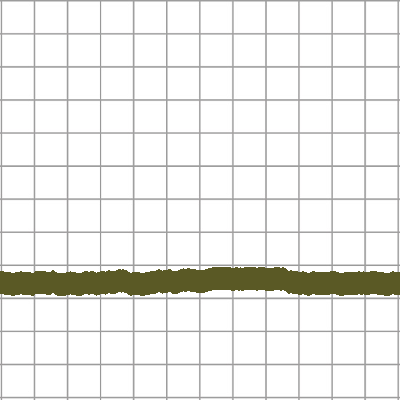

pitch72_thick5_color2_63_train.png


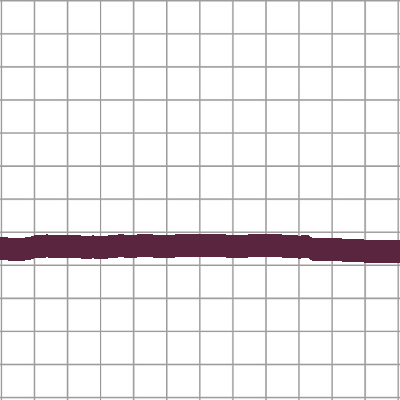

pitch73_thick5_color3_64_train.png


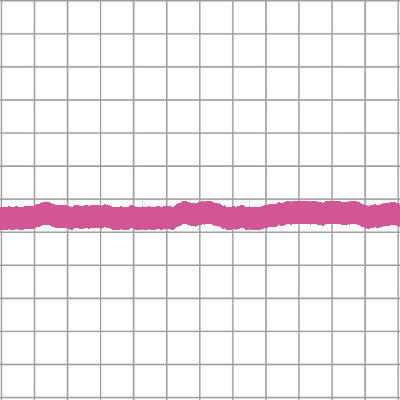

pitch74_thick5_color7_65_train.png


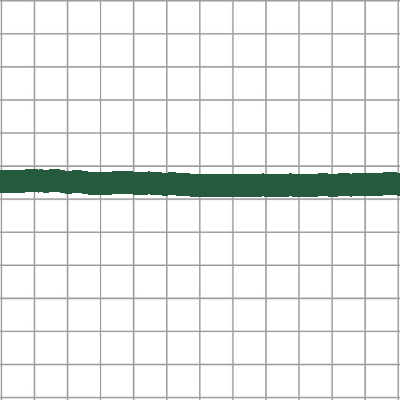

pitch75_thick5_color1_66_train.png


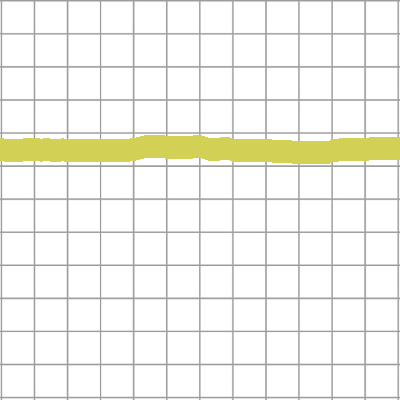

pitch76_thick5_color6_67_train.png


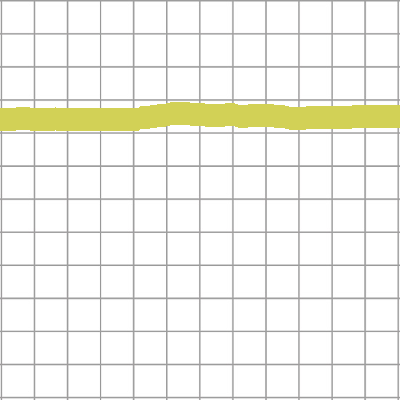

pitch77_thick5_color6_68_train.png


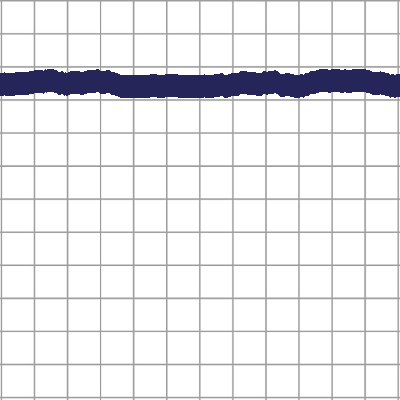

pitch78_thick5_color0_69_train.png


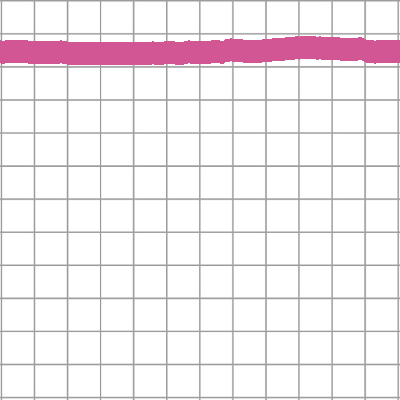

pitch79_thick5_color7_70_train.png


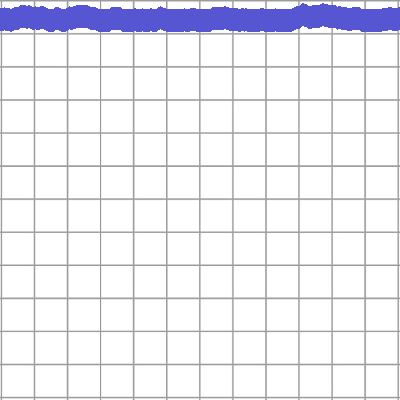

pitch80_thick5_color4_71_train.png


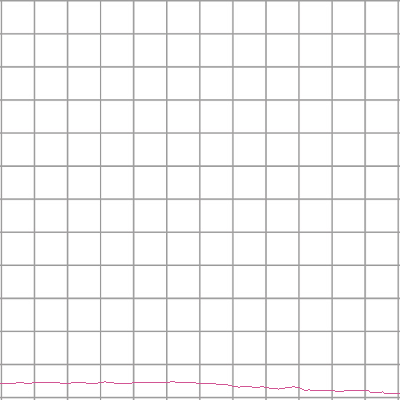

pitch69_thick0_color7_72_train.png


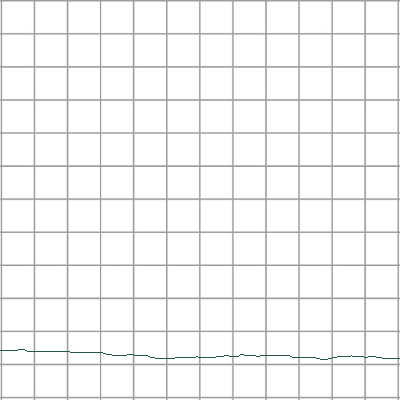

pitch70_thick0_color1_73_train.png


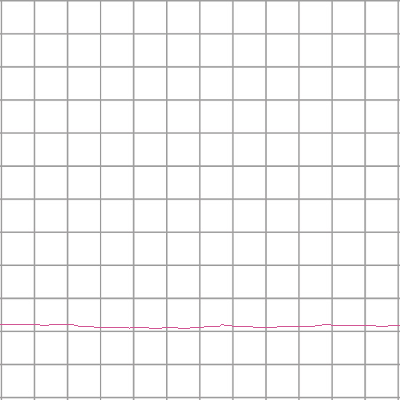

pitch71_thick0_color7_74_train.png


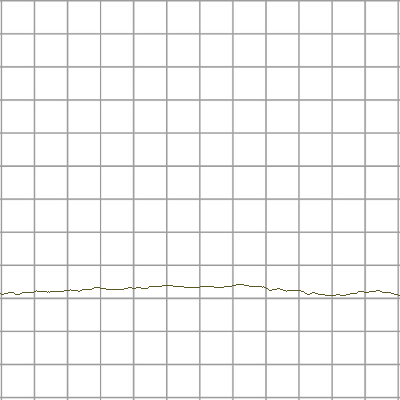

pitch72_thick0_color2_75_train.png


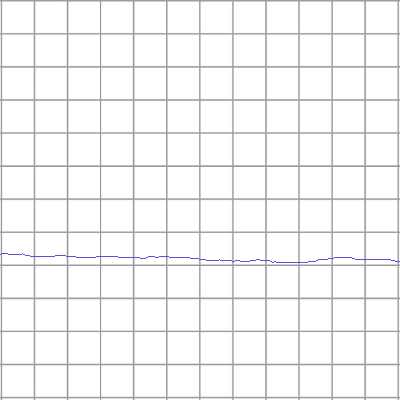

pitch73_thick0_color4_76_train.png


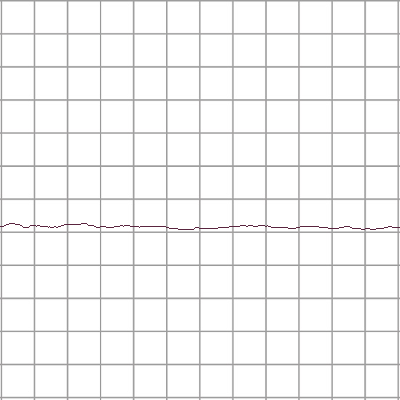

pitch74_thick0_color3_77_train.png


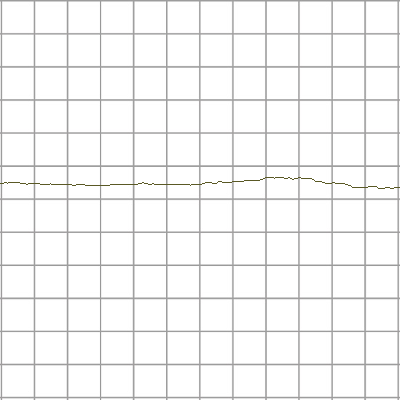

pitch75_thick0_color2_78_train.png


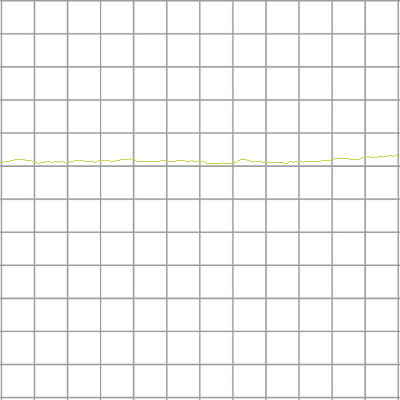

pitch76_thick0_color6_79_train.png


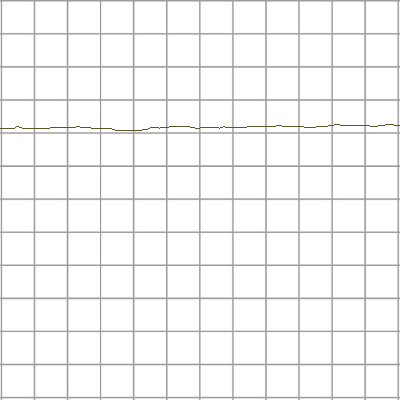

pitch77_thick0_color2_80_train.png


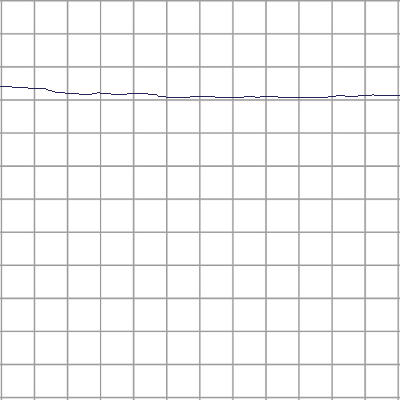

pitch78_thick0_color0_81_train.png


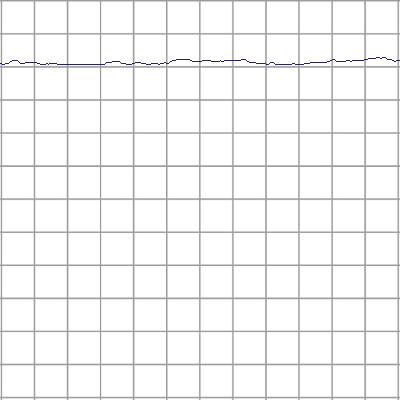

pitch79_thick0_color0_82_train.png


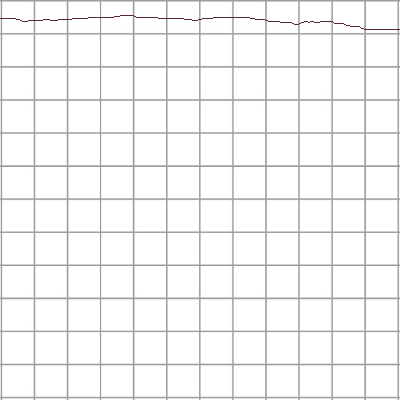

pitch80_thick0_color3_83_train.png


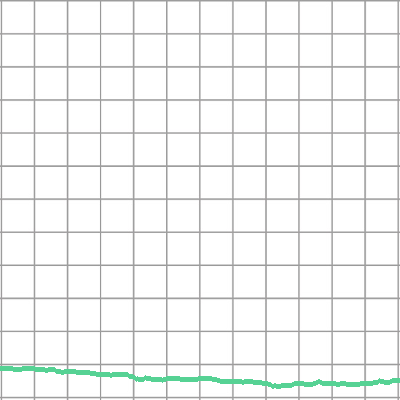

pitch69_thick1_color5_84_train.png


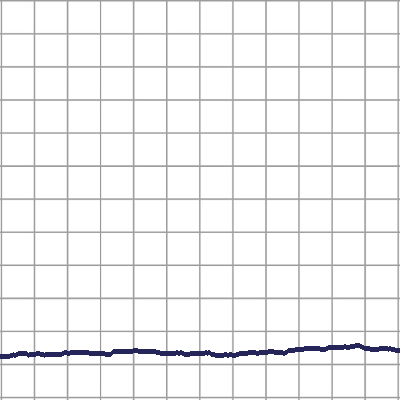

pitch70_thick1_color0_85_train.png


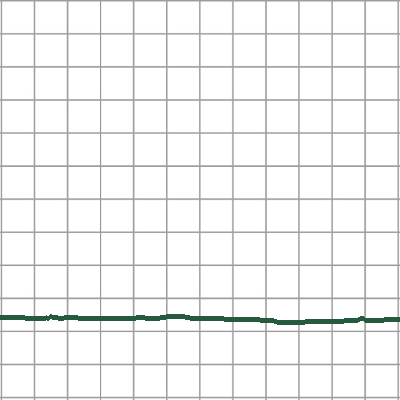

pitch71_thick1_color1_86_train.png


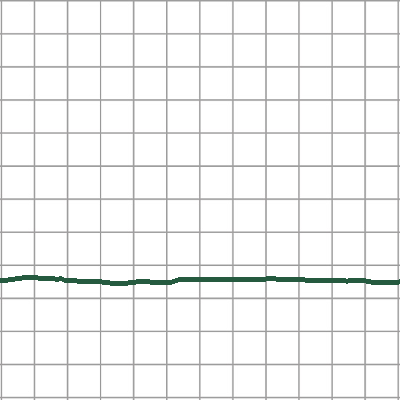

pitch72_thick1_color1_87_train.png


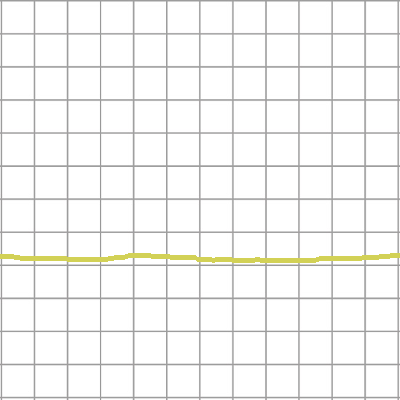

pitch73_thick1_color6_88_train.png


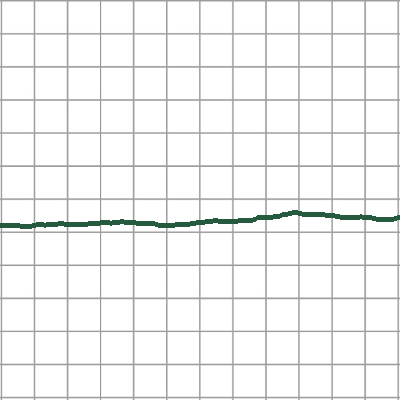

pitch74_thick1_color1_89_train.png


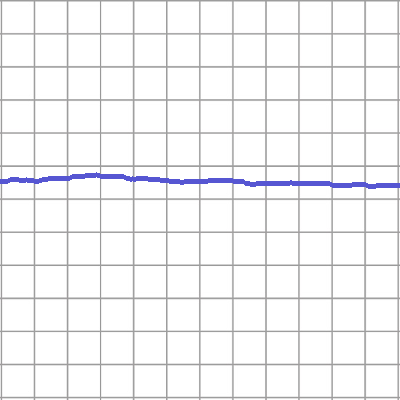

pitch75_thick1_color4_90_train.png


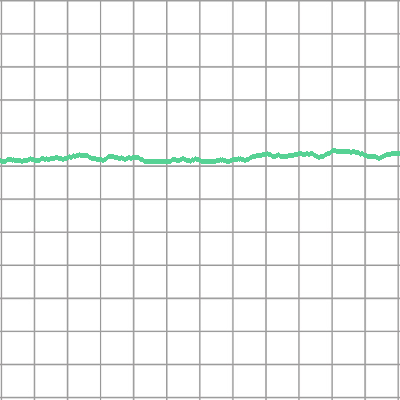

pitch76_thick1_color5_91_train.png


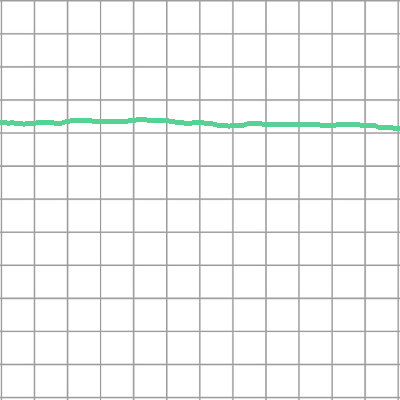

pitch77_thick1_color5_92_train.png


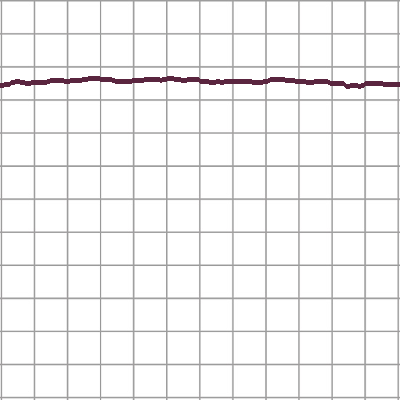

pitch78_thick1_color3_93_train.png


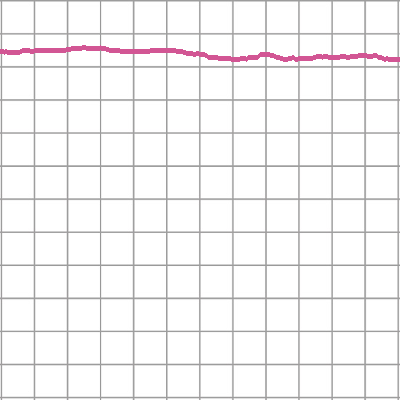

pitch79_thick1_color7_94_train.png


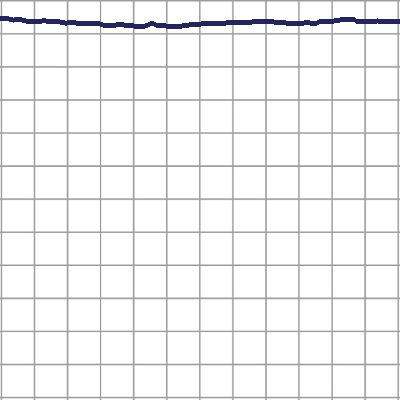

pitch80_thick1_color0_95_train.png


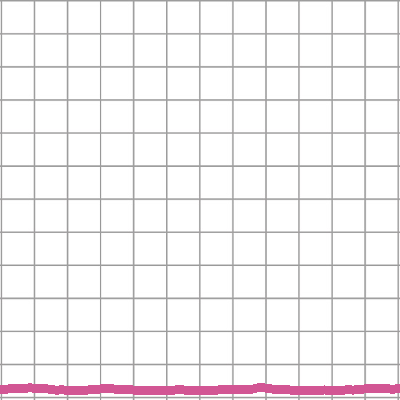

pitch69_thick2_color7_96_train.png


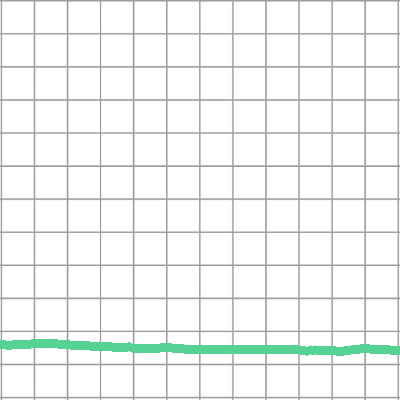

pitch70_thick2_color5_97_train.png


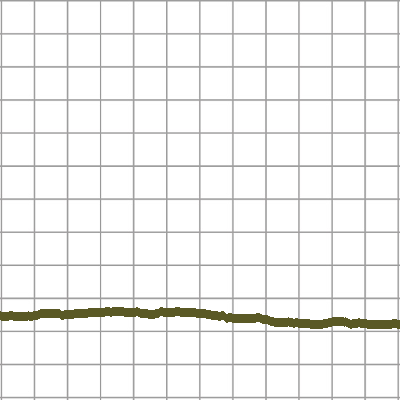

pitch71_thick2_color2_98_train.png


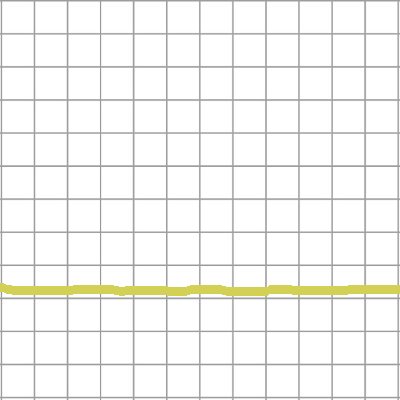

pitch72_thick2_color6_99_train.png


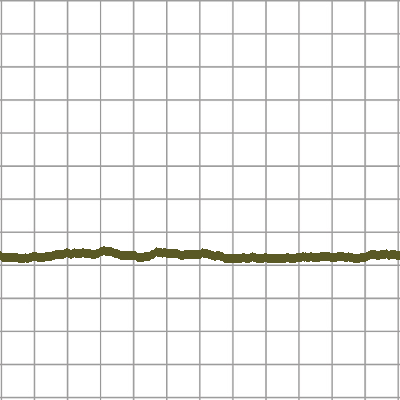

pitch73_thick2_color2_100_train.png


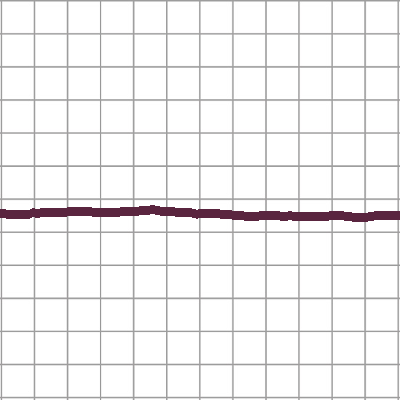

pitch74_thick2_color3_101_train.png


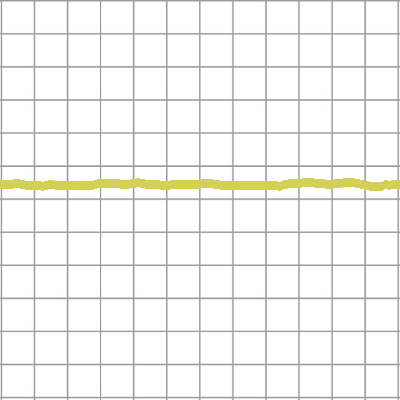

pitch75_thick2_color6_102_train.png


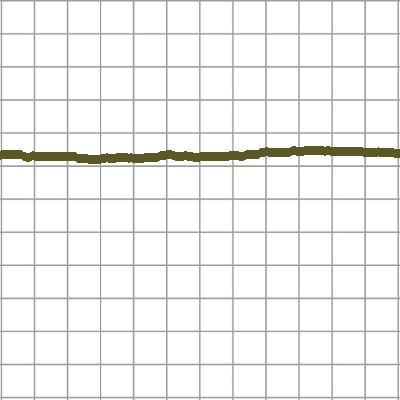

pitch76_thick2_color2_103_train.png


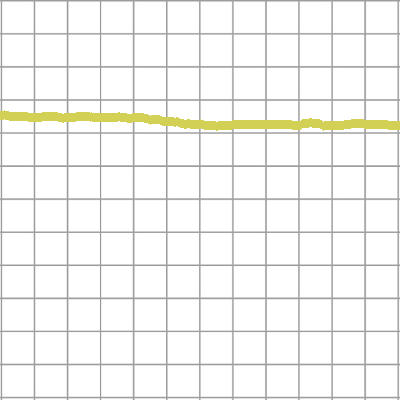

pitch77_thick2_color6_104_train.png


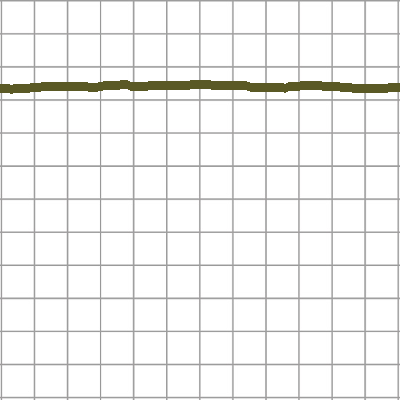

pitch78_thick2_color2_105_train.png


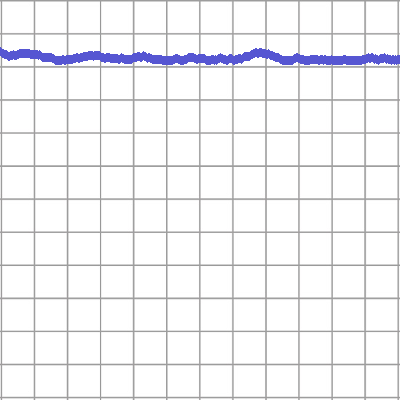

pitch79_thick2_color4_106_train.png


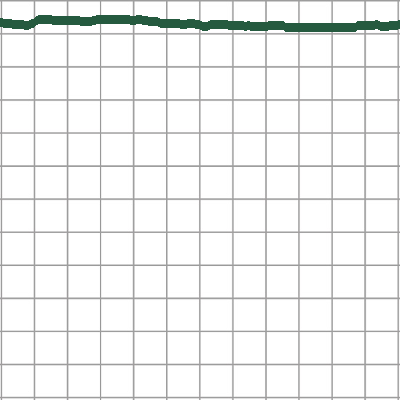

pitch80_thick2_color1_107_train.png


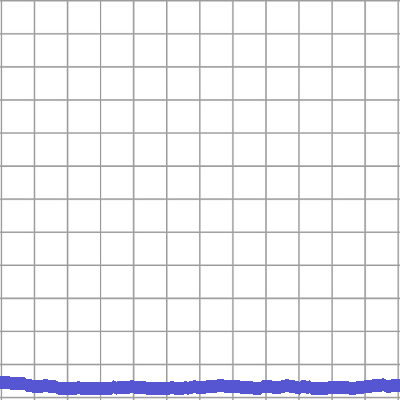

pitch69_thick3_color4_108_train.png


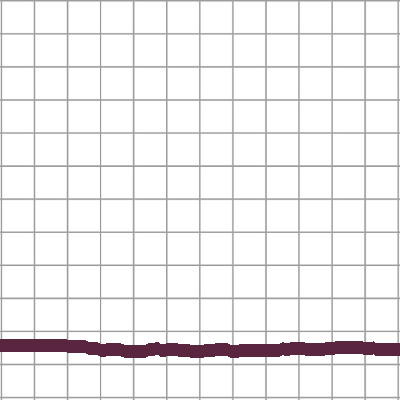

pitch70_thick3_color3_109_train.png


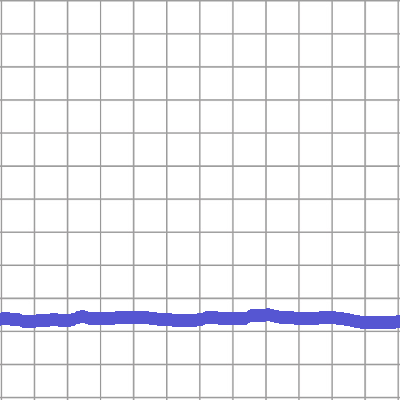

pitch71_thick3_color4_110_train.png


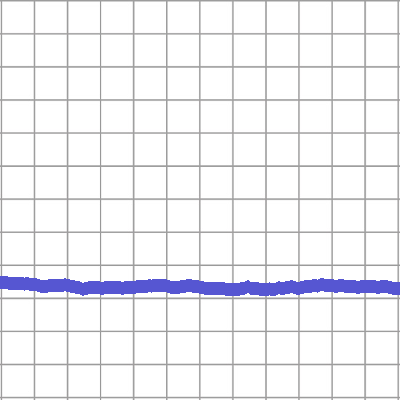

pitch72_thick3_color4_111_train.png


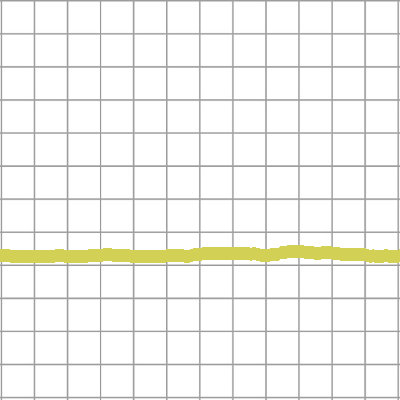

pitch73_thick3_color6_112_train.png


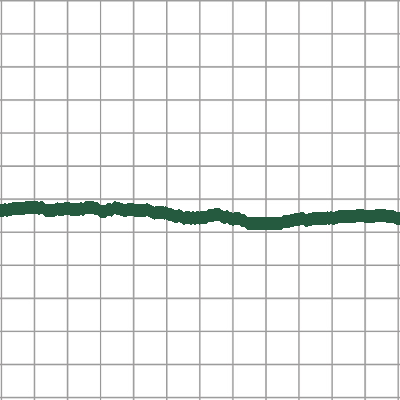

pitch74_thick3_color1_113_train.png


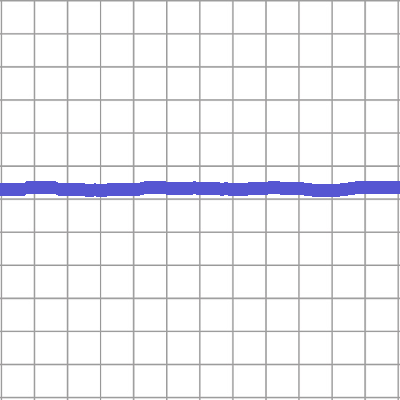

pitch75_thick3_color4_114_train.png


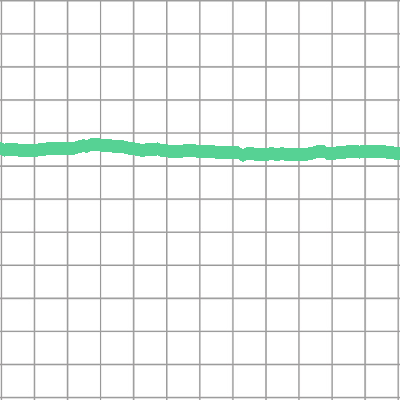

pitch76_thick3_color5_115_train.png


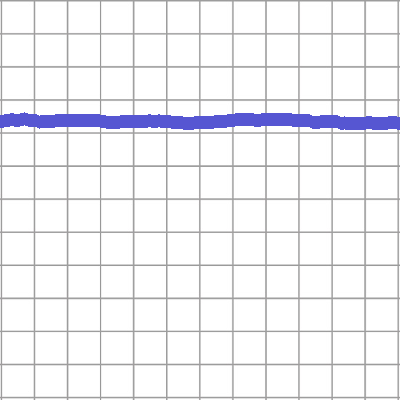

pitch77_thick3_color4_116_train.png


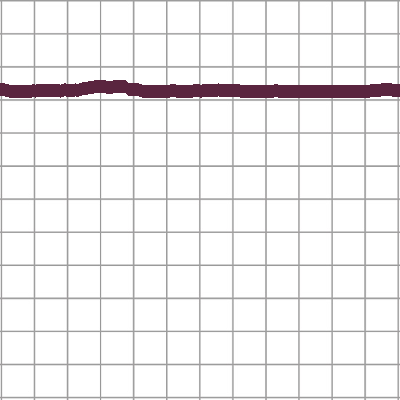

pitch78_thick3_color3_117_train.png


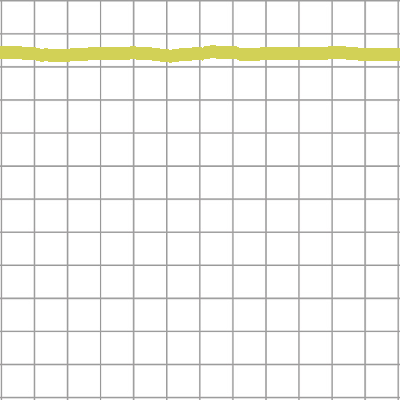

pitch79_thick3_color6_118_train.png


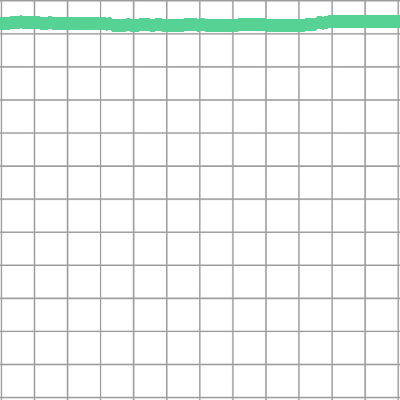

pitch80_thick3_color5_119_train.png


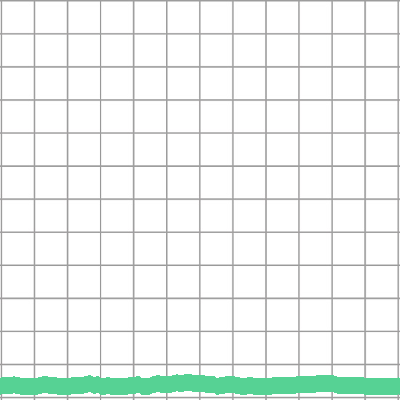

pitch69_thick4_color5_120_train.png


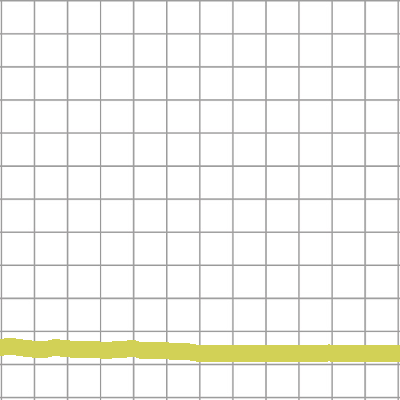

pitch70_thick4_color6_121_train.png


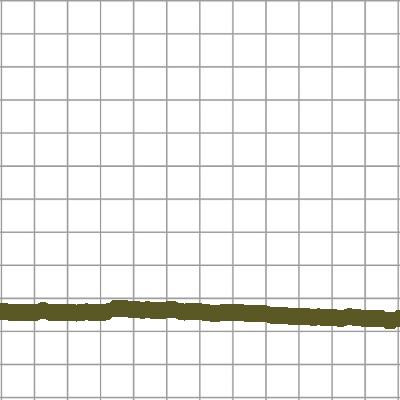

pitch71_thick4_color2_122_train.png


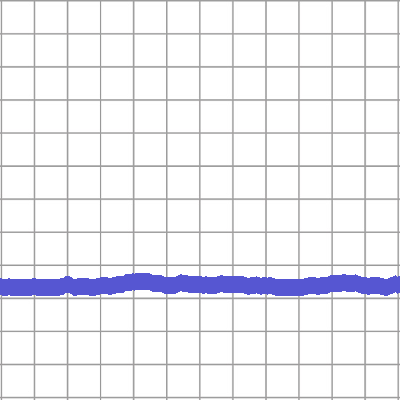

pitch72_thick4_color4_123_train.png


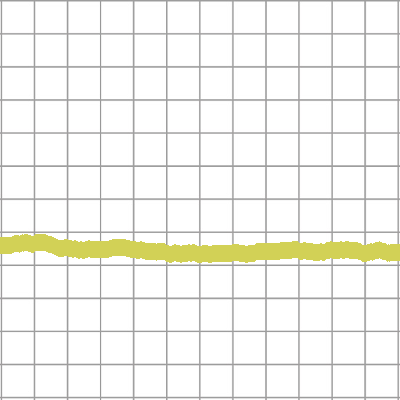

pitch73_thick4_color6_124_train.png


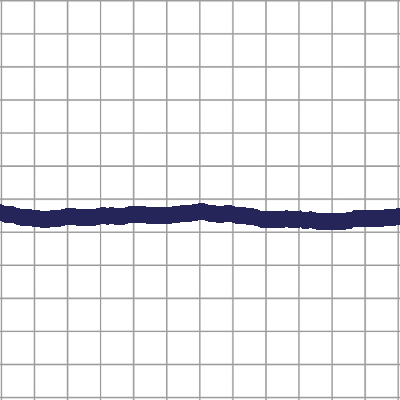

pitch74_thick4_color0_125_train.png


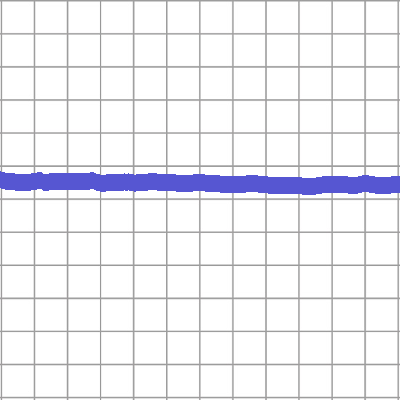

pitch75_thick4_color4_126_train.png


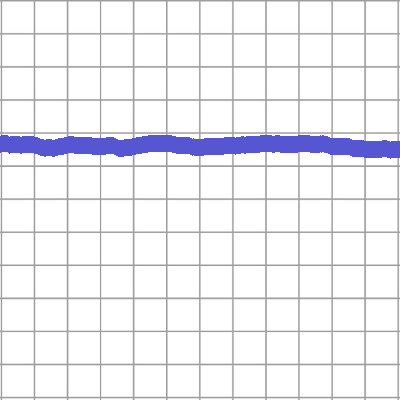

pitch76_thick4_color4_127_train.png


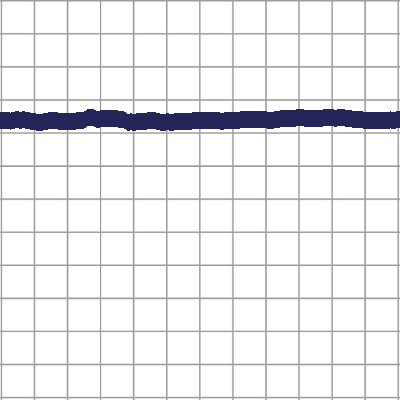

pitch77_thick4_color0_128_train.png


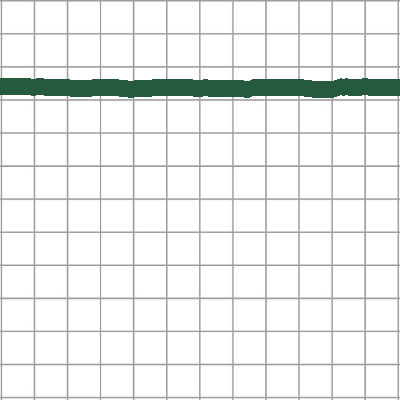

pitch78_thick4_color1_129_train.png


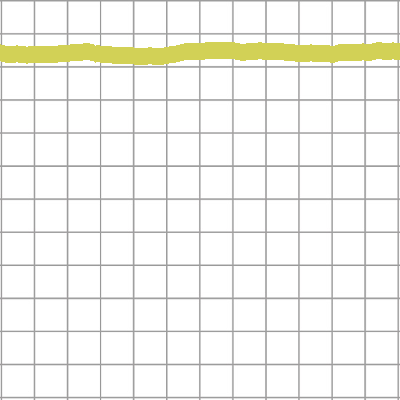

pitch79_thick4_color6_130_train.png


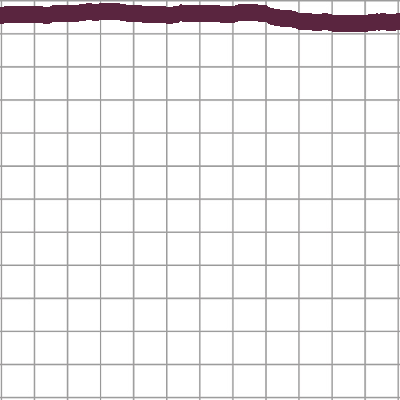

pitch80_thick4_color3_131_train.png


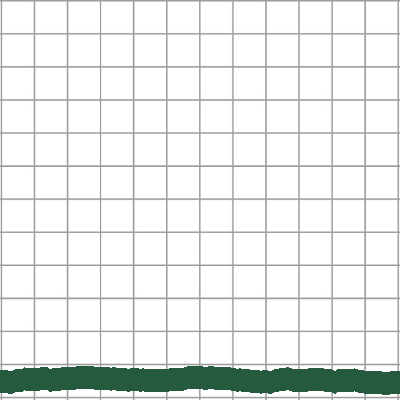

pitch69_thick5_color1_132_train.png


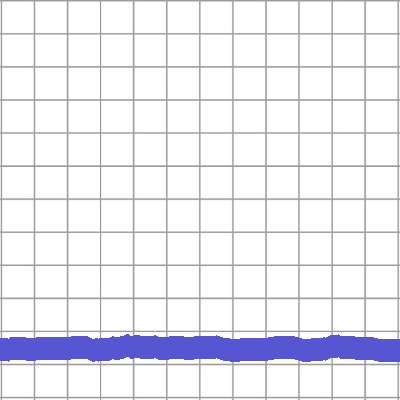

pitch70_thick5_color4_133_train.png


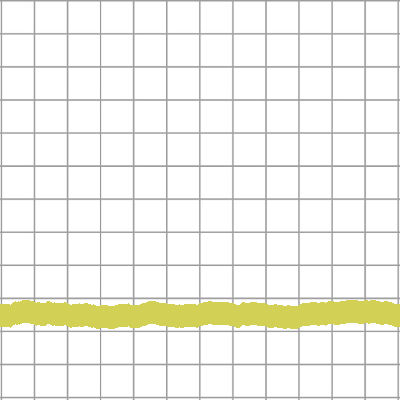

pitch71_thick5_color6_134_train.png


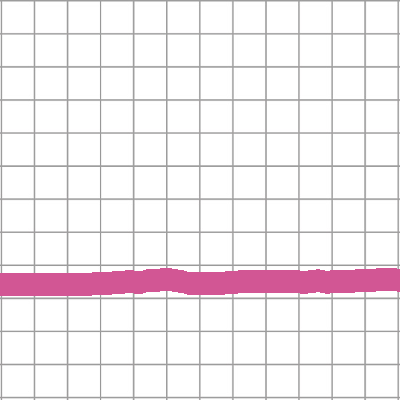

pitch72_thick5_color7_135_train.png


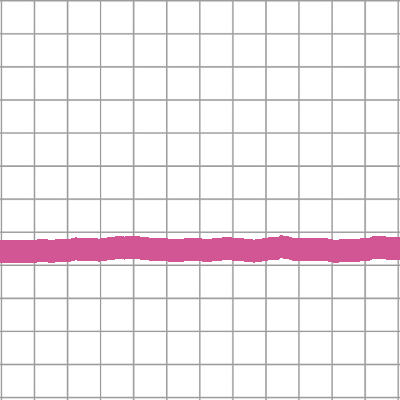

pitch73_thick5_color7_136_train.png


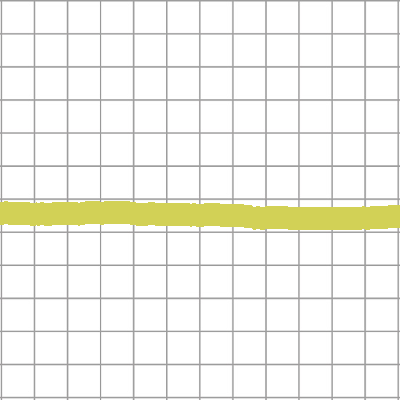

pitch74_thick5_color6_137_train.png


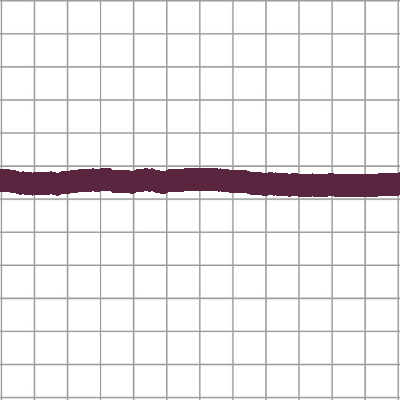

pitch75_thick5_color3_138_train.png


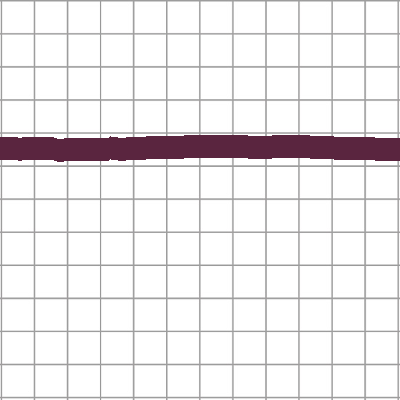

pitch76_thick5_color3_139_train.png


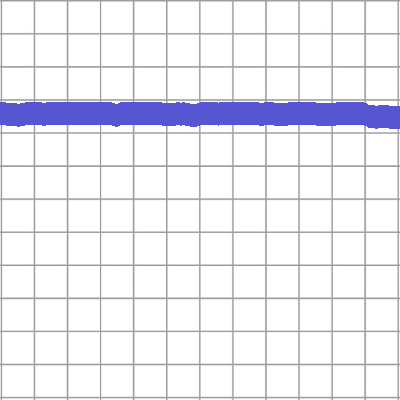

pitch77_thick5_color4_140_train.png


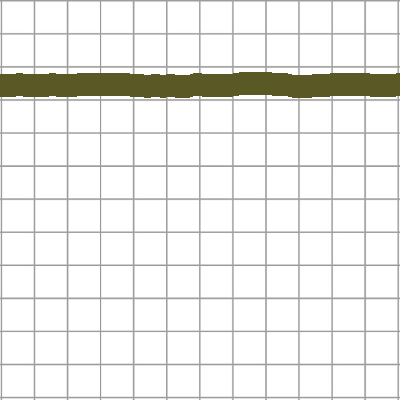

pitch78_thick5_color2_141_train.png


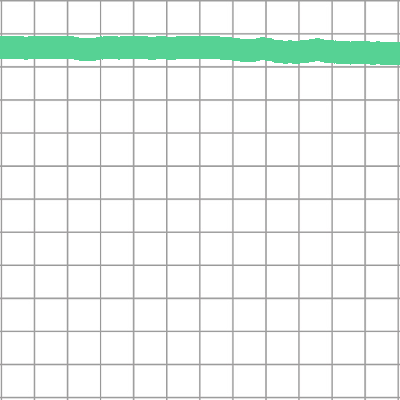

pitch79_thick5_color5_142_train.png


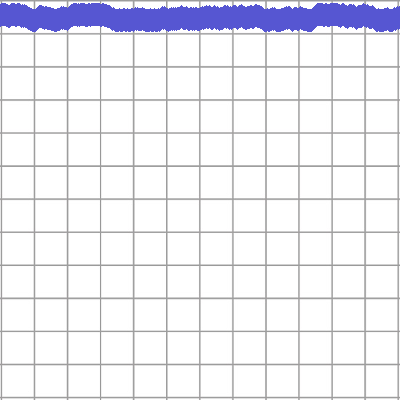

pitch80_thick5_color4_143_train.png


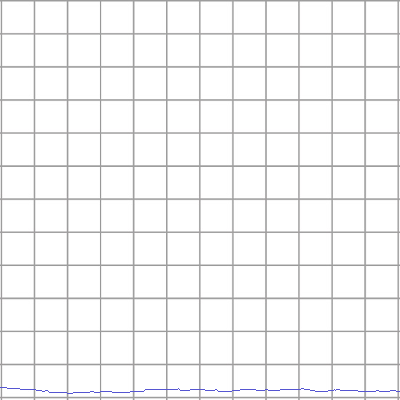

pitch69_thick0_color4_144_train.png


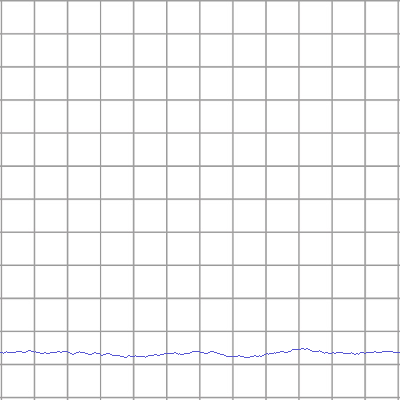

pitch70_thick0_color4_145_train.png


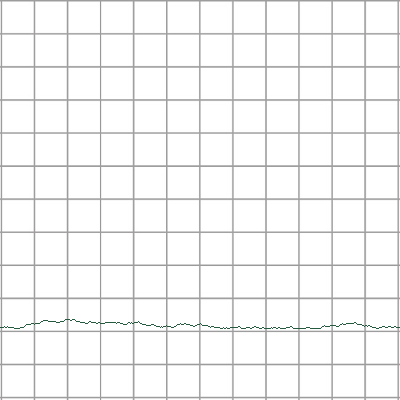

pitch71_thick0_color1_146_train.png


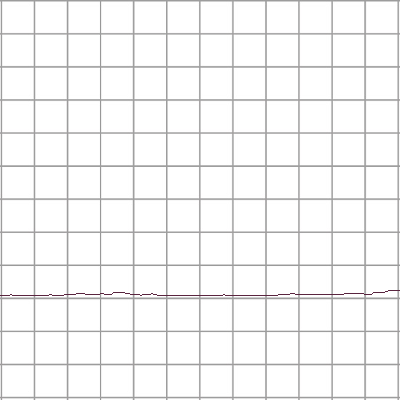

pitch72_thick0_color3_147_train.png


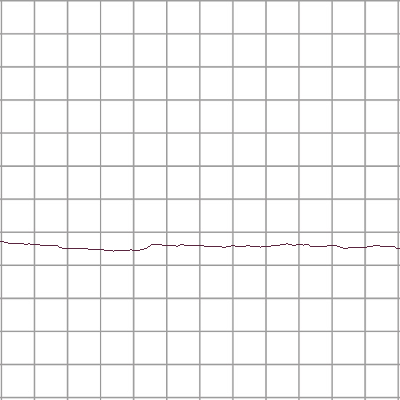

pitch73_thick0_color3_148_train.png


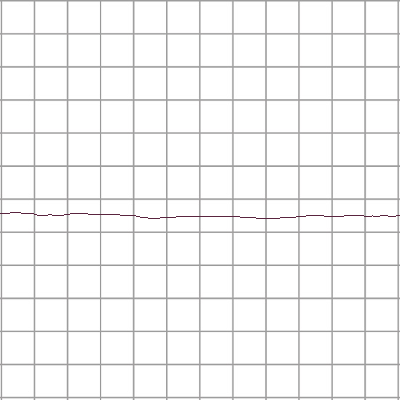

pitch74_thick0_color3_149_train.png


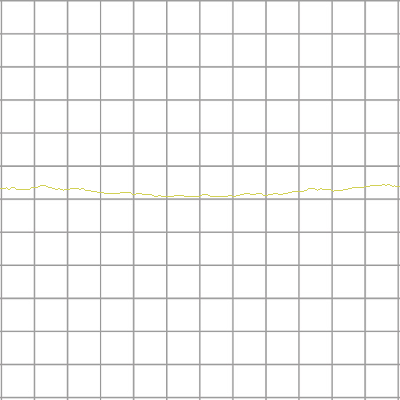

pitch75_thick0_color6_150_train.png


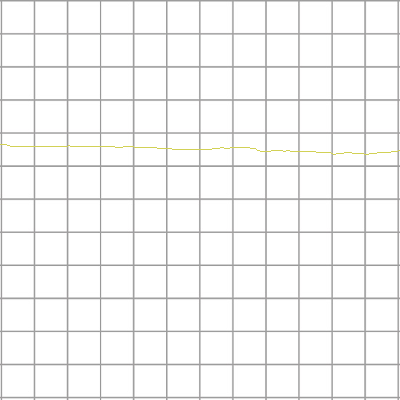

pitch76_thick0_color6_151_train.png


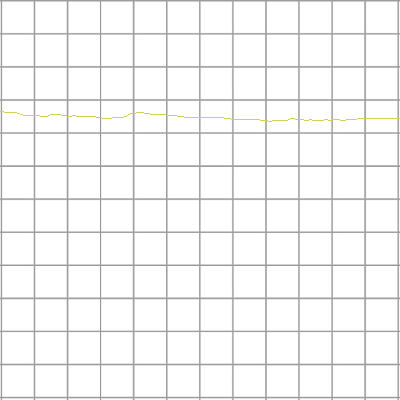

pitch77_thick0_color6_152_train.png


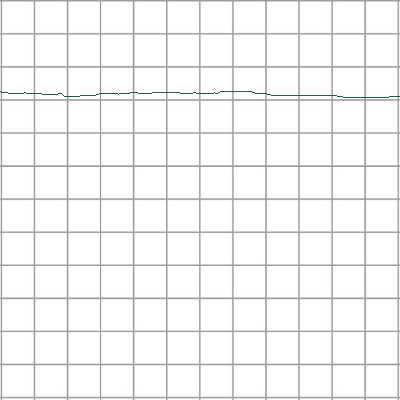

pitch78_thick0_color1_153_train.png


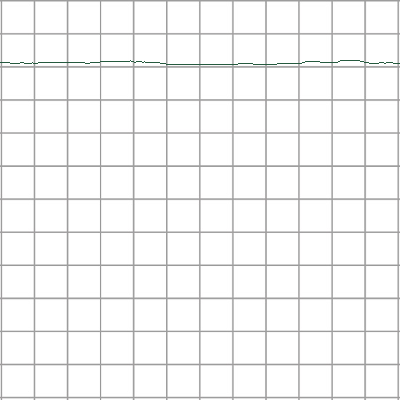

pitch79_thick0_color1_154_train.png


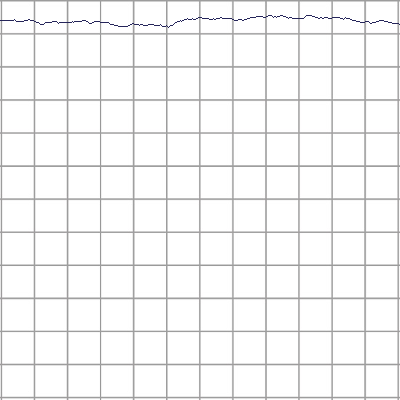

pitch80_thick0_color0_155_train.png


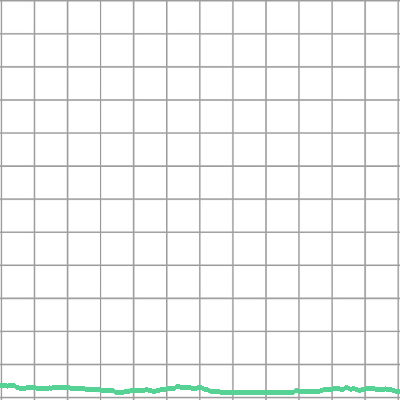

pitch69_thick1_color5_156_train.png


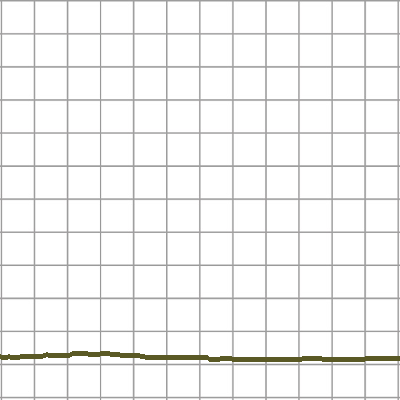

pitch70_thick1_color2_157_train.png


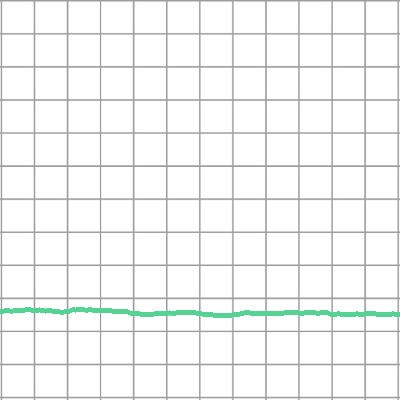

pitch71_thick1_color5_158_train.png


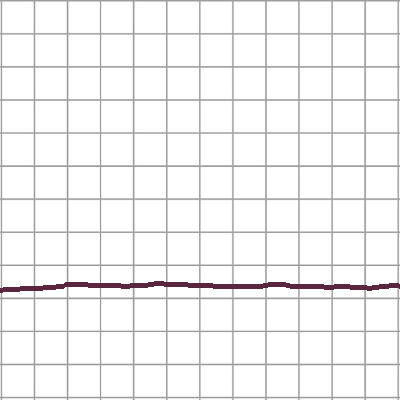

pitch72_thick1_color3_159_train.png


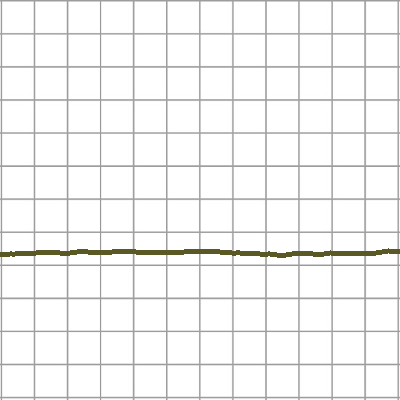

pitch73_thick1_color2_160_train.png


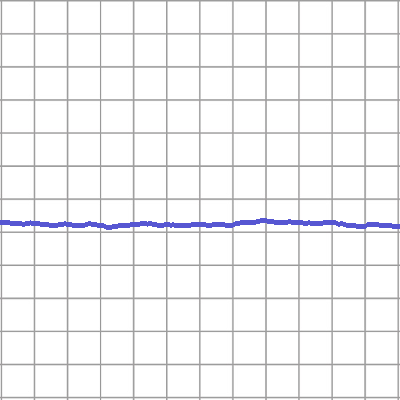

pitch74_thick1_color4_161_train.png


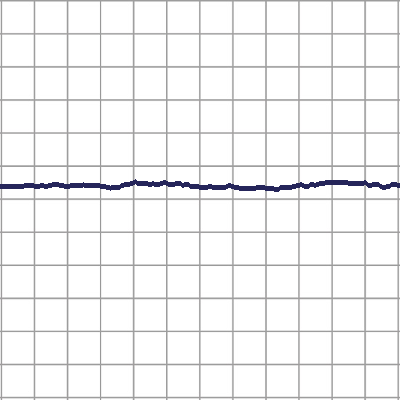

pitch75_thick1_color0_162_train.png


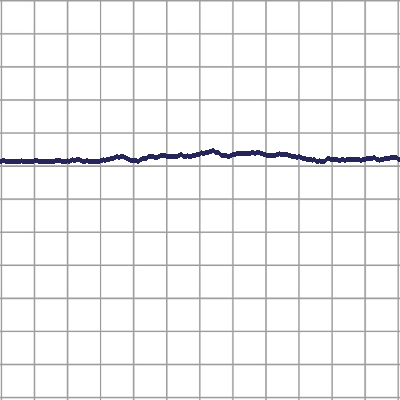

pitch76_thick1_color0_163_train.png


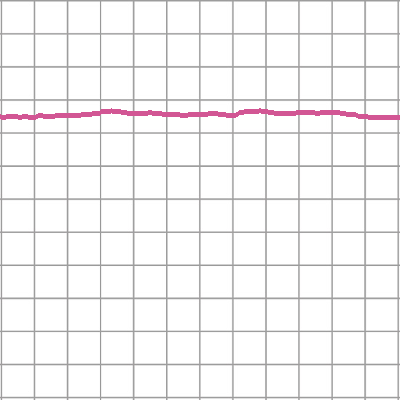

pitch77_thick1_color7_164_train.png


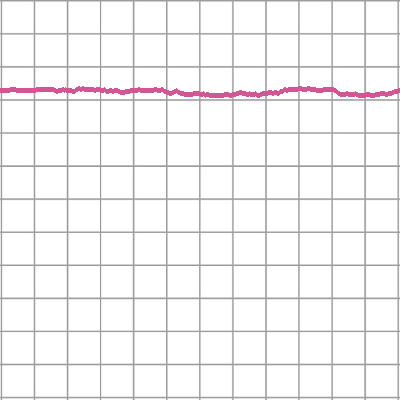

pitch78_thick1_color7_165_train.png


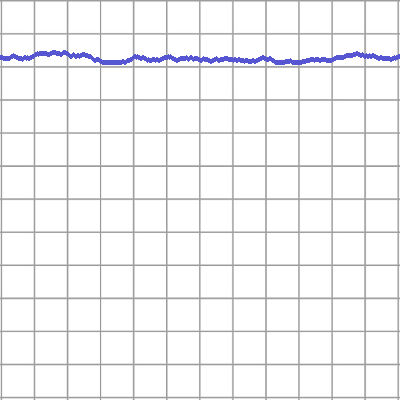

pitch79_thick1_color4_166_train.png


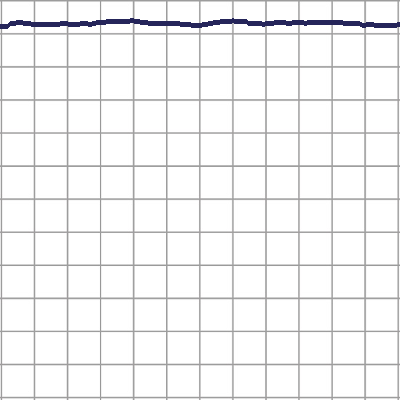

pitch80_thick1_color0_167_train.png


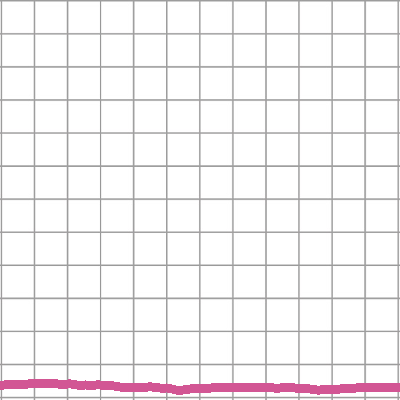

pitch69_thick2_color7_168_train.png


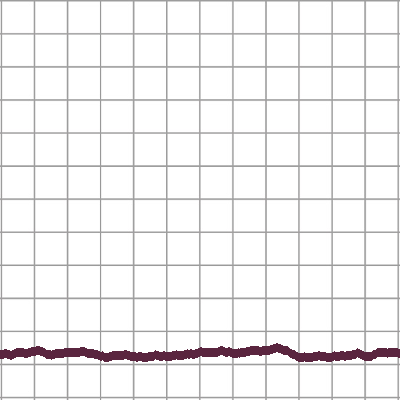

pitch70_thick2_color3_169_train.png


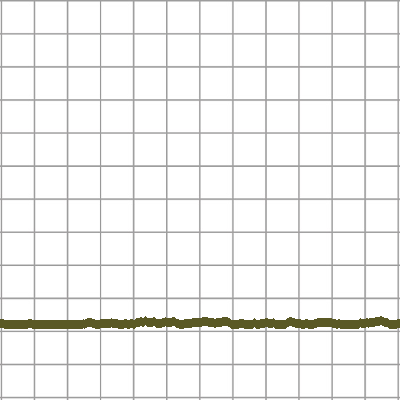

pitch71_thick2_color2_170_train.png


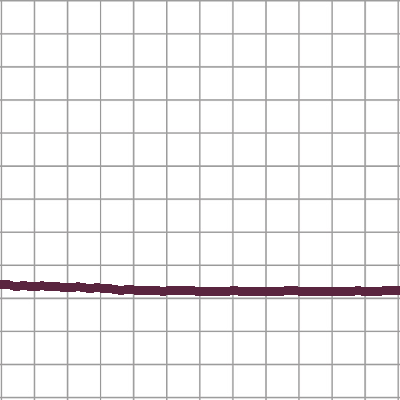

pitch72_thick2_color3_171_train.png


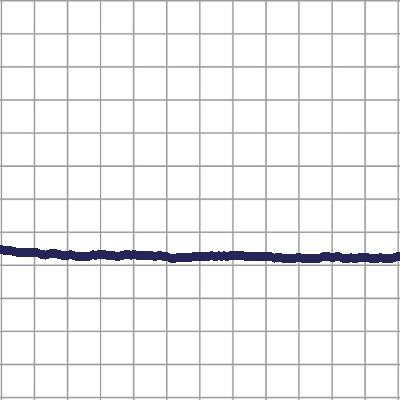

pitch73_thick2_color0_172_train.png


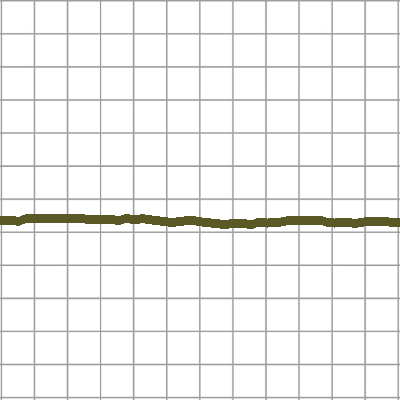

pitch74_thick2_color2_173_train.png


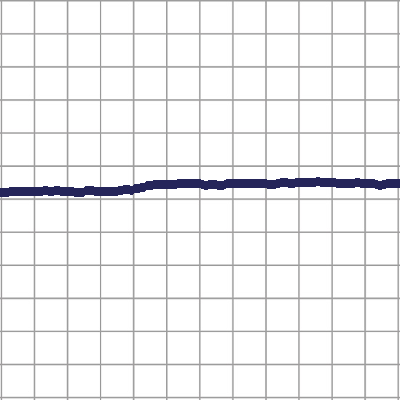

pitch75_thick2_color0_174_train.png


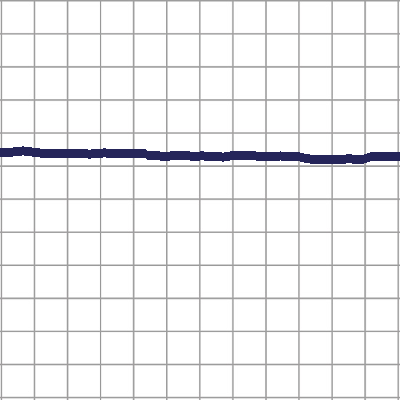

pitch76_thick2_color0_175_train.png


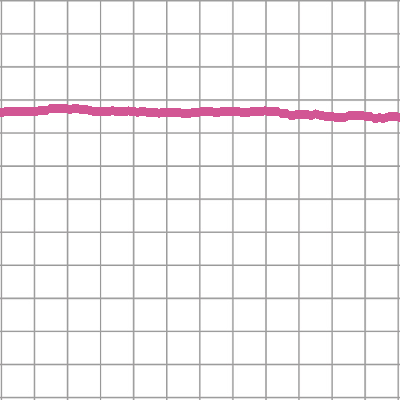

pitch77_thick2_color7_176_train.png


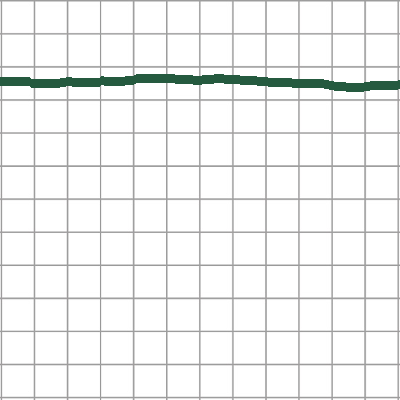

pitch78_thick2_color1_177_train.png


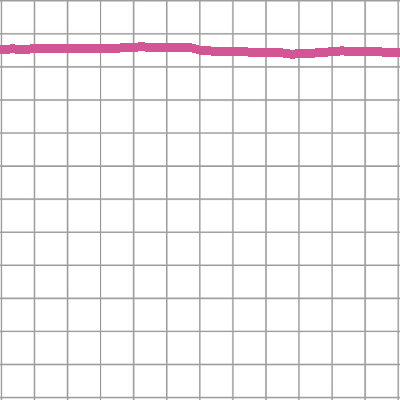

pitch79_thick2_color7_178_train.png


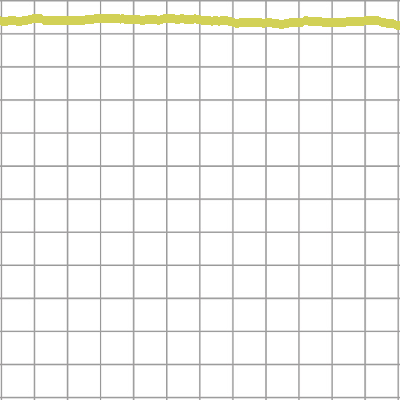

pitch80_thick2_color6_179_train.png


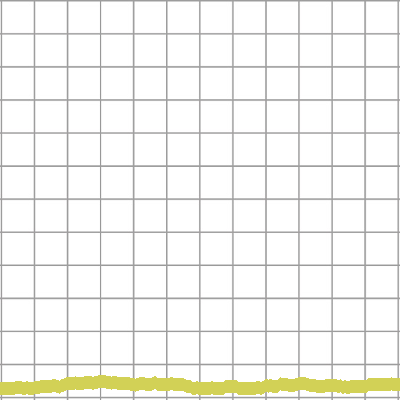

pitch69_thick3_color6_180_train.png


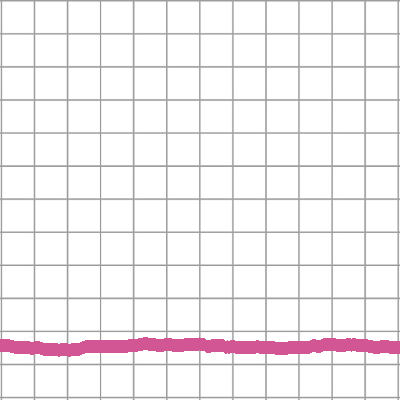

pitch70_thick3_color7_181_train.png


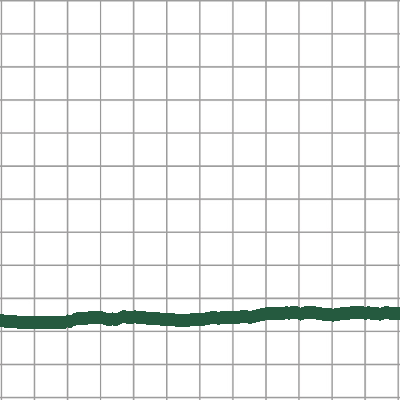

pitch71_thick3_color1_182_train.png


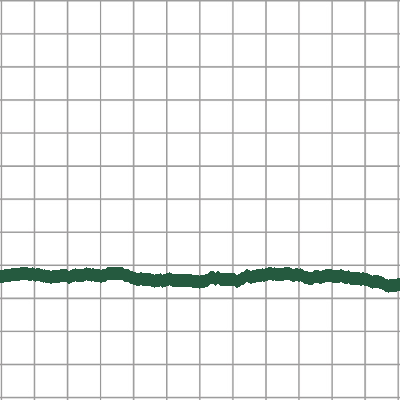

pitch72_thick3_color1_183_train.png


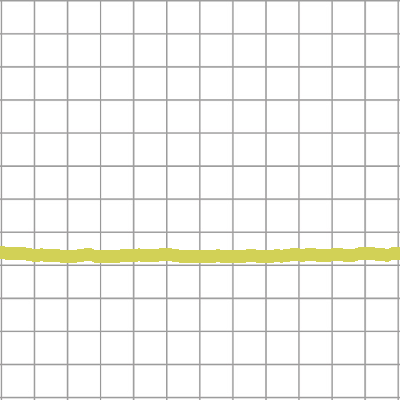

pitch73_thick3_color6_184_train.png


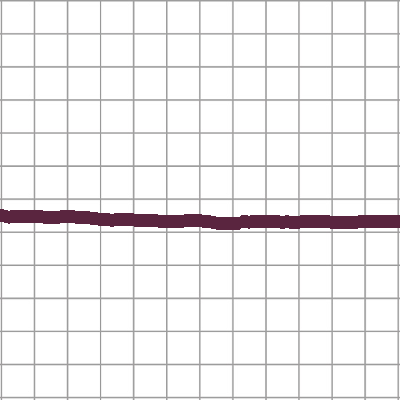

pitch74_thick3_color3_185_train.png


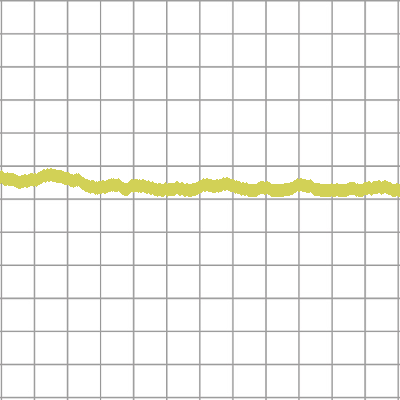

pitch75_thick3_color6_186_train.png


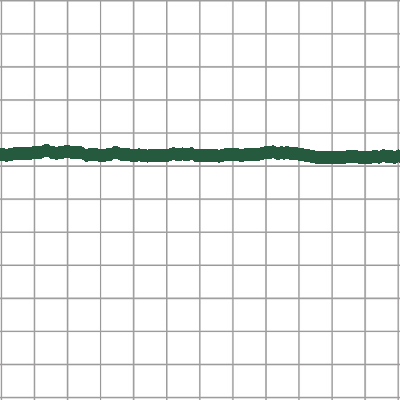

pitch76_thick3_color1_187_train.png


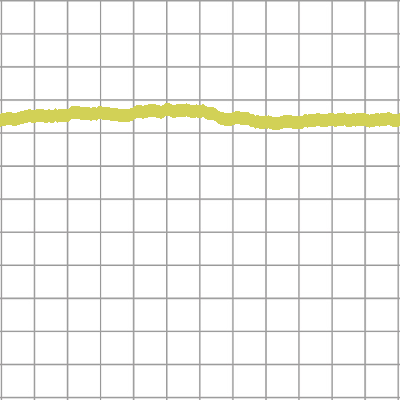

pitch77_thick3_color6_188_train.png


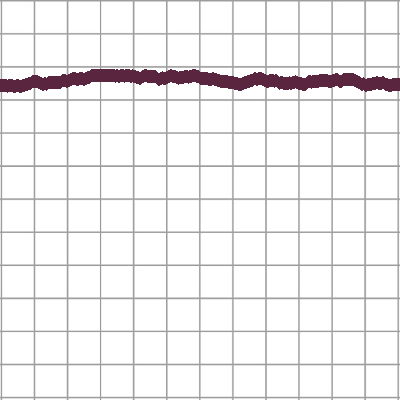

pitch78_thick3_color3_189_train.png


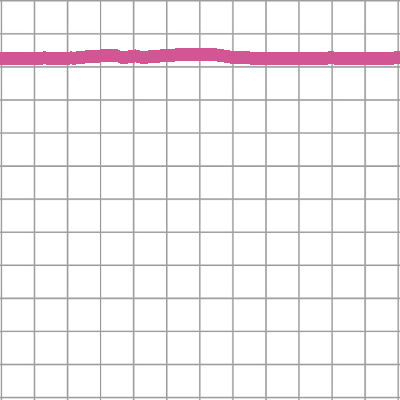

pitch79_thick3_color7_190_train.png


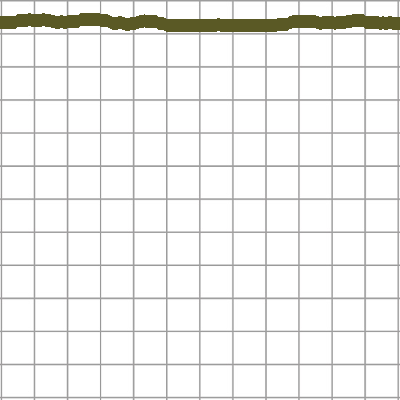

pitch80_thick3_color2_191_train.png


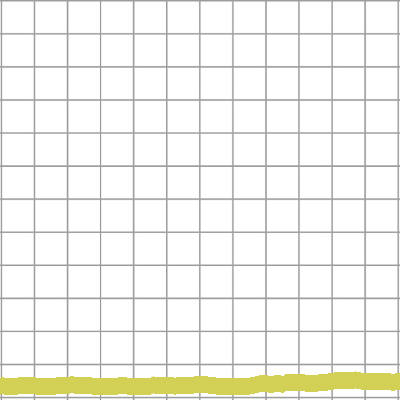

pitch69_thick4_color6_192_train.png


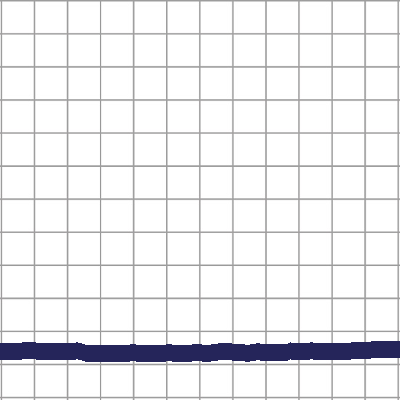

pitch70_thick4_color0_193_train.png


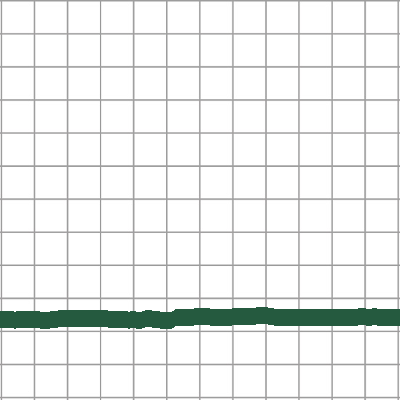

pitch71_thick4_color1_194_train.png


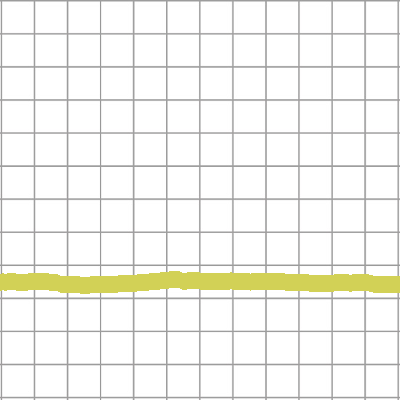

pitch72_thick4_color6_195_train.png


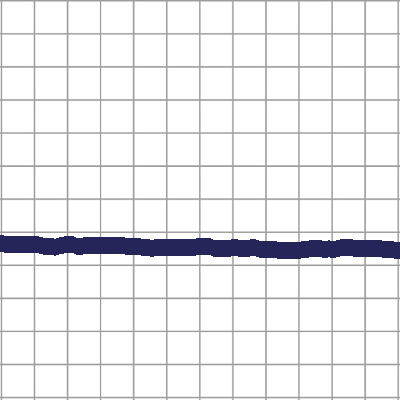

pitch73_thick4_color0_196_train.png


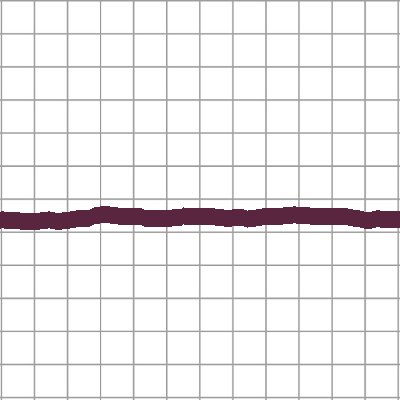

pitch74_thick4_color3_197_train.png


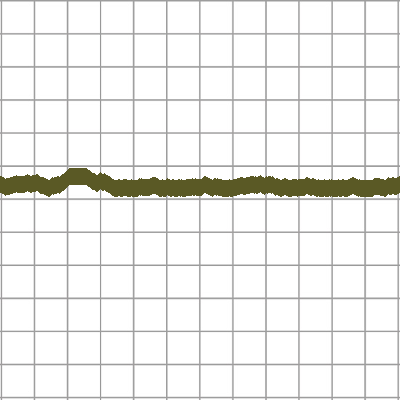

pitch75_thick4_color2_198_train.png


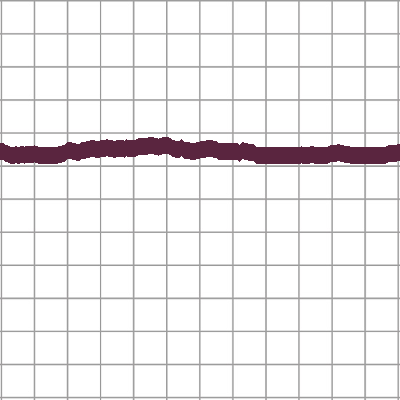

pitch76_thick4_color3_199_train.png


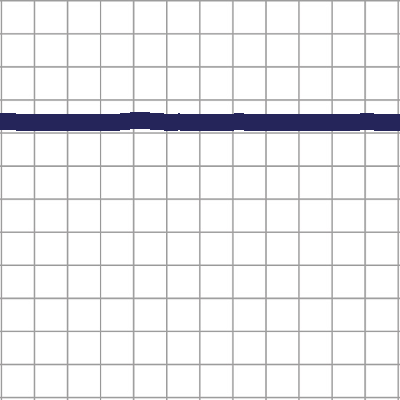

pitch77_thick4_color0_200_train.png


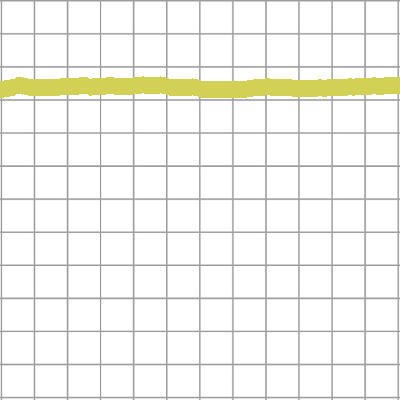

pitch78_thick4_color6_201_train.png


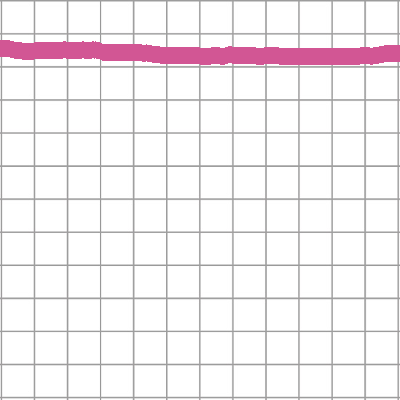

pitch79_thick4_color7_202_train.png


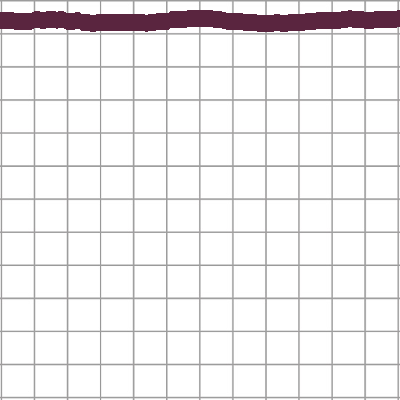

pitch80_thick4_color3_203_train.png


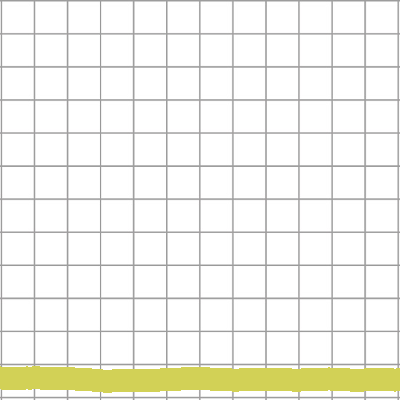

pitch69_thick5_color6_204_train.png


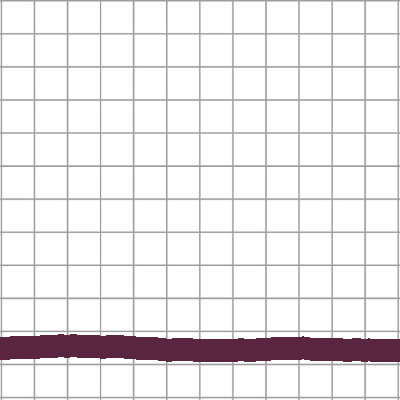

pitch70_thick5_color3_205_train.png


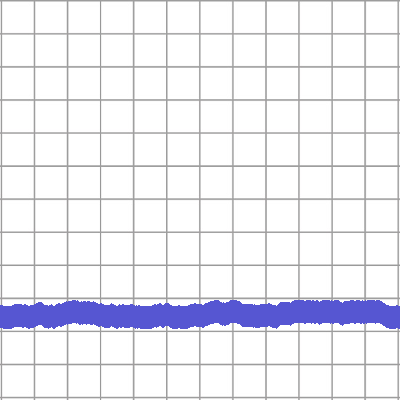

pitch71_thick5_color4_206_train.png


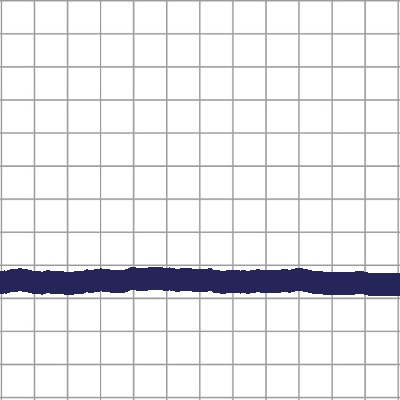

pitch72_thick5_color0_207_train.png


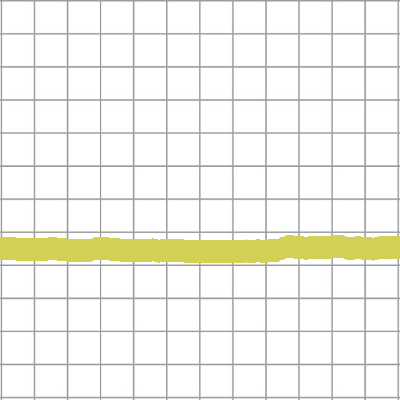

pitch73_thick5_color6_208_train.png


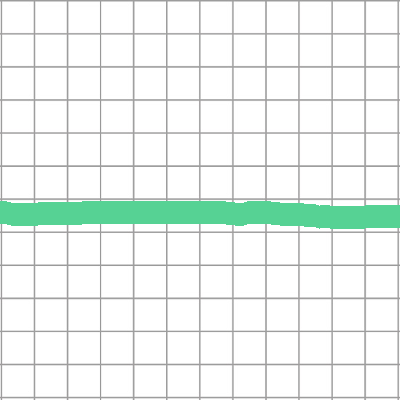

pitch74_thick5_color5_209_train.png


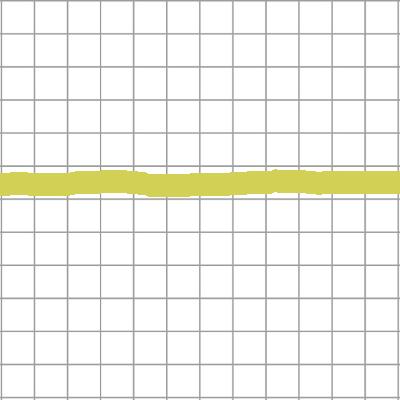

pitch75_thick5_color6_210_train.png


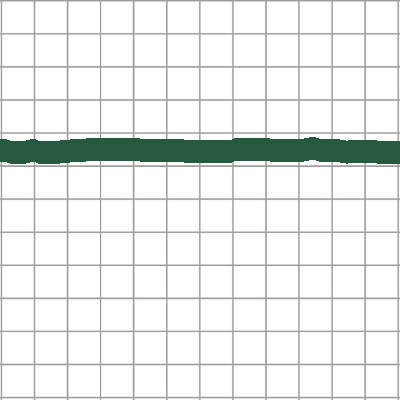

pitch76_thick5_color1_211_train.png


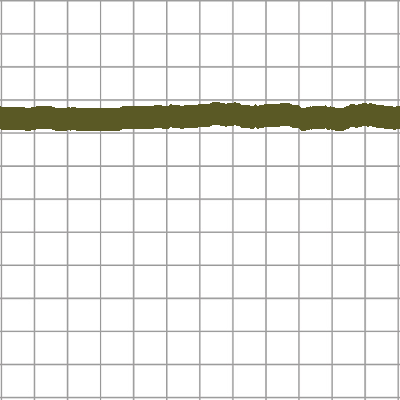

pitch77_thick5_color2_212_train.png


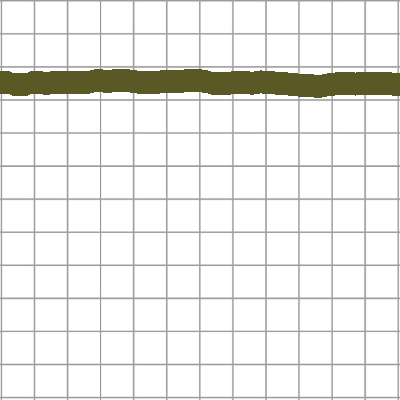

pitch78_thick5_color2_213_train.png


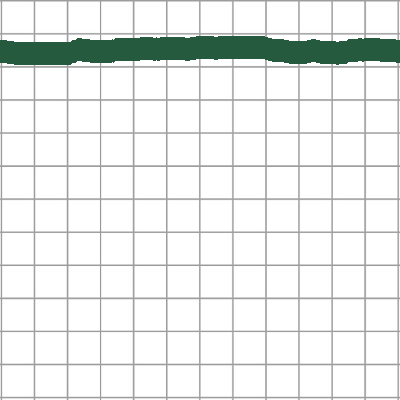

pitch79_thick5_color1_214_train.png


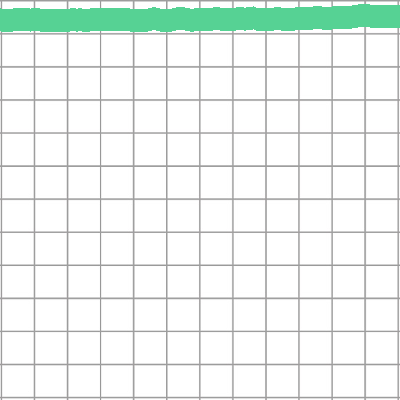

pitch80_thick5_color5_215_train.png


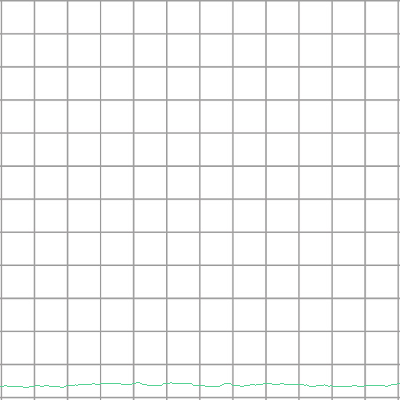

pitch69_thick0_color5_216_train.png


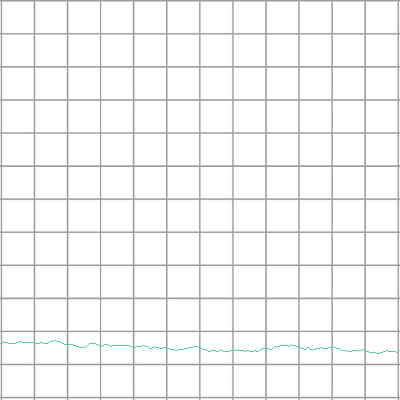

pitch70_thick0_color5_217_train.png


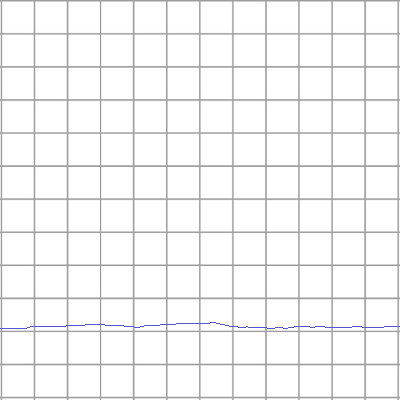

pitch71_thick0_color4_218_train.png


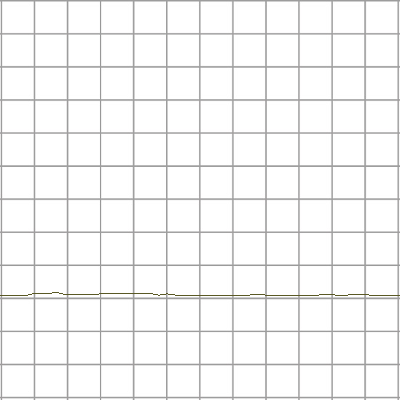

pitch72_thick0_color2_219_train.png


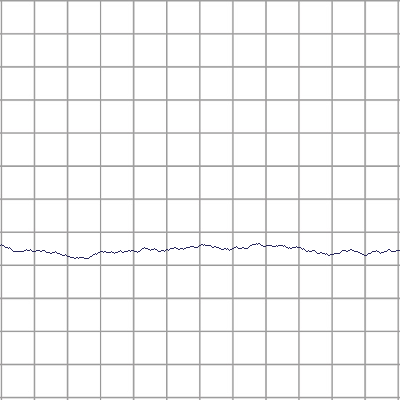

pitch73_thick0_color0_220_train.png


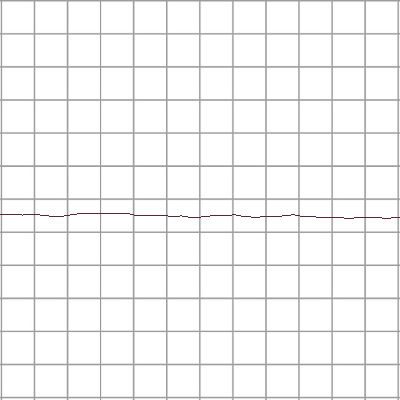

pitch74_thick0_color3_221_train.png


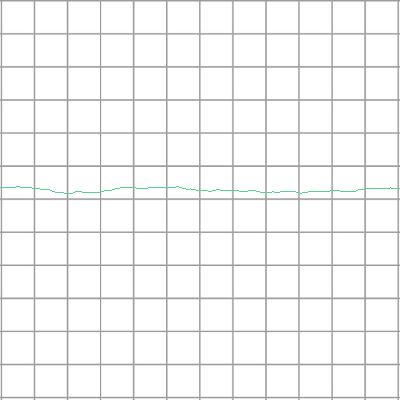

pitch75_thick0_color5_222_train.png


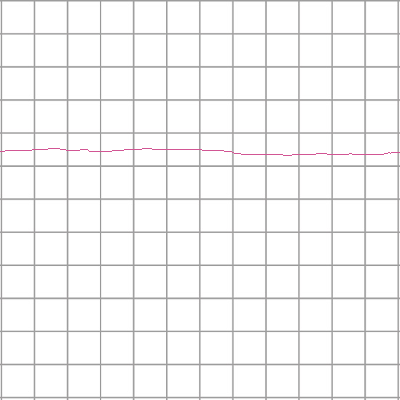

pitch76_thick0_color7_223_train.png


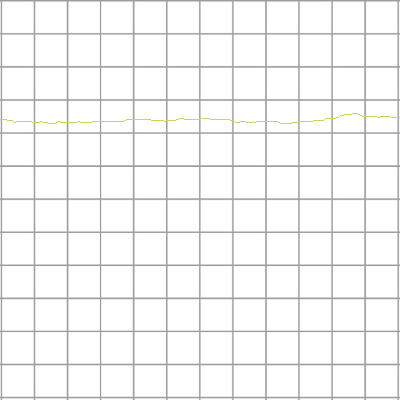

pitch77_thick0_color6_224_train.png


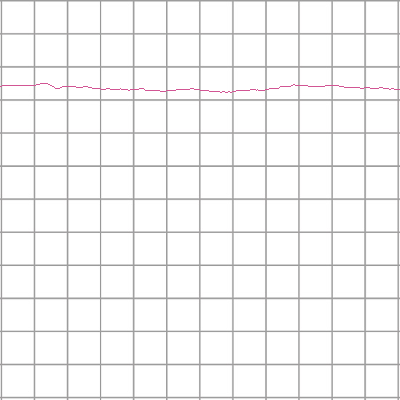

pitch78_thick0_color7_225_train.png


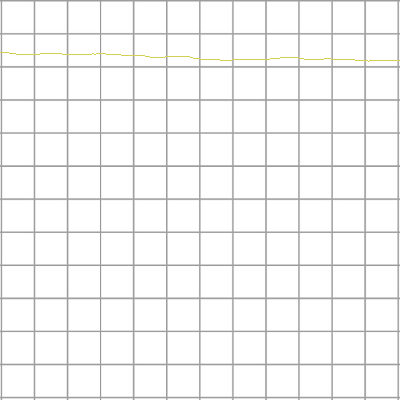

pitch79_thick0_color6_226_train.png


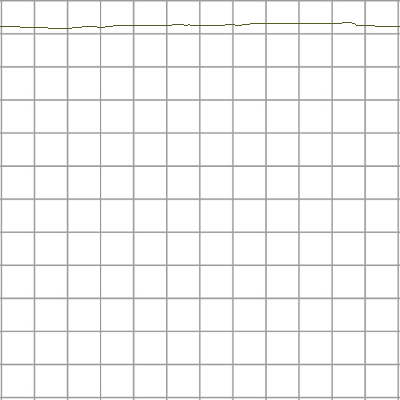

pitch80_thick0_color2_227_train.png


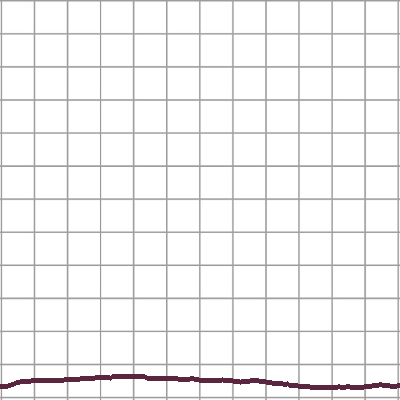

pitch69_thick1_color3_228_train.png


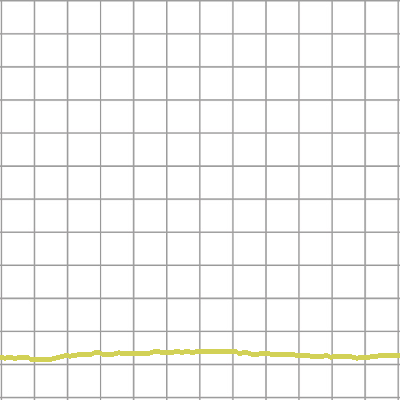

pitch70_thick1_color6_229_train.png


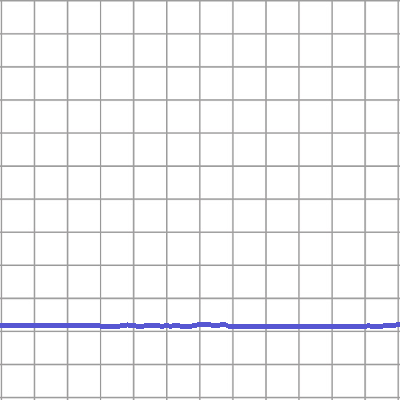

pitch71_thick1_color4_230_train.png


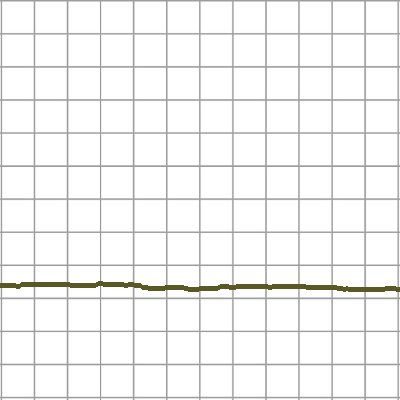

pitch72_thick1_color2_231_train.png


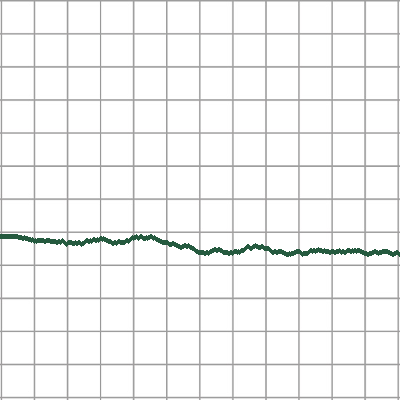

pitch73_thick1_color1_232_train.png


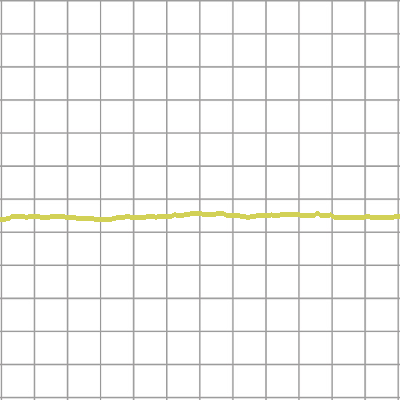

pitch74_thick1_color6_233_train.png


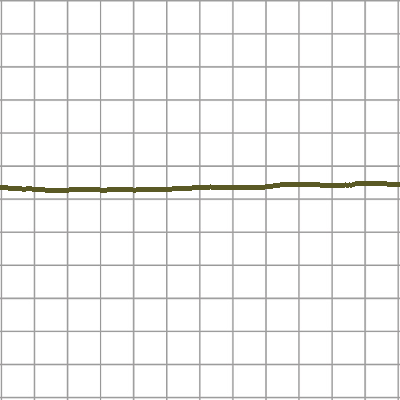

pitch75_thick1_color2_234_train.png


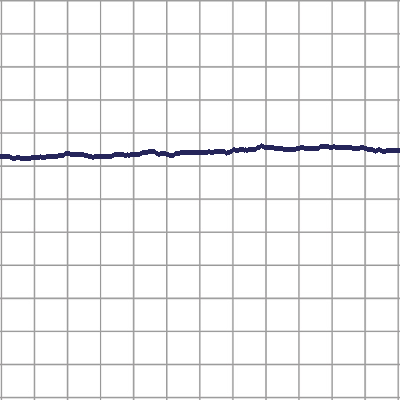

pitch76_thick1_color0_235_train.png


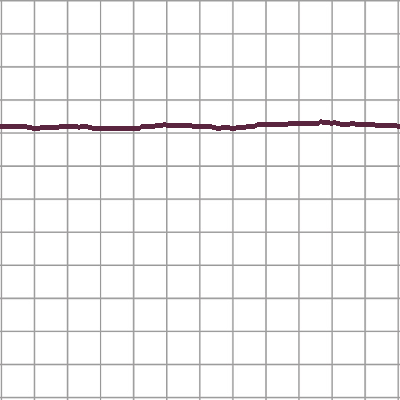

pitch77_thick1_color3_236_train.png


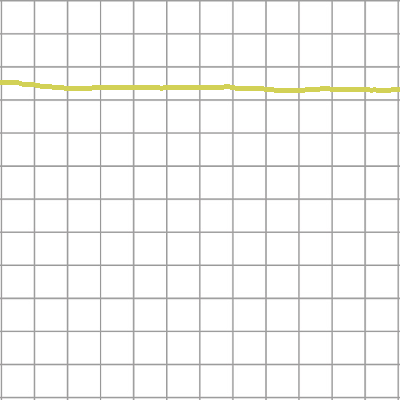

pitch78_thick1_color6_237_train.png


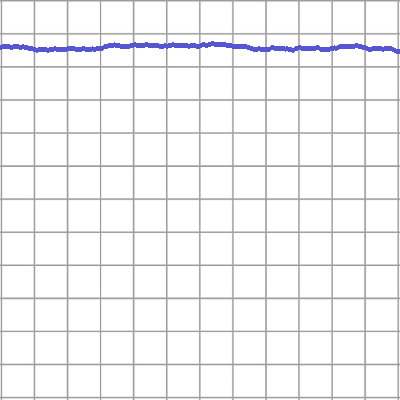

pitch79_thick1_color4_238_train.png


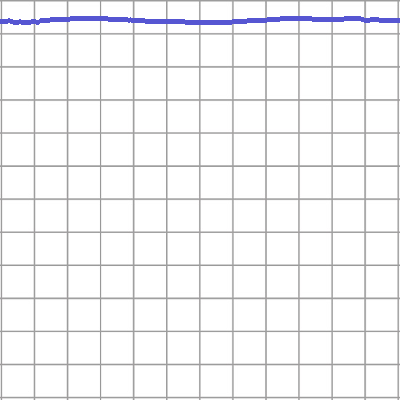

pitch80_thick1_color4_239_train.png


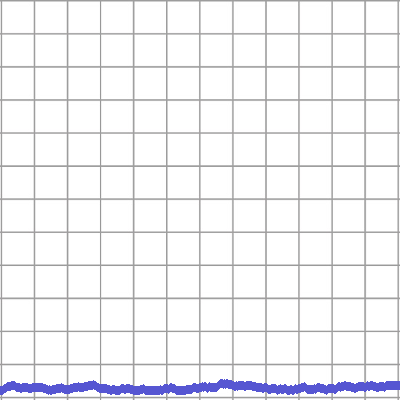

pitch69_thick2_color4_240_train.png


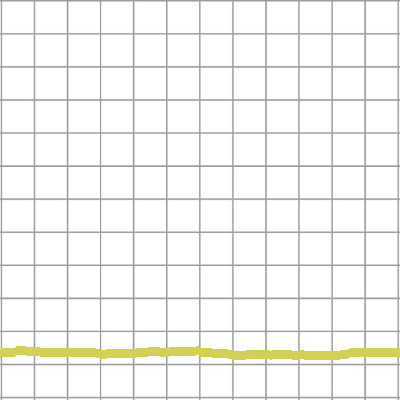

pitch70_thick2_color6_241_train.png


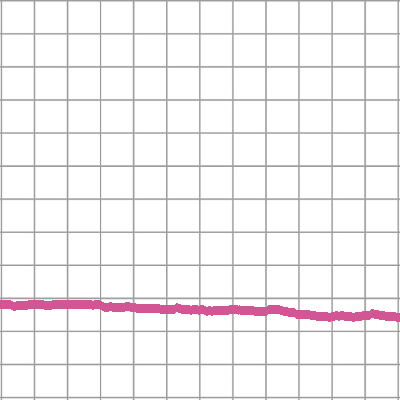

pitch71_thick2_color7_242_train.png


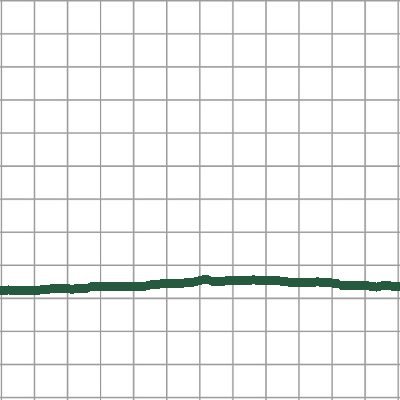

pitch72_thick2_color1_243_train.png


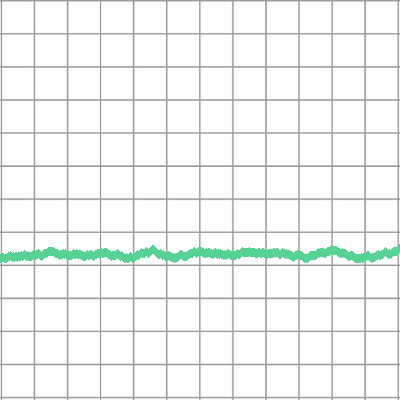

pitch73_thick2_color5_244_train.png


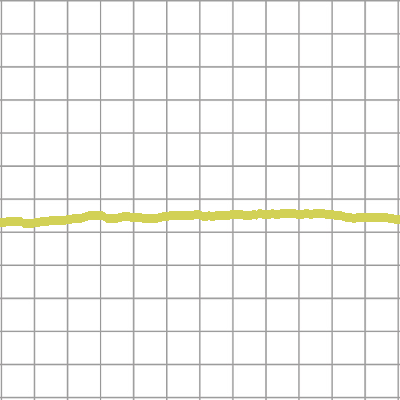

pitch74_thick2_color6_245_train.png


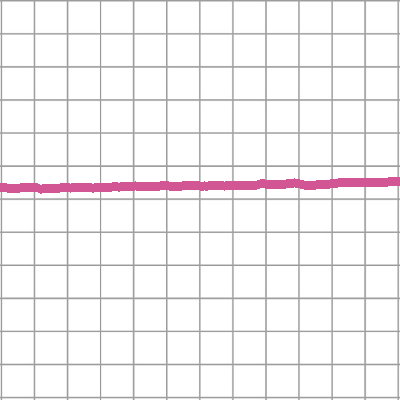

pitch75_thick2_color7_246_train.png


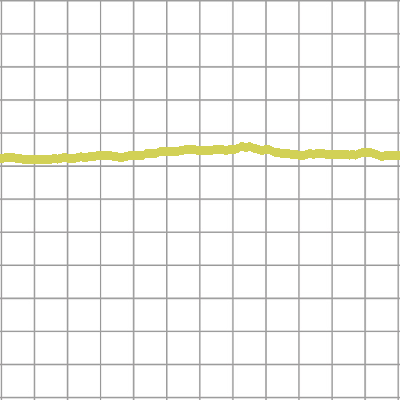

pitch76_thick2_color6_247_train.png


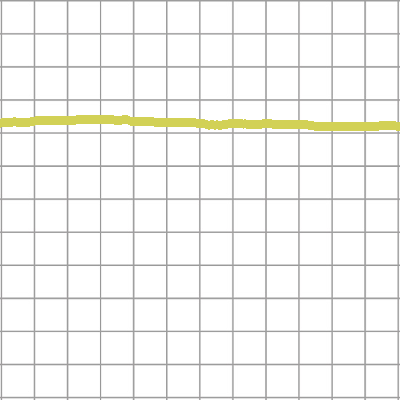

pitch77_thick2_color6_248_train.png


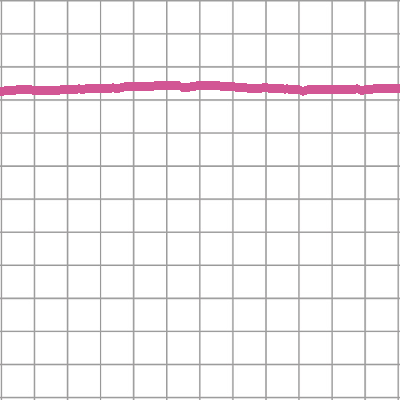

pitch78_thick2_color7_249_train.png


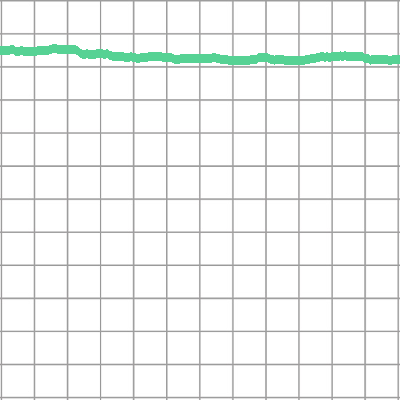

pitch79_thick2_color5_250_train.png


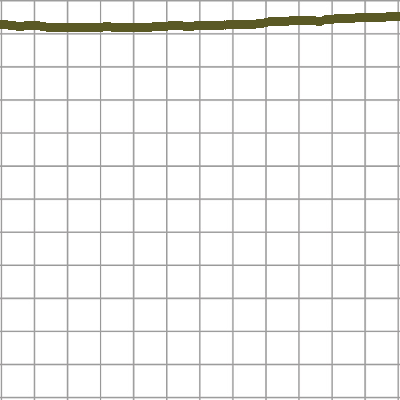

pitch80_thick2_color2_251_train.png


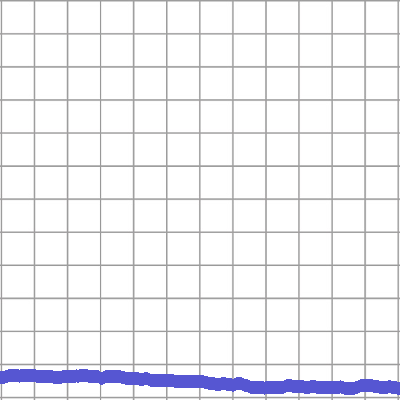

pitch69_thick3_color4_252_train.png


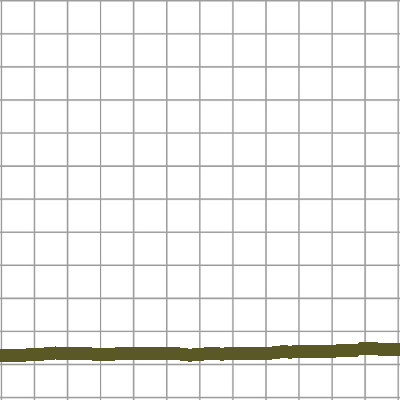

pitch70_thick3_color2_253_train.png


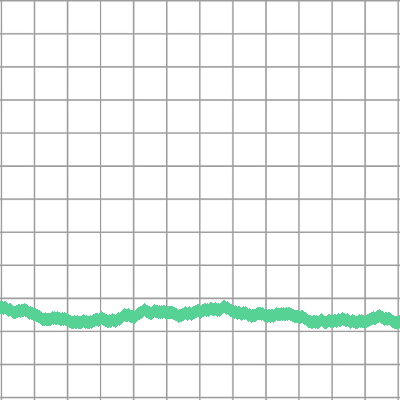

pitch71_thick3_color5_254_train.png


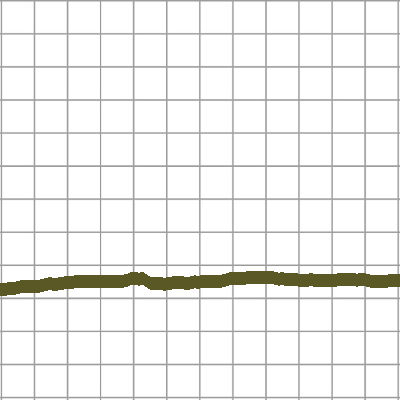

pitch72_thick3_color2_255_train.png


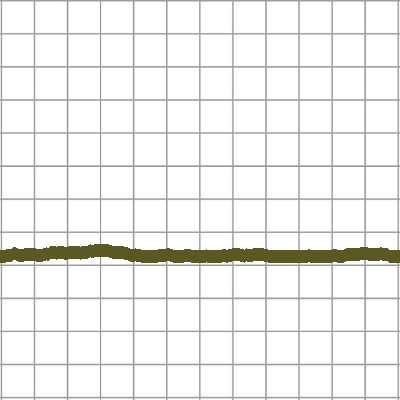

pitch73_thick3_color2_256_train.png


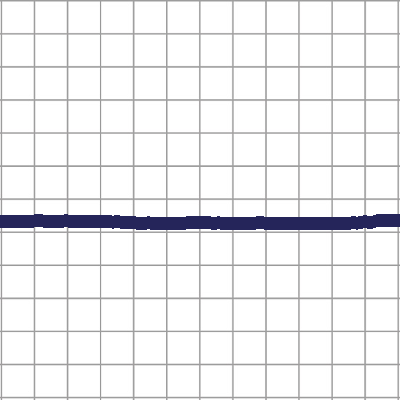

pitch74_thick3_color0_257_train.png


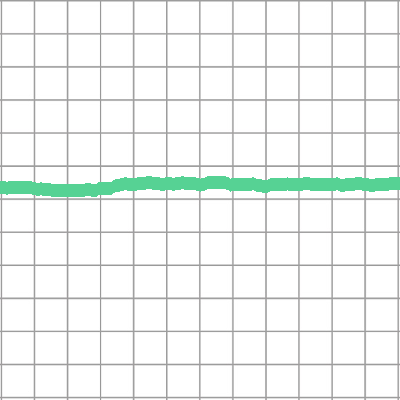

pitch75_thick3_color5_258_train.png


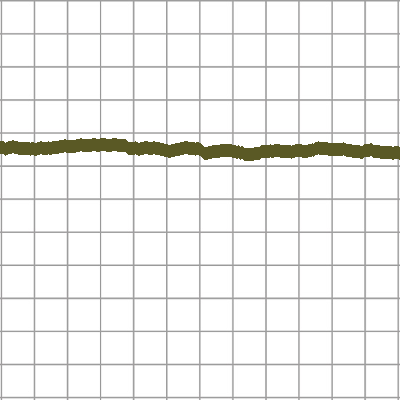

pitch76_thick3_color2_259_train.png


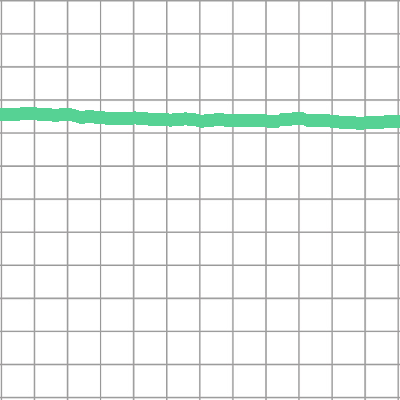

pitch77_thick3_color5_260_train.png


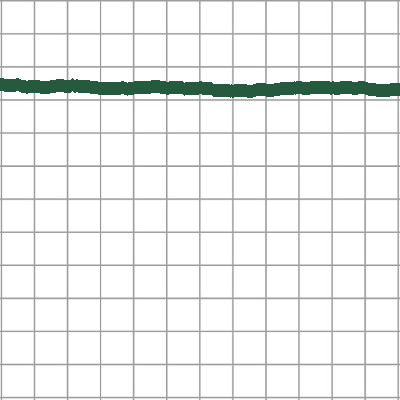

pitch78_thick3_color1_261_train.png


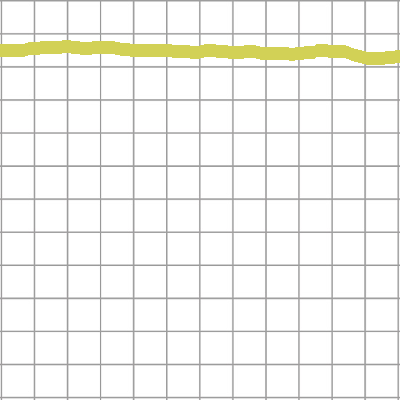

pitch79_thick3_color6_262_train.png


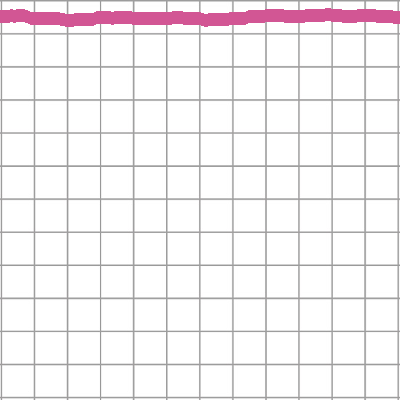

pitch80_thick3_color7_263_train.png


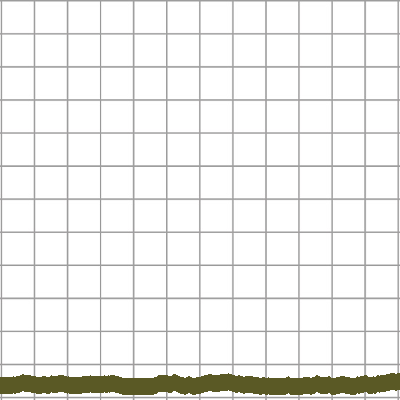

pitch69_thick4_color2_264_train.png


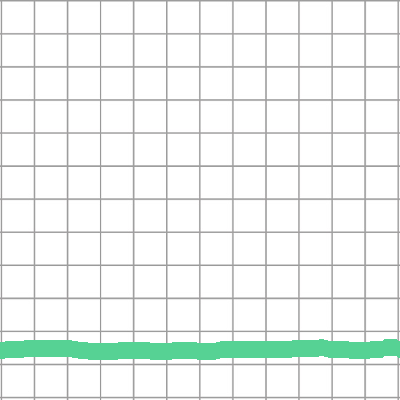

pitch70_thick4_color5_265_train.png


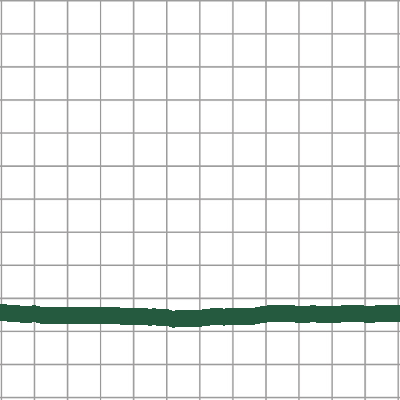

pitch71_thick4_color1_266_train.png


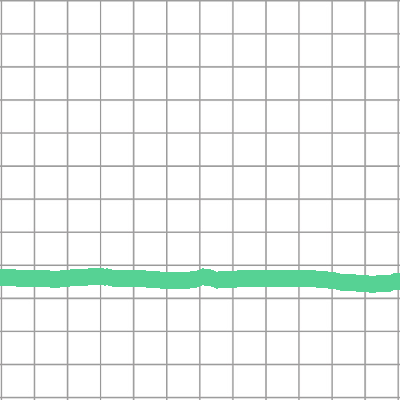

pitch72_thick4_color5_267_train.png


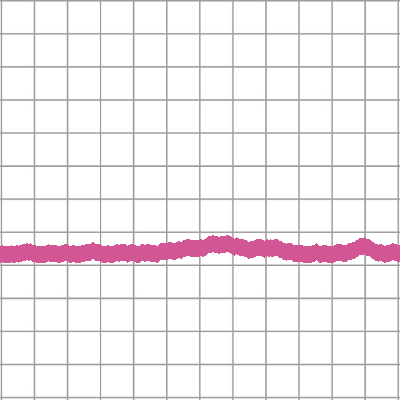

pitch73_thick4_color7_268_train.png


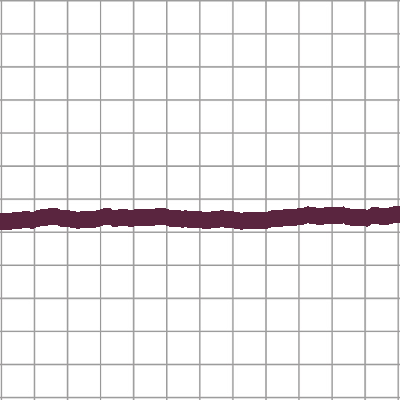

pitch74_thick4_color3_269_train.png


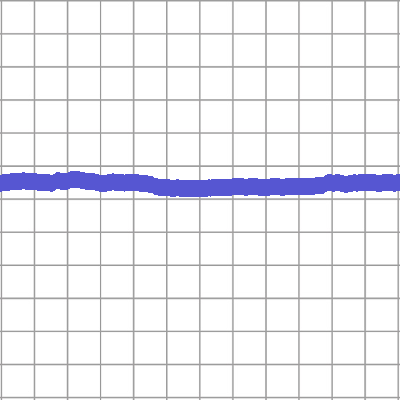

pitch75_thick4_color4_270_train.png


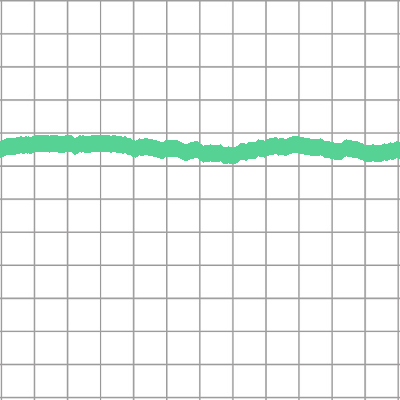

pitch76_thick4_color5_271_train.png


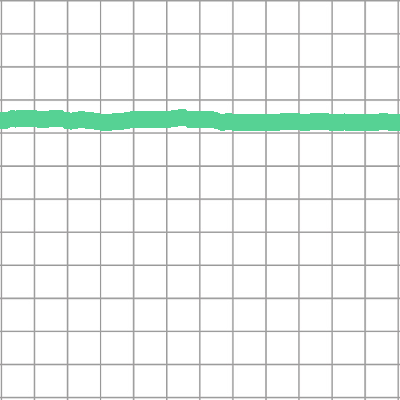

pitch77_thick4_color5_272_train.png


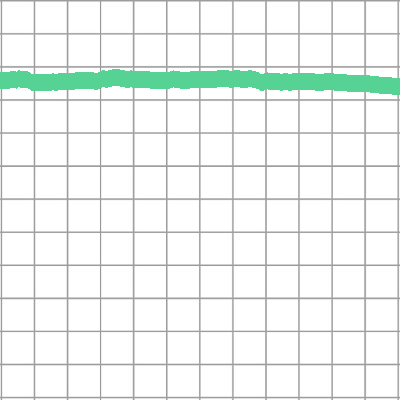

pitch78_thick4_color5_273_train.png


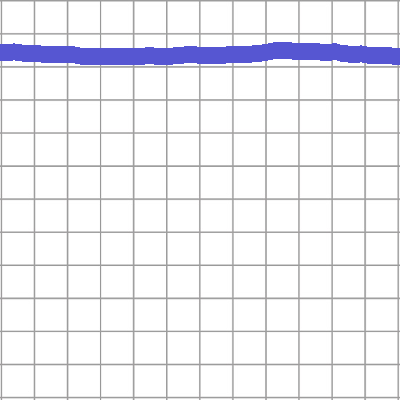

pitch79_thick4_color4_274_train.png


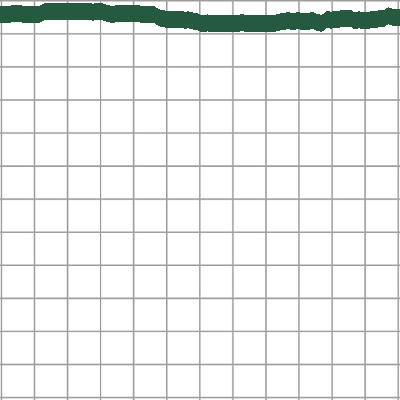

pitch80_thick4_color1_275_train.png


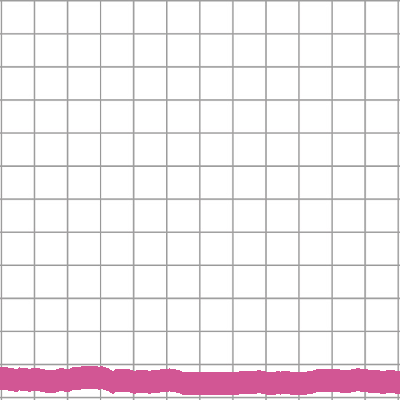

pitch69_thick5_color7_276_train.png


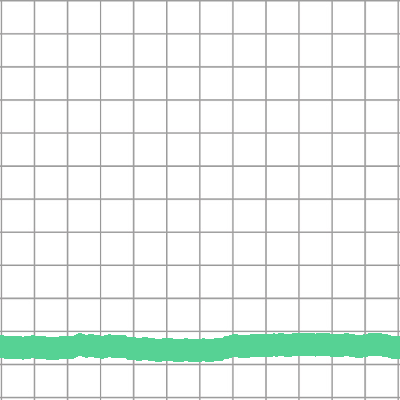

pitch70_thick5_color5_277_train.png


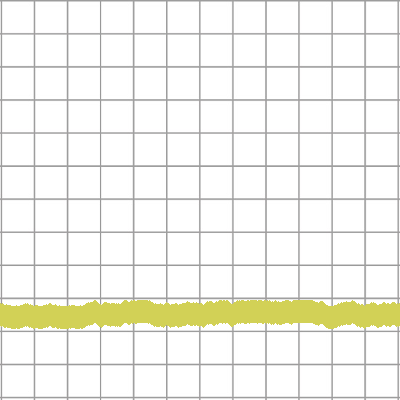

pitch71_thick5_color6_278_train.png


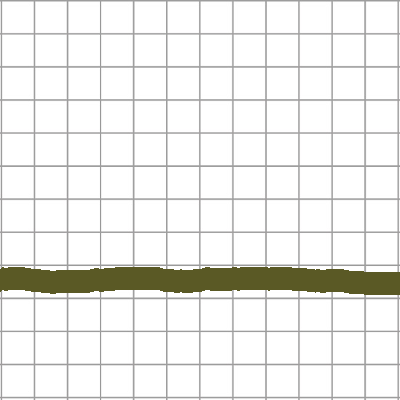

pitch72_thick5_color2_279_train.png


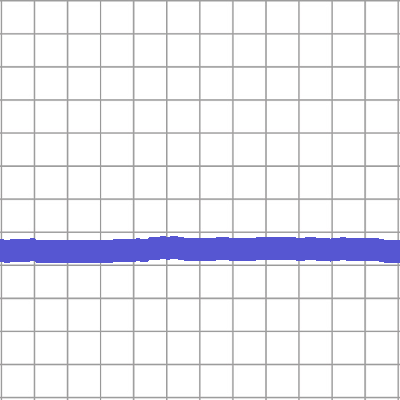

pitch73_thick5_color4_280_train.png


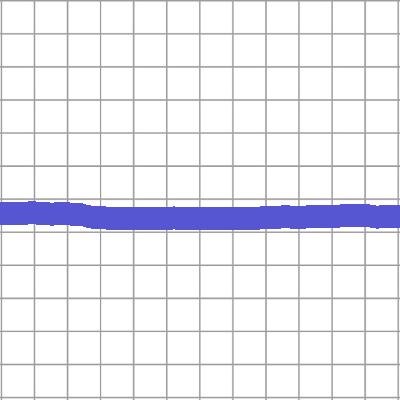

pitch74_thick5_color4_281_train.png


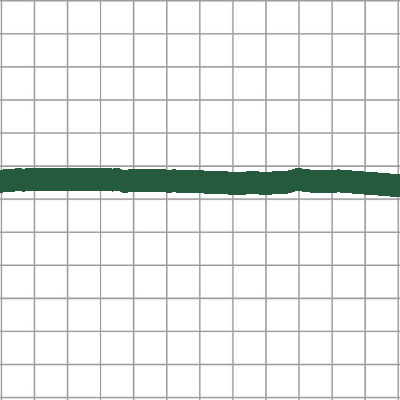

pitch75_thick5_color1_282_train.png


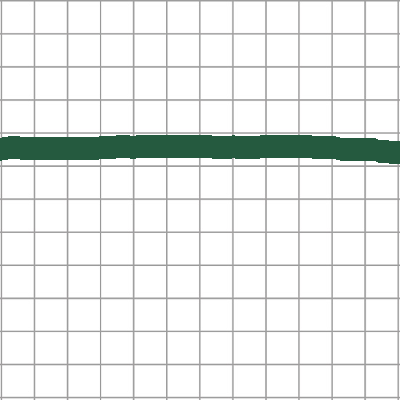

pitch76_thick5_color1_283_train.png


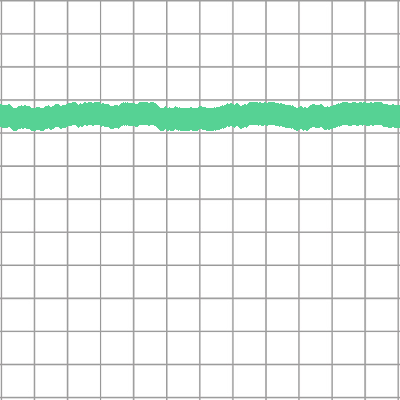

pitch77_thick5_color5_284_train.png


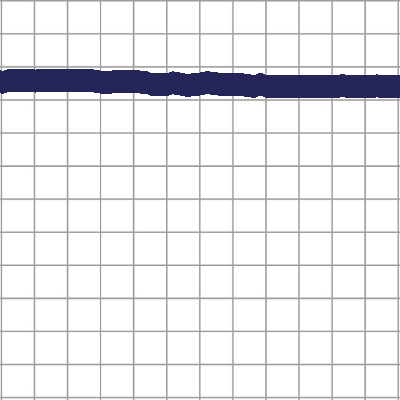

pitch78_thick5_color0_285_train.png


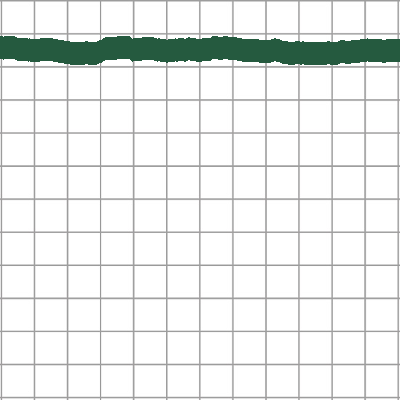

pitch79_thick5_color1_286_train.png


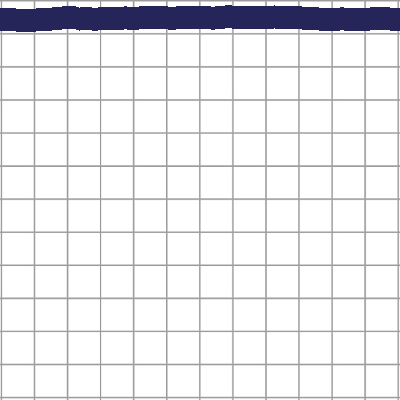

pitch80_thick5_color0_287_train.png


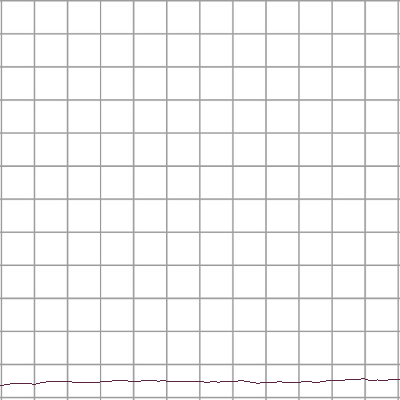

pitch69_thick0_color3_288_train.png


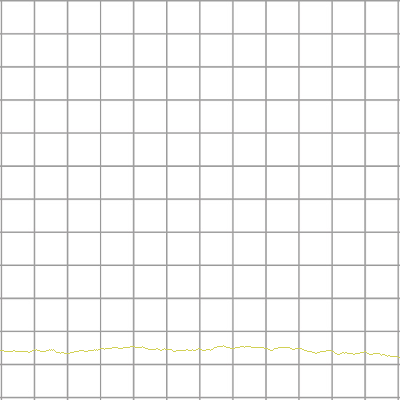

pitch70_thick0_color6_289_train.png


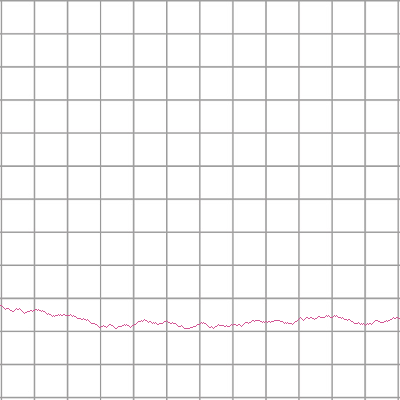

pitch71_thick0_color7_290_train.png


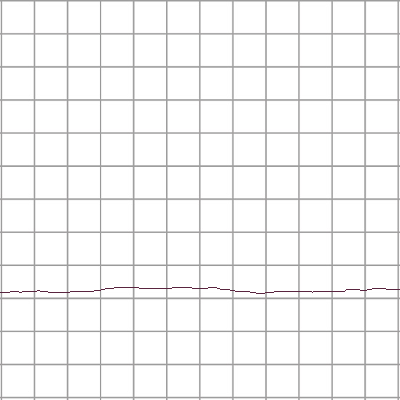

pitch72_thick0_color3_291_train.png


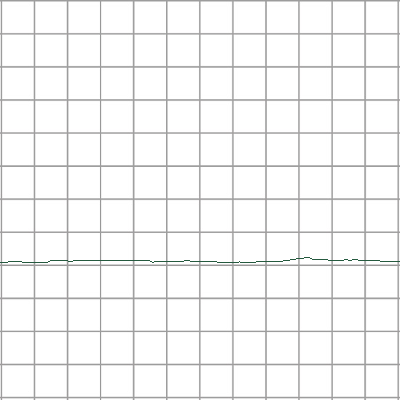

pitch73_thick0_color1_292_train.png


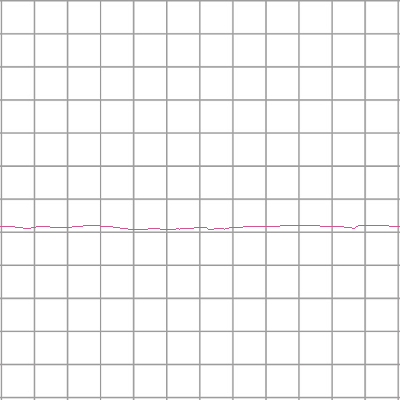

pitch74_thick0_color7_293_train.png


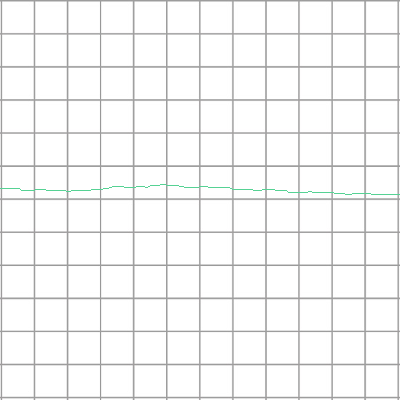

pitch75_thick0_color5_294_train.png


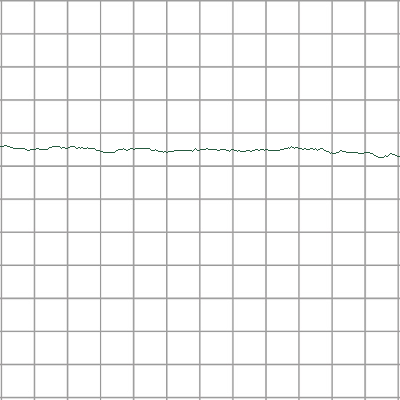

pitch76_thick0_color1_295_train.png


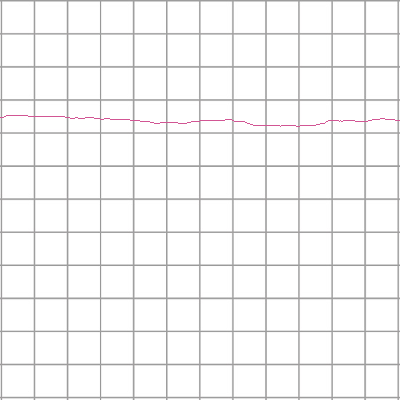

pitch77_thick0_color7_296_train.png


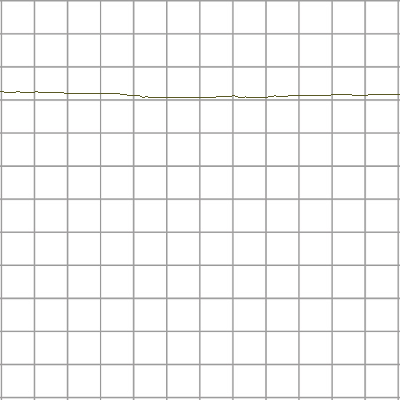

pitch78_thick0_color2_297_train.png


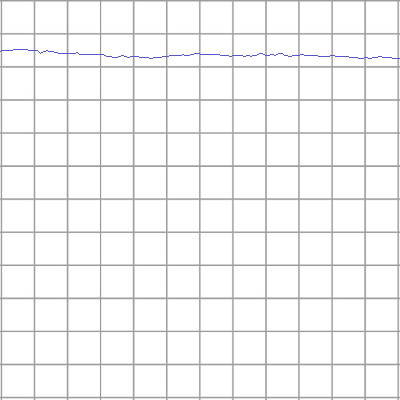

pitch79_thick0_color4_298_train.png


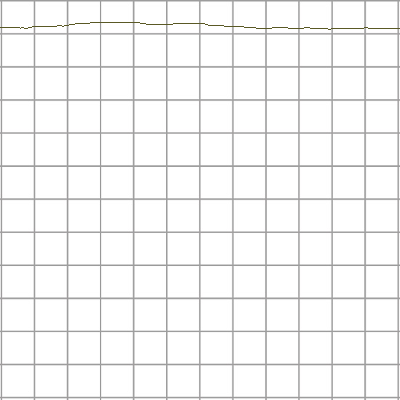

pitch80_thick0_color2_299_train.png


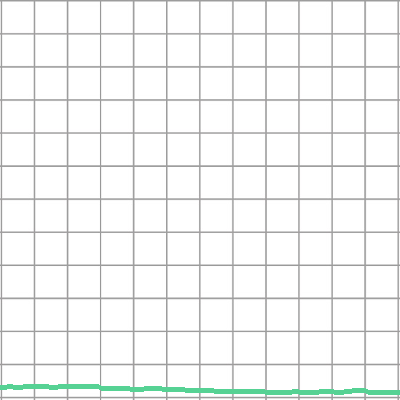

pitch69_thick1_color5_300_train.png


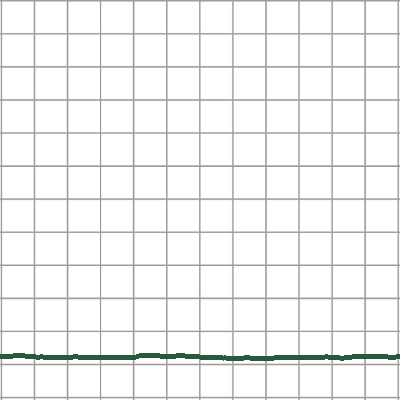

pitch70_thick1_color1_301_train.png


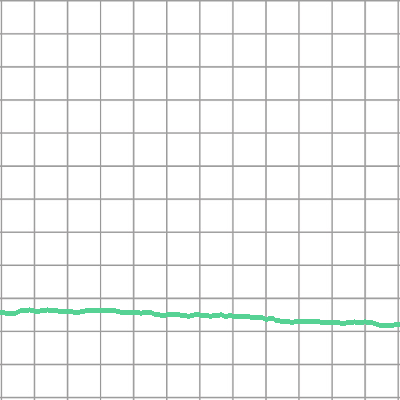

pitch71_thick1_color5_302_train.png


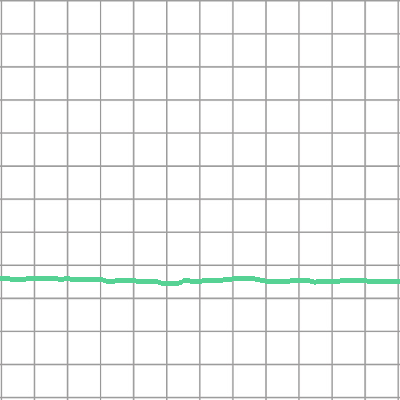

pitch72_thick1_color5_303_train.png


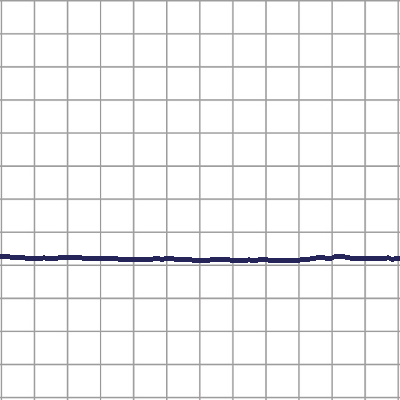

pitch73_thick1_color0_304_train.png


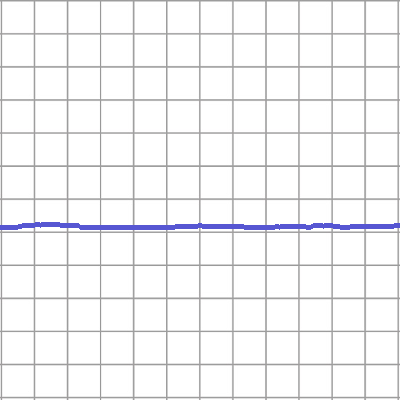

pitch74_thick1_color4_305_train.png


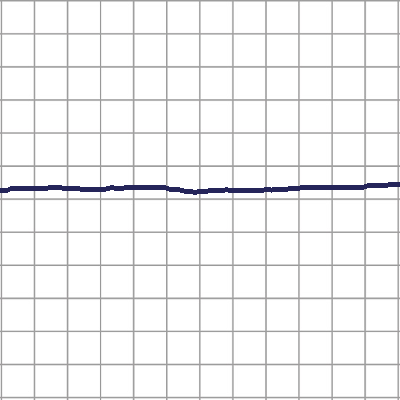

pitch75_thick1_color0_306_train.png


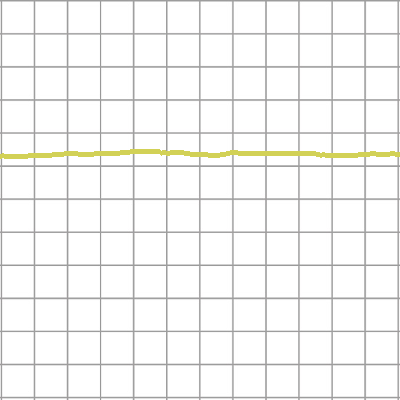

pitch76_thick1_color6_307_train.png


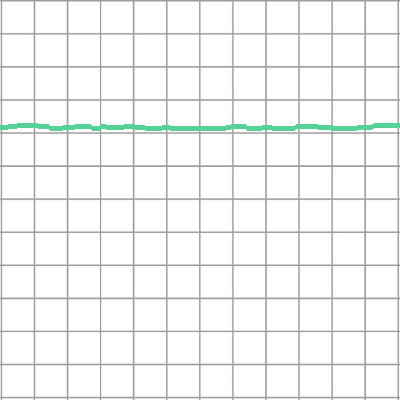

pitch77_thick1_color5_308_train.png


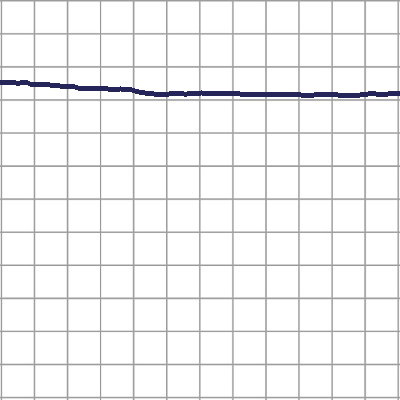

pitch78_thick1_color0_309_train.png


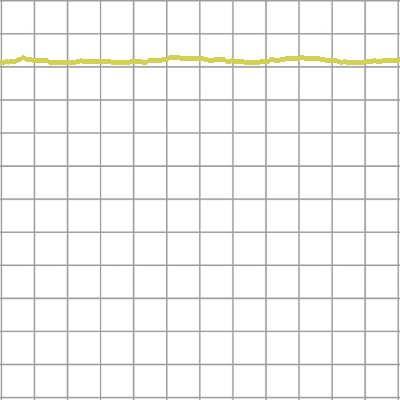

pitch79_thick1_color6_310_train.png


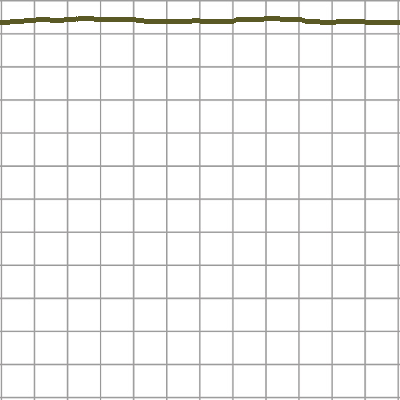

pitch80_thick1_color2_311_train.png


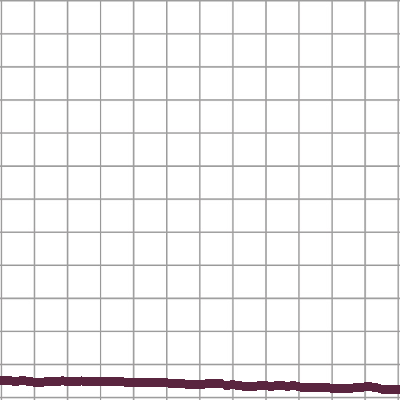

pitch69_thick2_color3_312_train.png


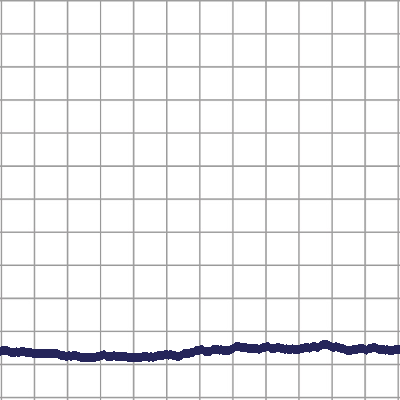

pitch70_thick2_color0_313_train.png


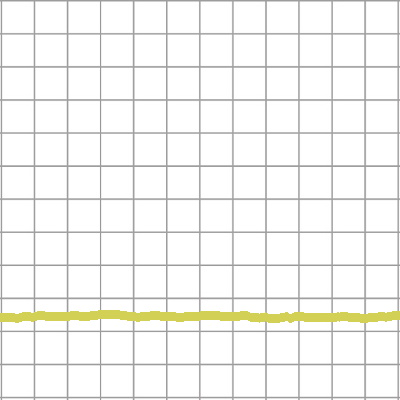

pitch71_thick2_color6_314_train.png


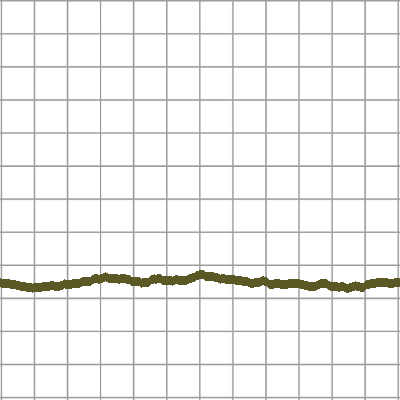

pitch72_thick2_color2_315_train.png


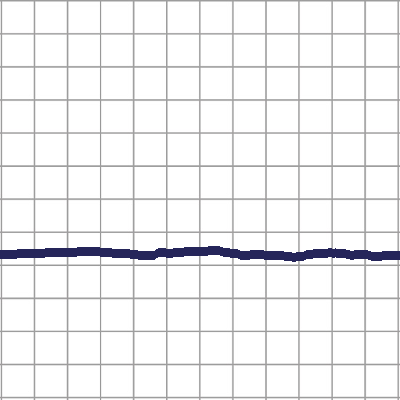

pitch73_thick2_color0_316_train.png


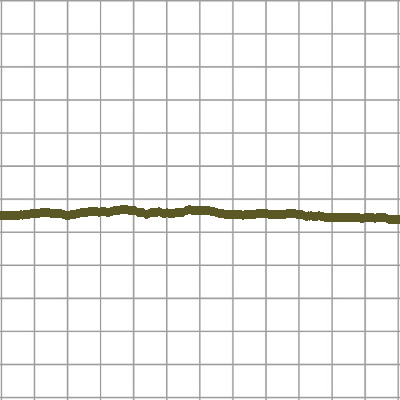

pitch74_thick2_color2_317_train.png


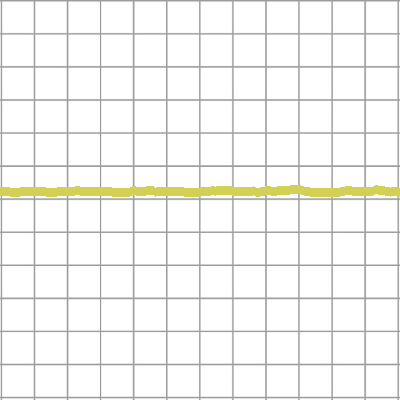

pitch75_thick2_color6_318_train.png


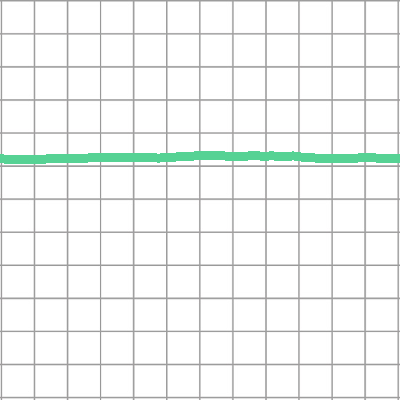

pitch76_thick2_color5_319_train.png


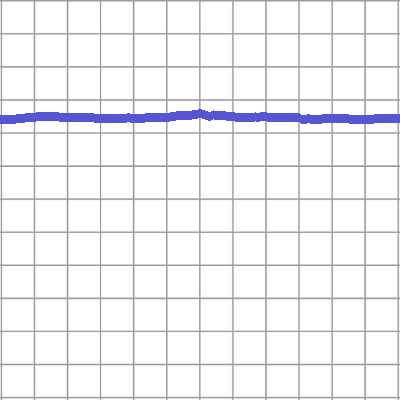

pitch77_thick2_color4_320_train.png


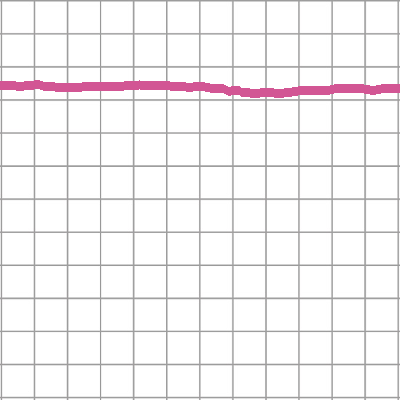

pitch78_thick2_color7_321_train.png


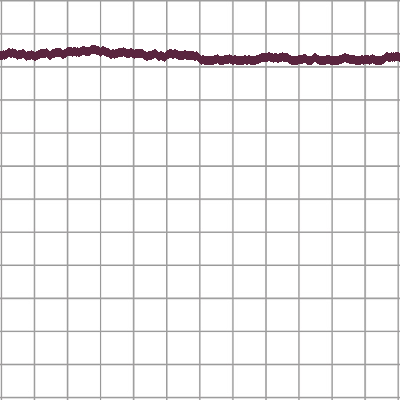

pitch79_thick2_color3_322_train.png


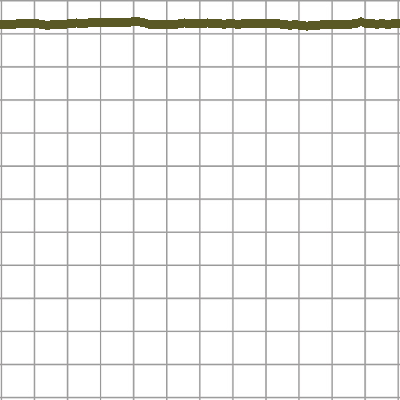

pitch80_thick2_color2_323_train.png


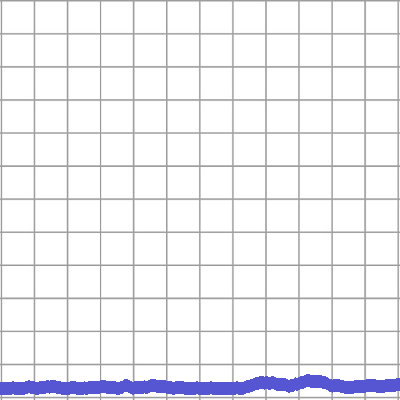

pitch69_thick3_color4_324_train.png


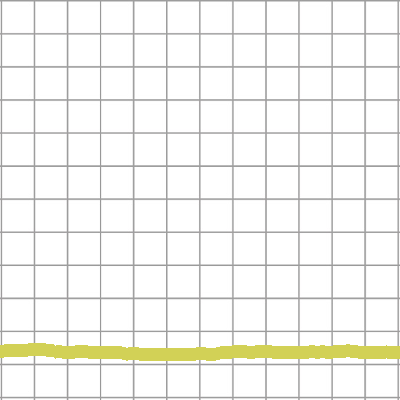

pitch70_thick3_color6_325_train.png


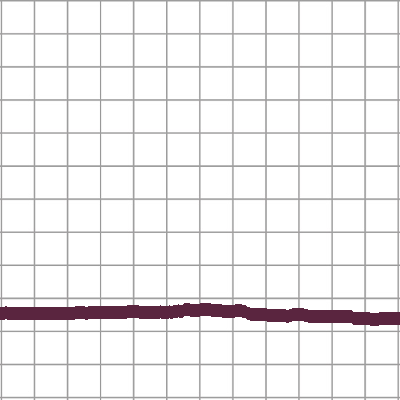

pitch71_thick3_color3_326_train.png


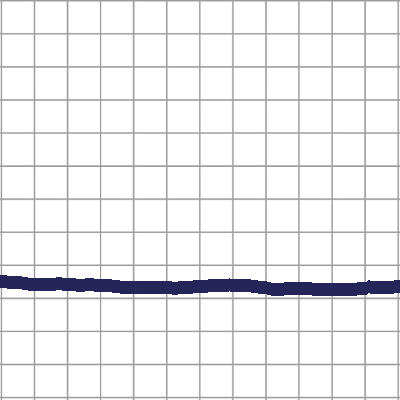

pitch72_thick3_color0_327_train.png


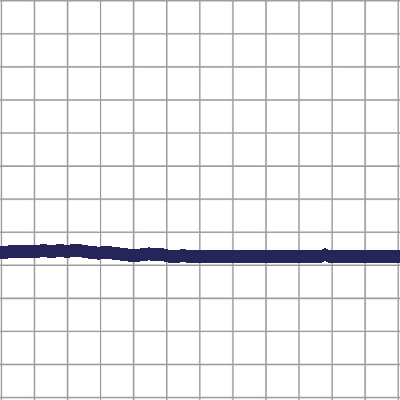

pitch73_thick3_color0_328_train.png


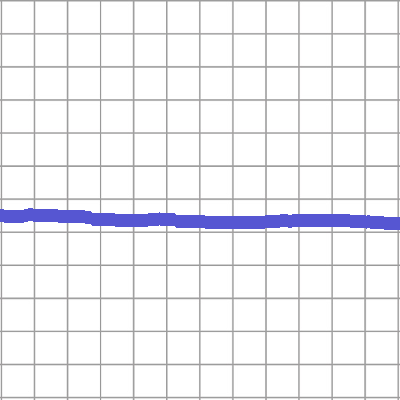

pitch74_thick3_color4_329_train.png


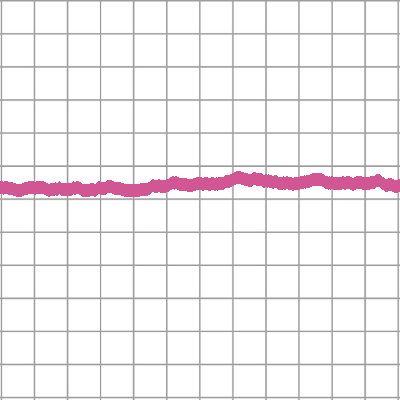

pitch75_thick3_color7_330_train.png


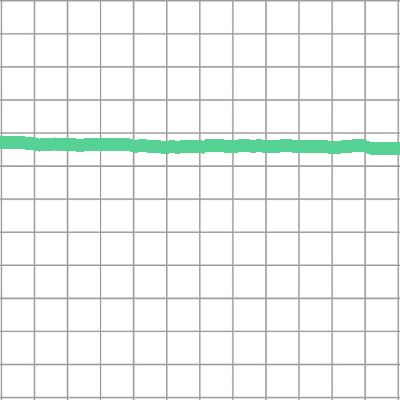

pitch76_thick3_color5_331_train.png


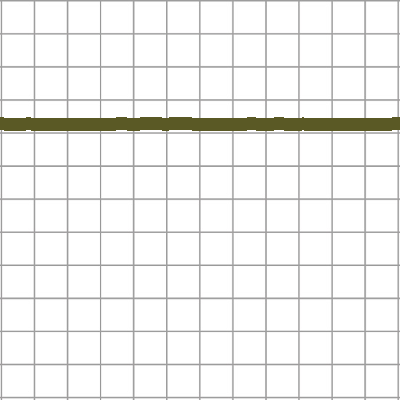

pitch77_thick3_color2_332_train.png


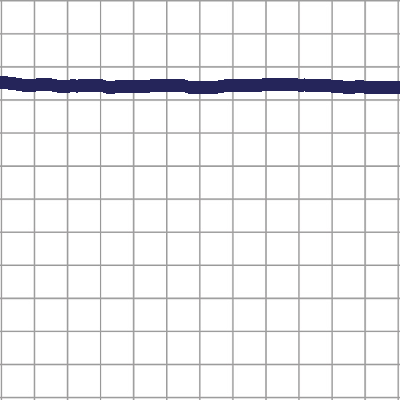

pitch78_thick3_color0_333_train.png


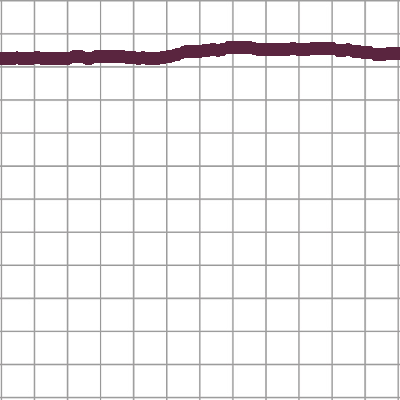

pitch79_thick3_color3_334_train.png


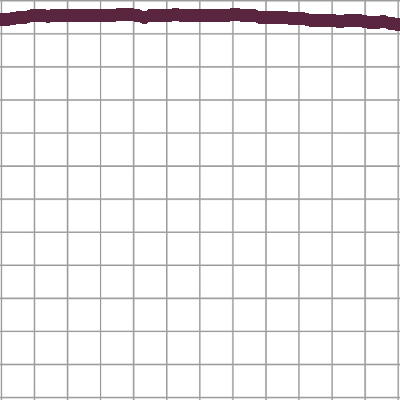

pitch80_thick3_color3_335_train.png


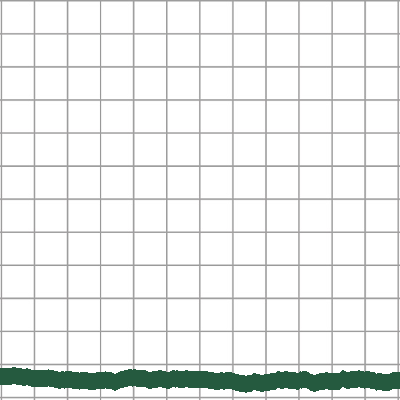

pitch69_thick4_color1_336_train.png


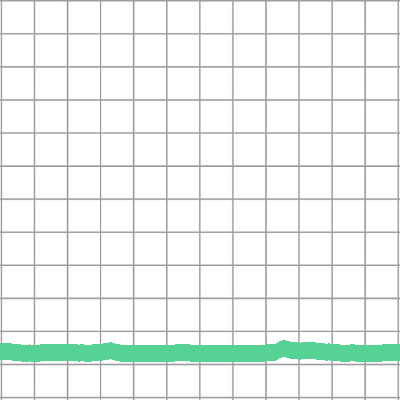

pitch70_thick4_color5_337_train.png


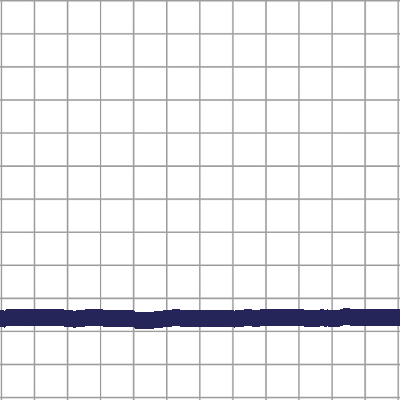

pitch71_thick4_color0_338_train.png


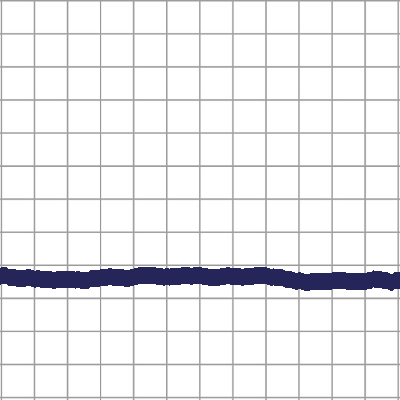

pitch72_thick4_color0_339_train.png


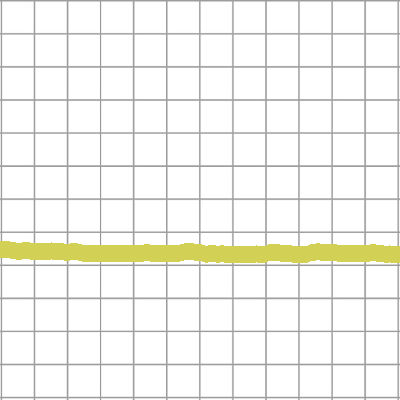

pitch73_thick4_color6_340_train.png


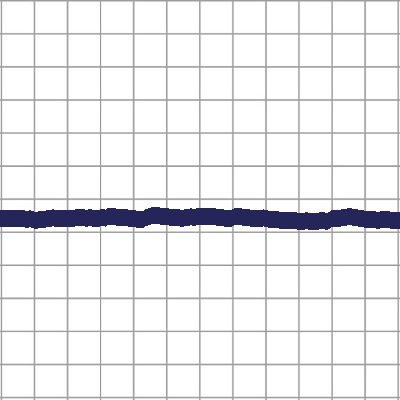

pitch74_thick4_color0_341_train.png


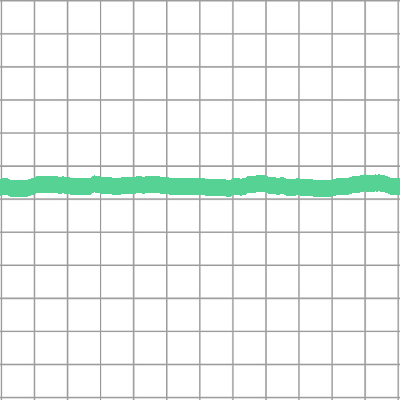

pitch75_thick4_color5_342_train.png


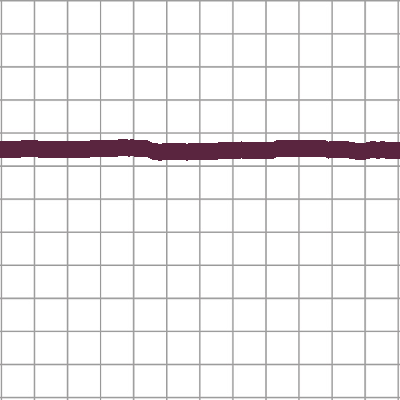

pitch76_thick4_color3_343_train.png


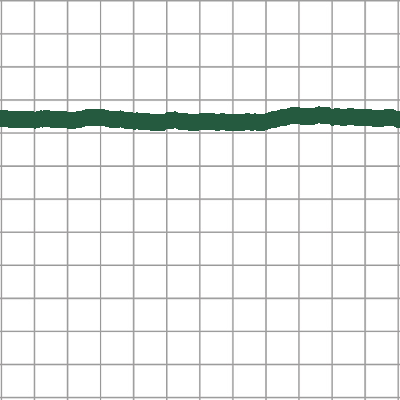

pitch77_thick4_color1_344_train.png


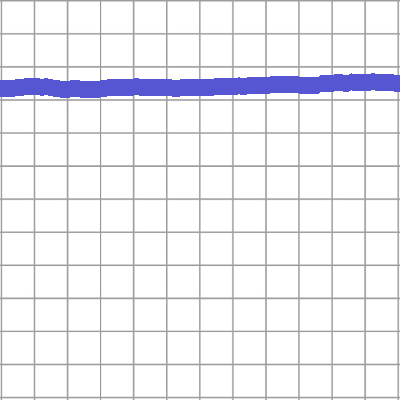

pitch78_thick4_color4_345_train.png


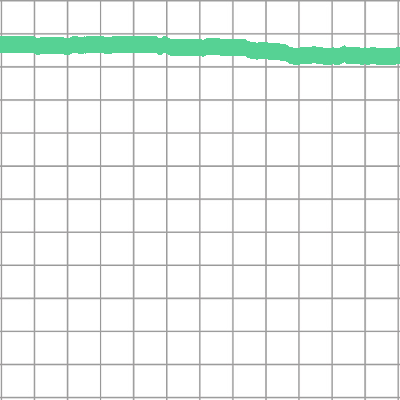

pitch79_thick4_color5_346_train.png


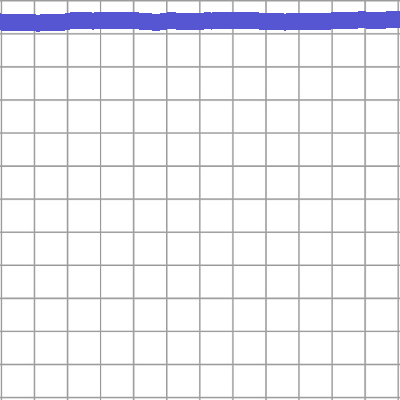

pitch80_thick4_color4_347_train.png


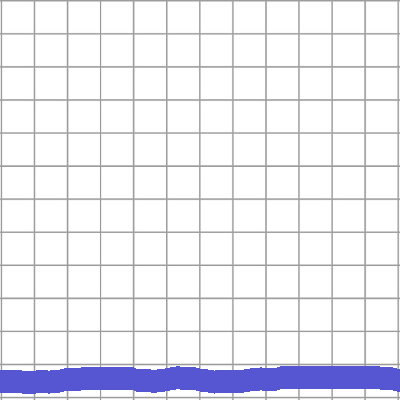

pitch69_thick5_color4_348_train.png


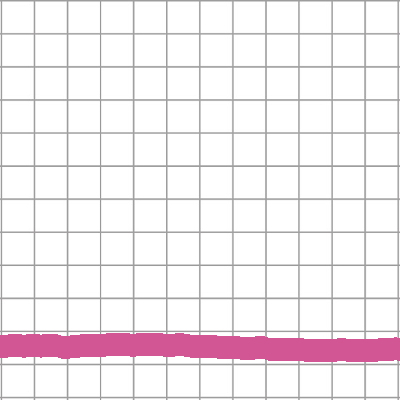

pitch70_thick5_color7_349_train.png


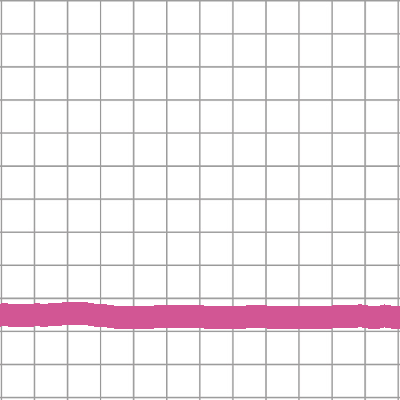

pitch71_thick5_color7_350_train.png


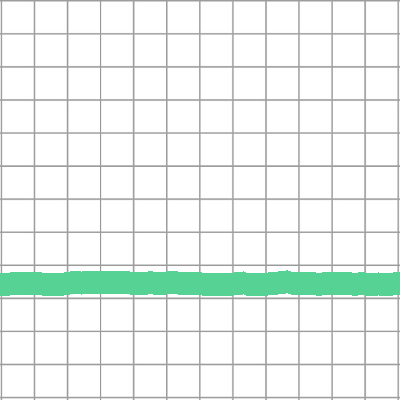

pitch72_thick5_color5_351_train.png


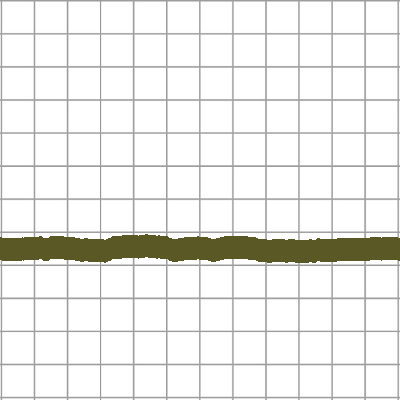

pitch73_thick5_color2_352_train.png


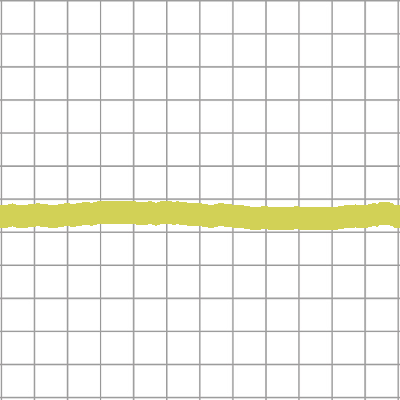

pitch74_thick5_color6_353_train.png


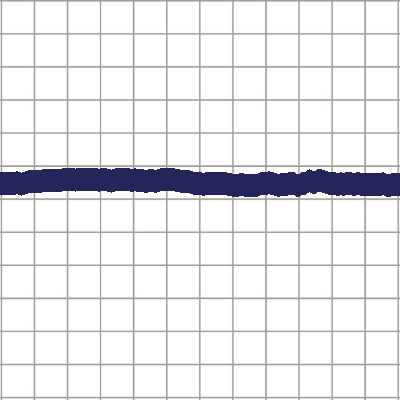

pitch75_thick5_color0_354_train.png


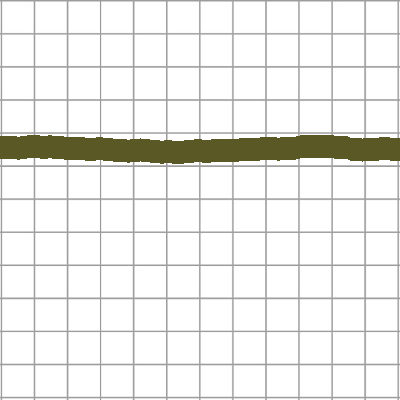

pitch76_thick5_color2_355_train.png


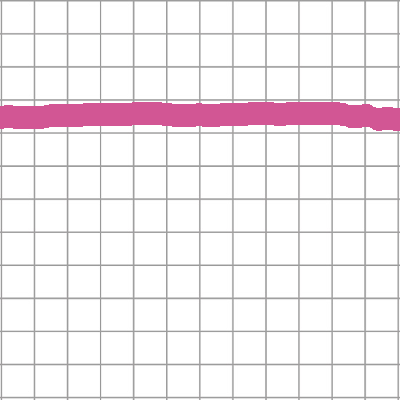

pitch77_thick5_color7_356_train.png


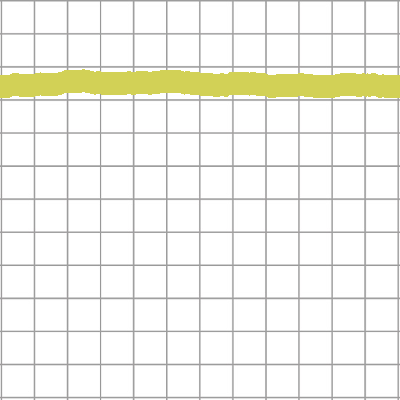

pitch78_thick5_color6_357_train.png


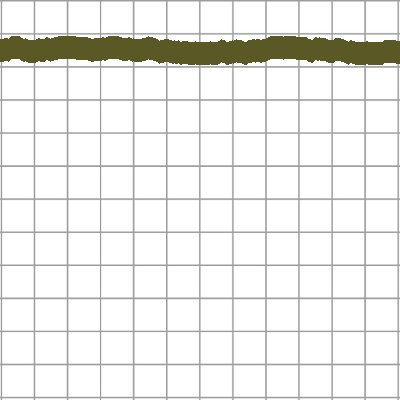

pitch79_thick5_color2_358_train.png


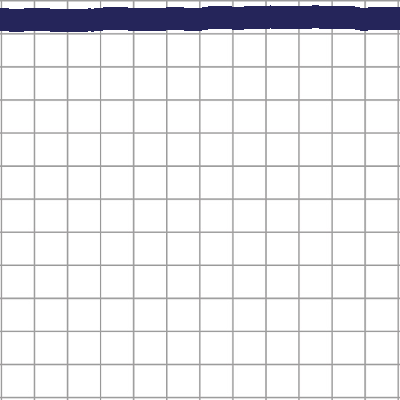

pitch80_thick5_color0_359_train.png
[INFO] generating training dataset...


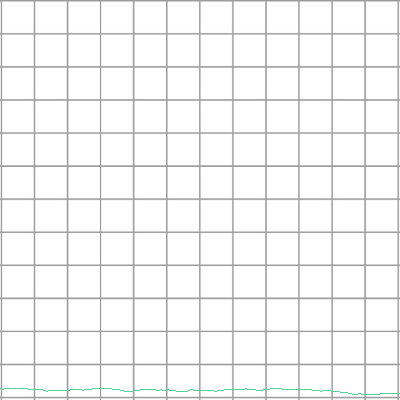

pitch69_thick0_color5_0_validation.png


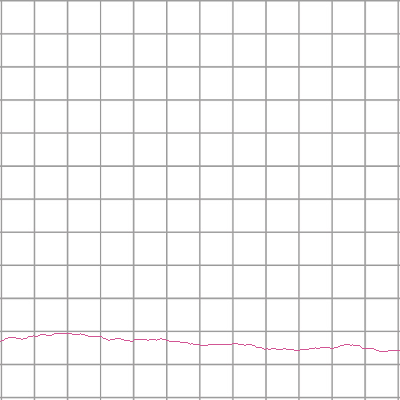

pitch70_thick0_color7_1_validation.png


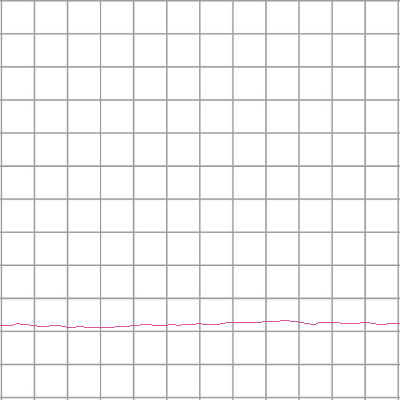

pitch71_thick0_color7_2_validation.png


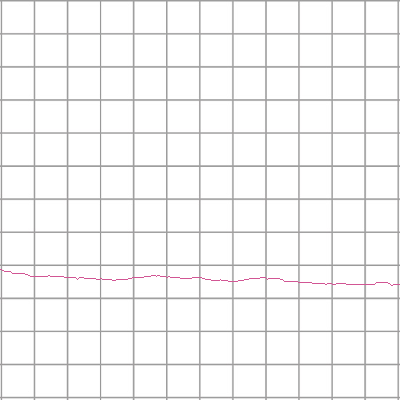

pitch72_thick0_color7_3_validation.png


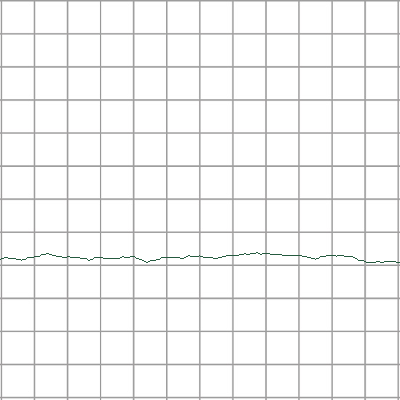

pitch73_thick0_color1_4_validation.png


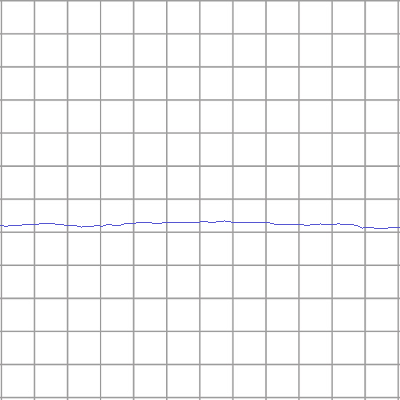

pitch74_thick0_color4_5_validation.png


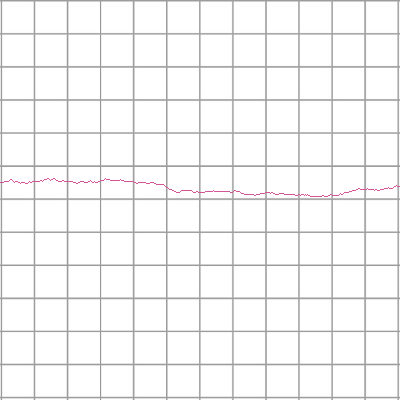

pitch75_thick0_color7_6_validation.png


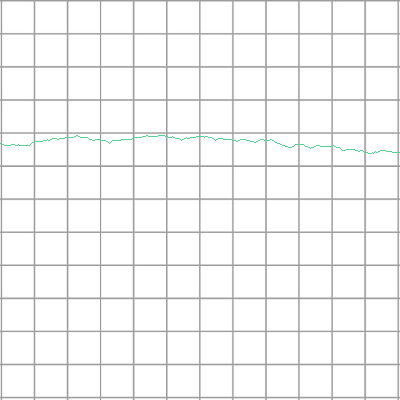

pitch76_thick0_color5_7_validation.png


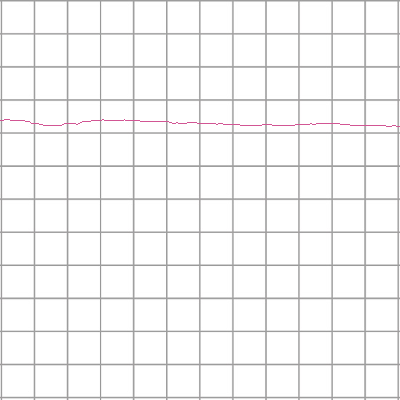

pitch77_thick0_color7_8_validation.png


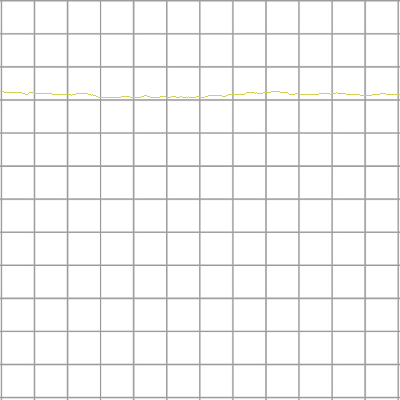

pitch78_thick0_color6_9_validation.png


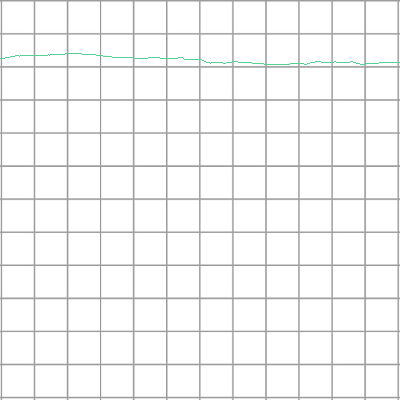

pitch79_thick0_color5_10_validation.png


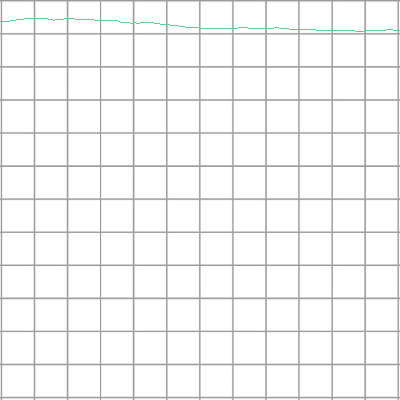

pitch80_thick0_color5_11_validation.png


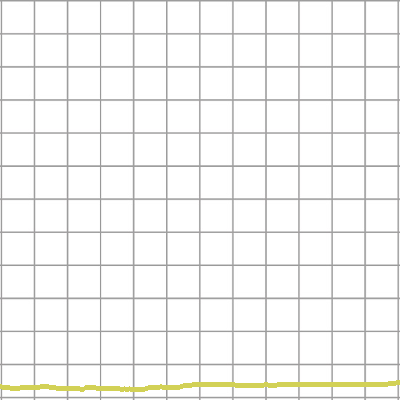

pitch69_thick1_color6_12_validation.png


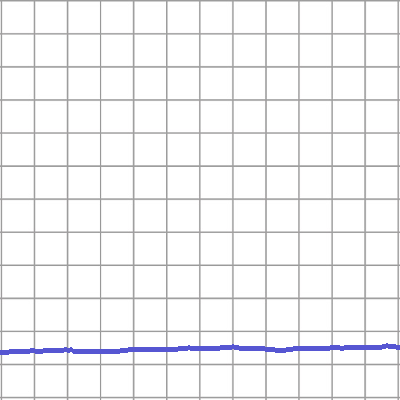

pitch70_thick1_color4_13_validation.png


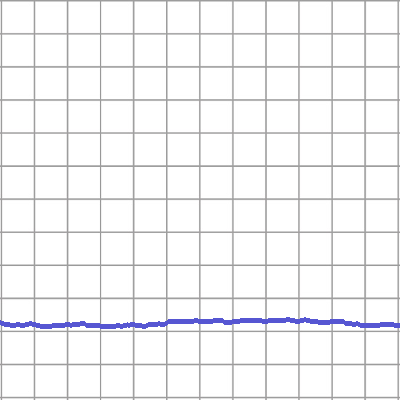

pitch71_thick1_color4_14_validation.png


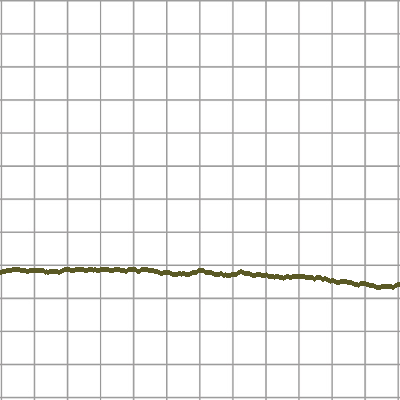

pitch72_thick1_color2_15_validation.png


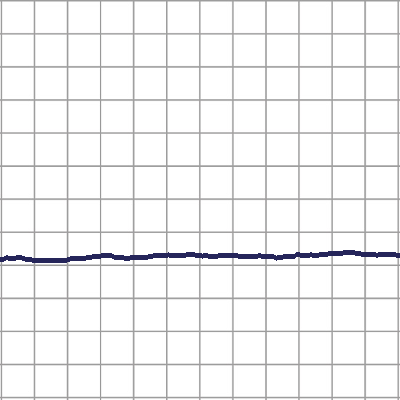

pitch73_thick1_color0_16_validation.png


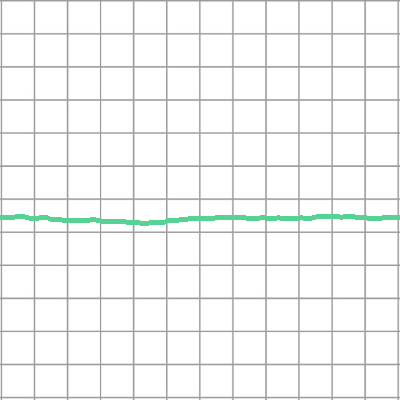

pitch74_thick1_color5_17_validation.png


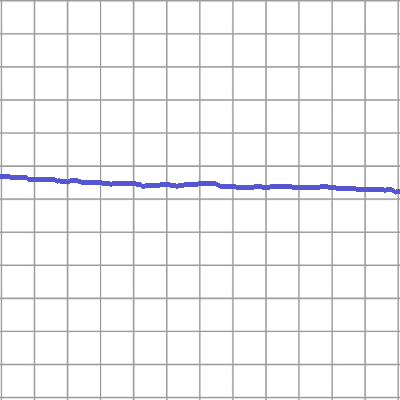

pitch75_thick1_color4_18_validation.png


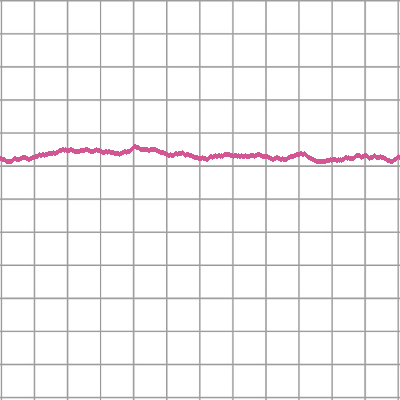

pitch76_thick1_color7_19_validation.png


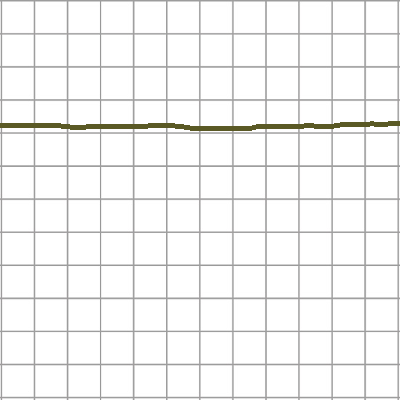

pitch77_thick1_color2_20_validation.png


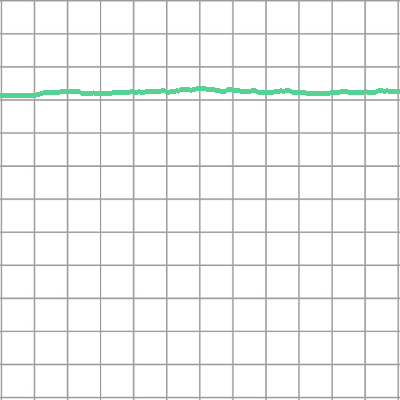

pitch78_thick1_color5_21_validation.png


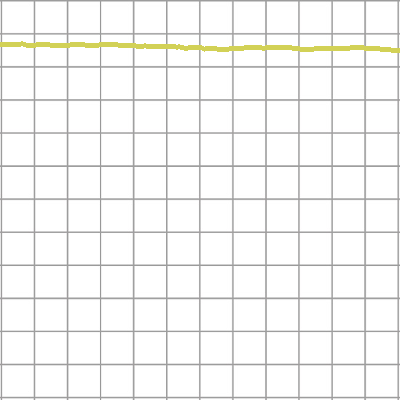

pitch79_thick1_color6_22_validation.png


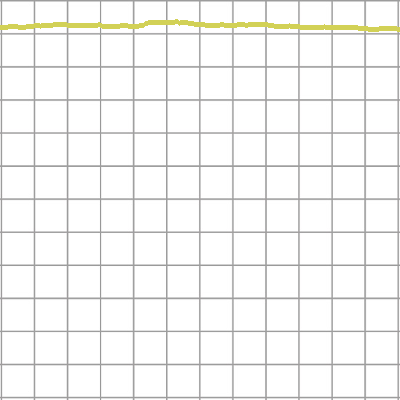

pitch80_thick1_color6_23_validation.png


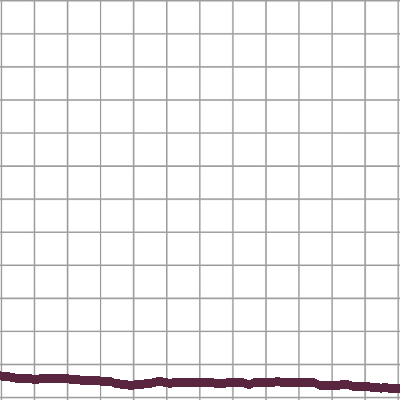

pitch69_thick2_color3_24_validation.png


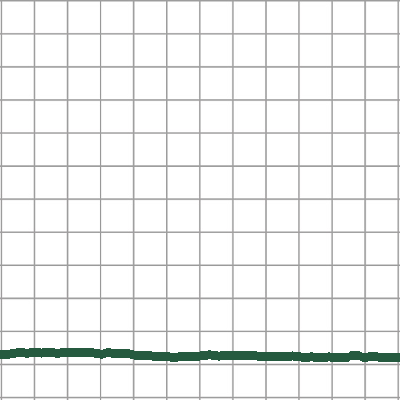

pitch70_thick2_color1_25_validation.png


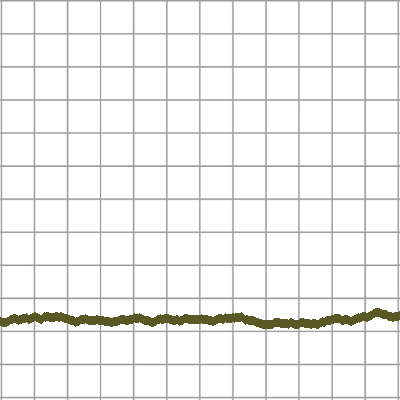

pitch71_thick2_color2_26_validation.png


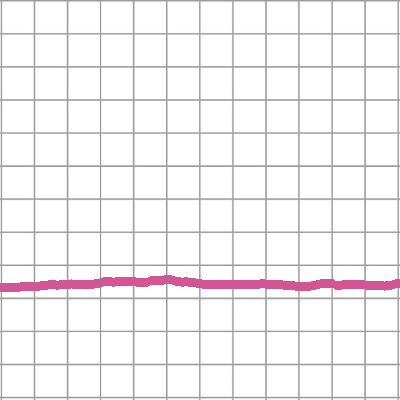

pitch72_thick2_color7_27_validation.png


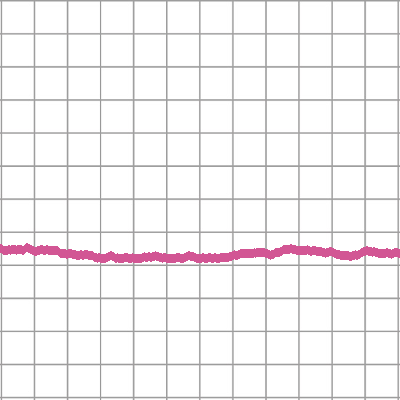

pitch73_thick2_color7_28_validation.png


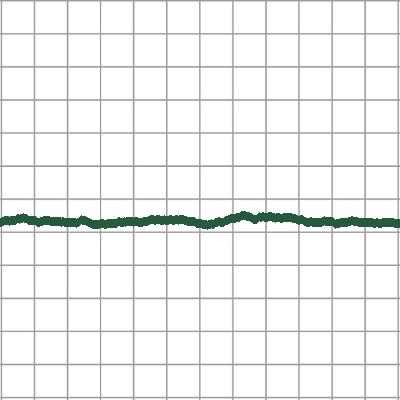

pitch74_thick2_color1_29_validation.png


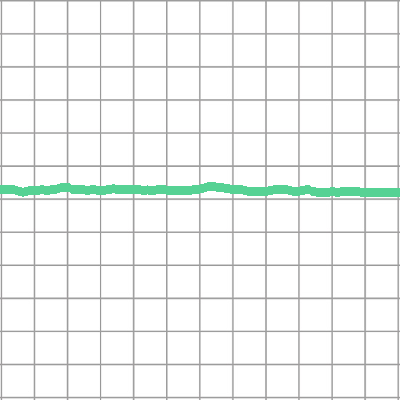

pitch75_thick2_color5_30_validation.png


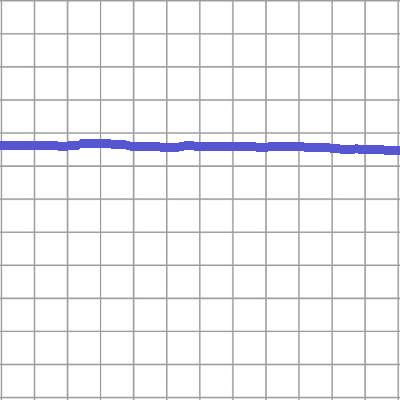

pitch76_thick2_color4_31_validation.png


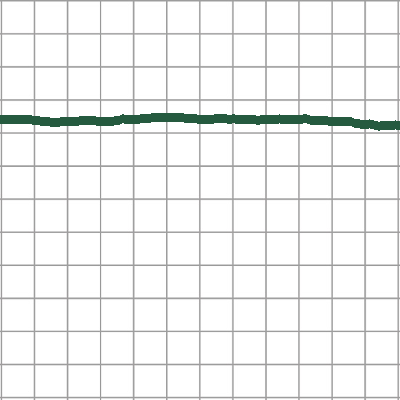

pitch77_thick2_color1_32_validation.png


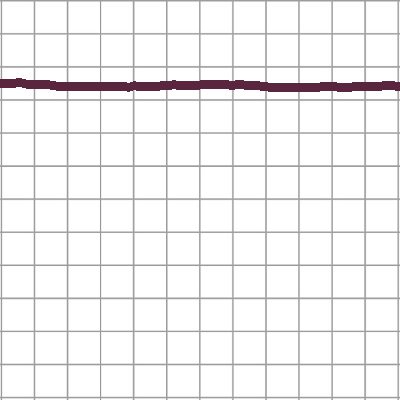

pitch78_thick2_color3_33_validation.png


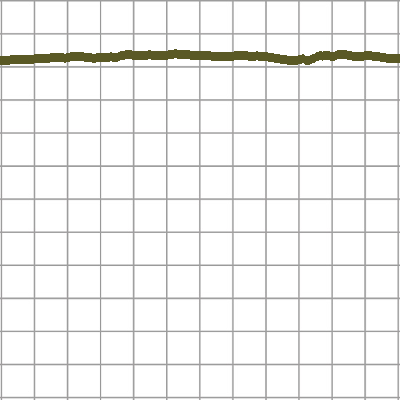

pitch79_thick2_color2_34_validation.png


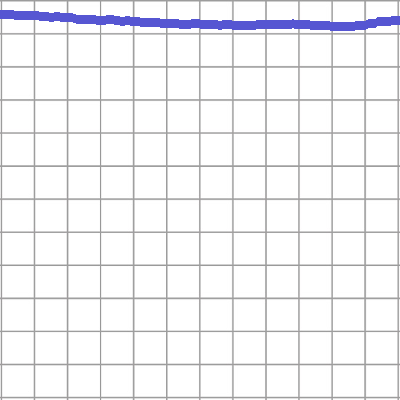

pitch80_thick2_color4_35_validation.png


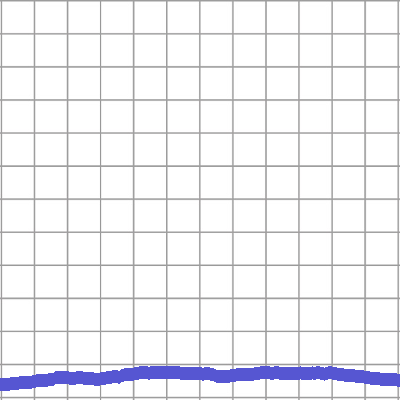

pitch69_thick3_color4_36_validation.png


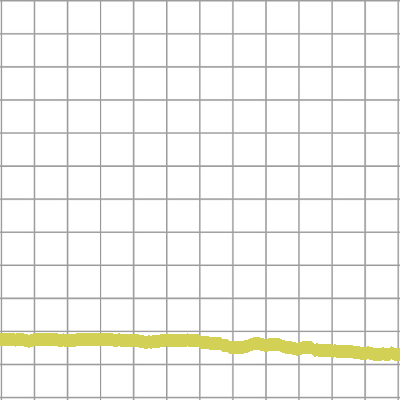

pitch70_thick3_color6_37_validation.png


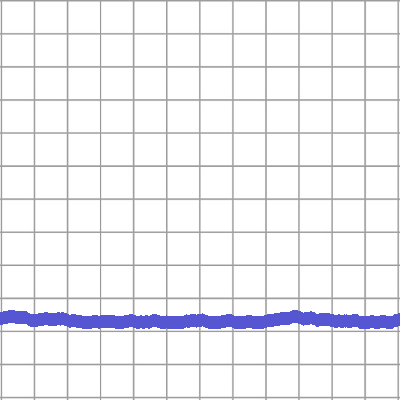

pitch71_thick3_color4_38_validation.png


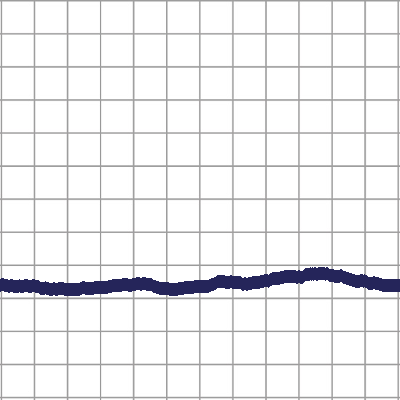

pitch72_thick3_color0_39_validation.png


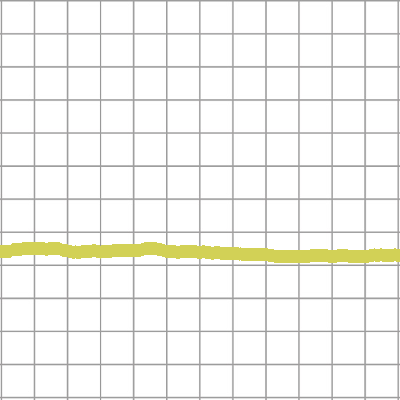

pitch73_thick3_color6_40_validation.png


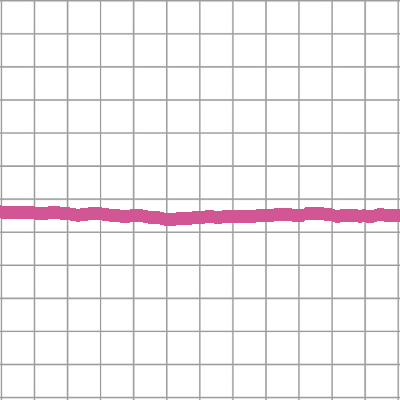

pitch74_thick3_color7_41_validation.png


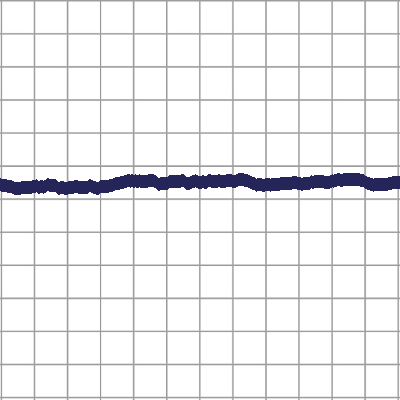

pitch75_thick3_color0_42_validation.png


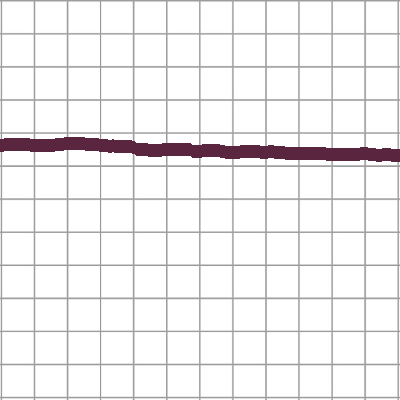

pitch76_thick3_color3_43_validation.png


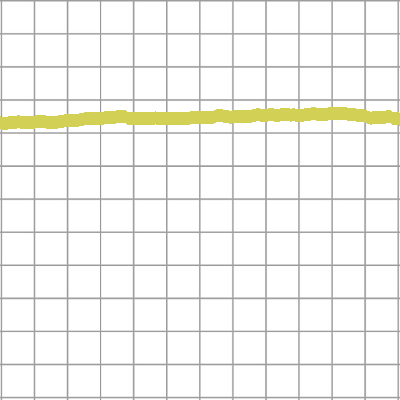

pitch77_thick3_color6_44_validation.png


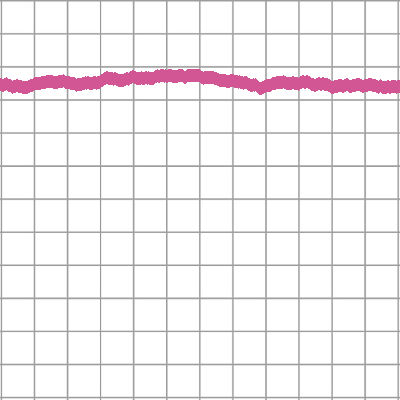

pitch78_thick3_color7_45_validation.png


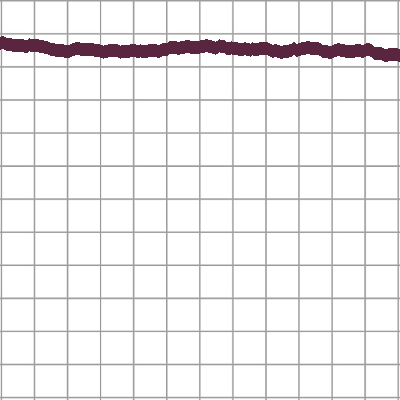

pitch79_thick3_color3_46_validation.png


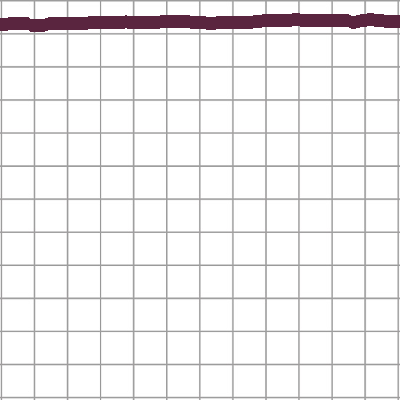

pitch80_thick3_color3_47_validation.png


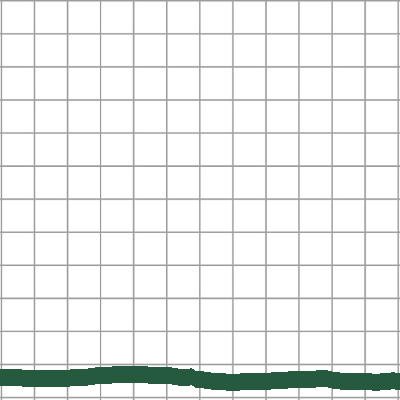

pitch69_thick4_color1_48_validation.png


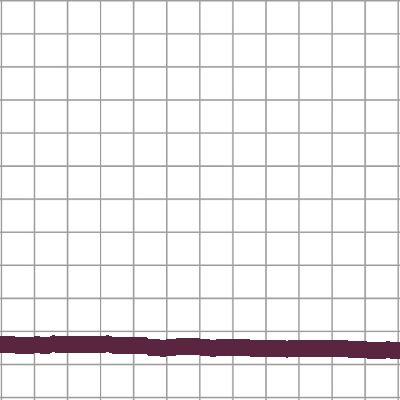

pitch70_thick4_color3_49_validation.png


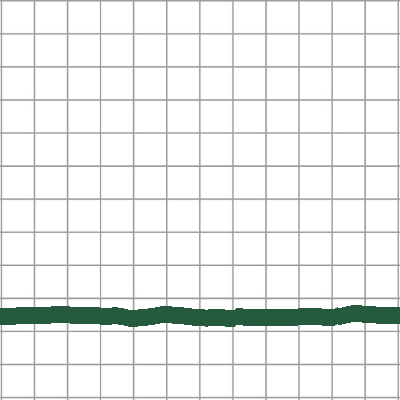

pitch71_thick4_color1_50_validation.png


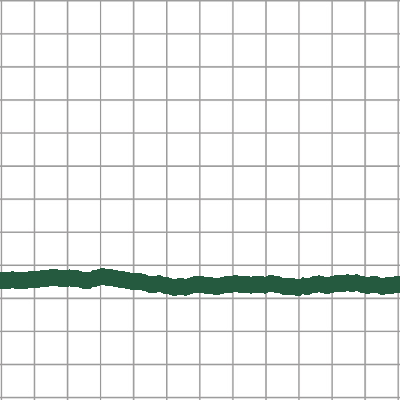

pitch72_thick4_color1_51_validation.png


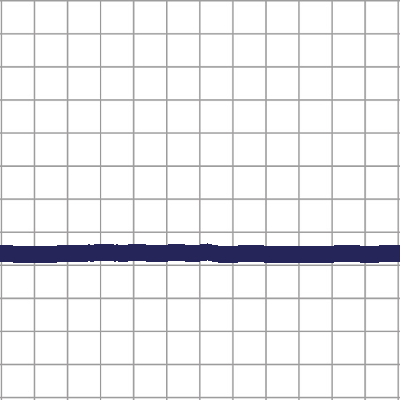

pitch73_thick4_color0_52_validation.png


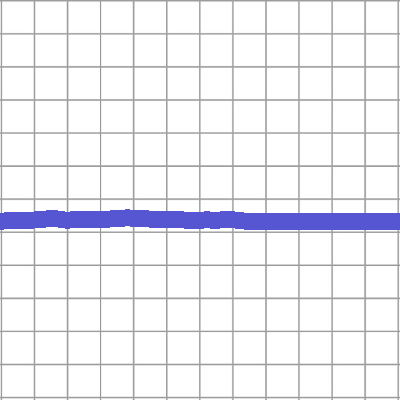

pitch74_thick4_color4_53_validation.png


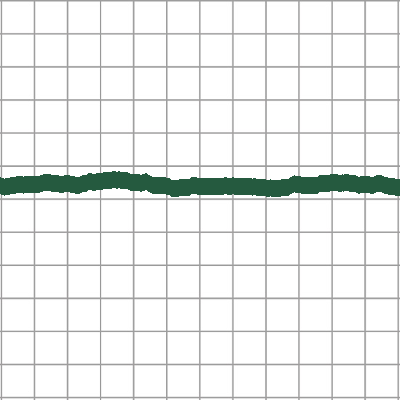

pitch75_thick4_color1_54_validation.png


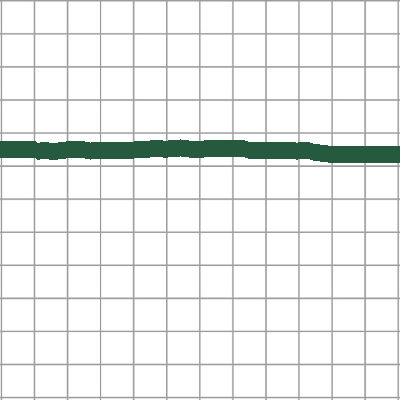

pitch76_thick4_color1_55_validation.png


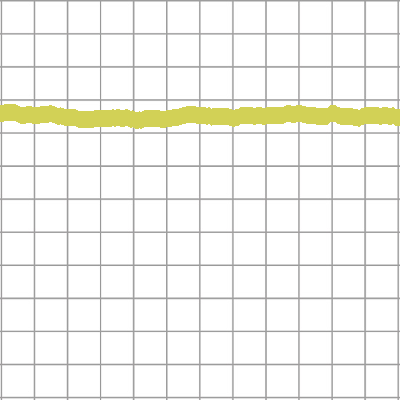

pitch77_thick4_color6_56_validation.png


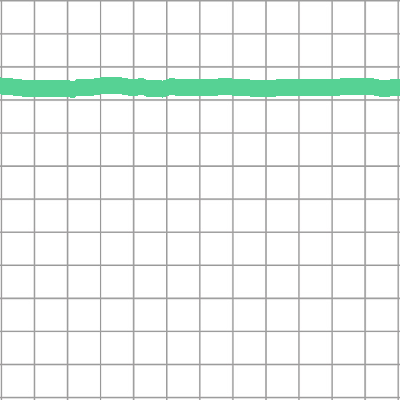

pitch78_thick4_color5_57_validation.png


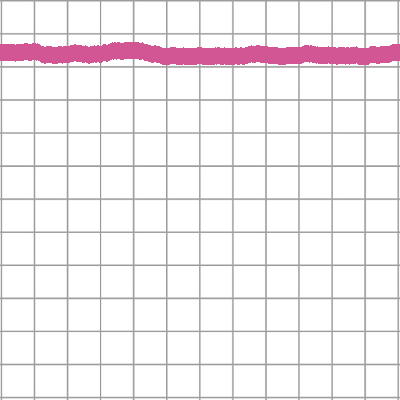

pitch79_thick4_color7_58_validation.png


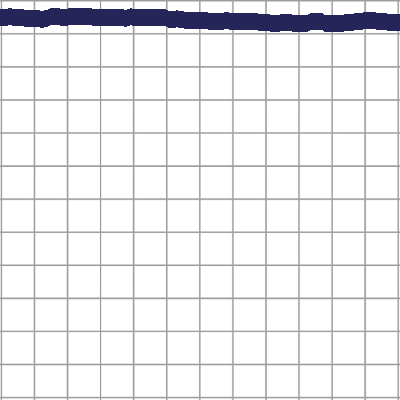

pitch80_thick4_color0_59_validation.png


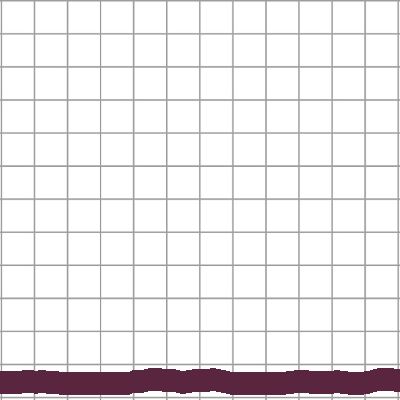

pitch69_thick5_color3_60_validation.png


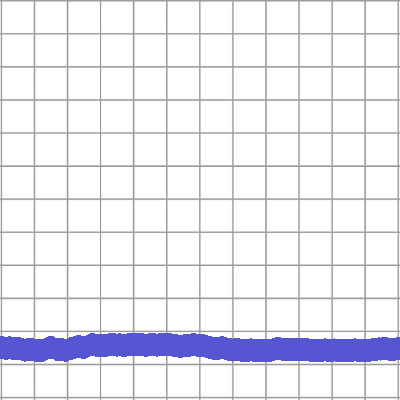

pitch70_thick5_color4_61_validation.png


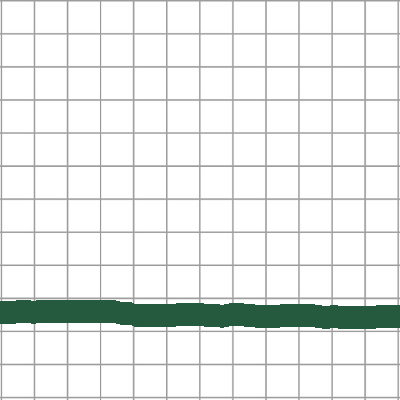

pitch71_thick5_color1_62_validation.png


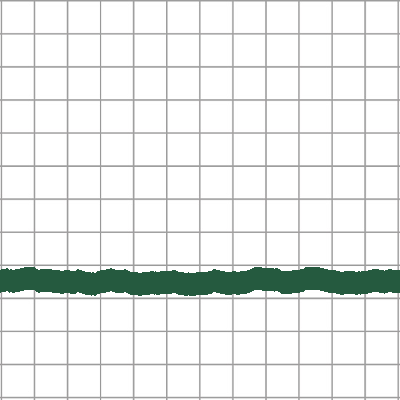

pitch72_thick5_color1_63_validation.png


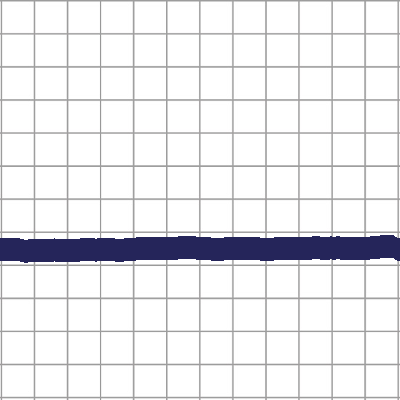

pitch73_thick5_color0_64_validation.png


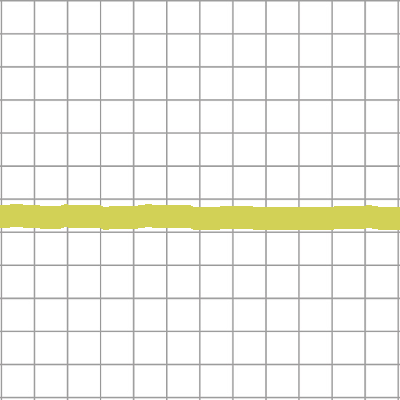

pitch74_thick5_color6_65_validation.png


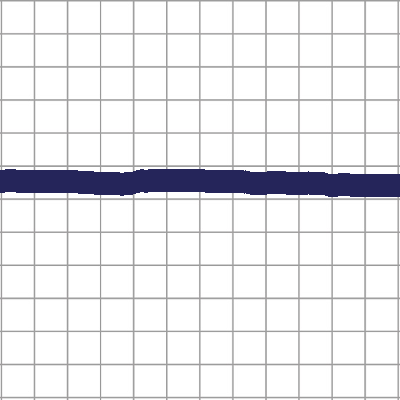

pitch75_thick5_color0_66_validation.png


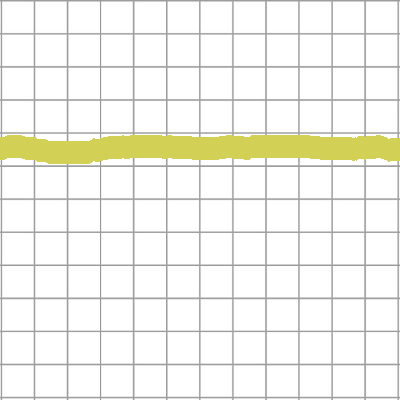

pitch76_thick5_color6_67_validation.png


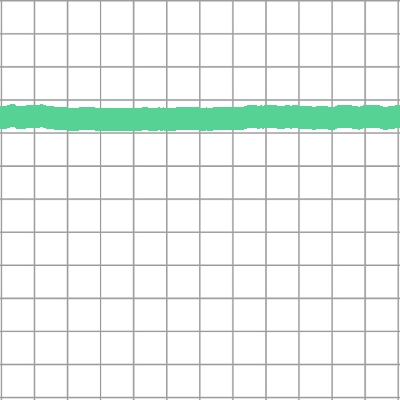

pitch77_thick5_color5_68_validation.png


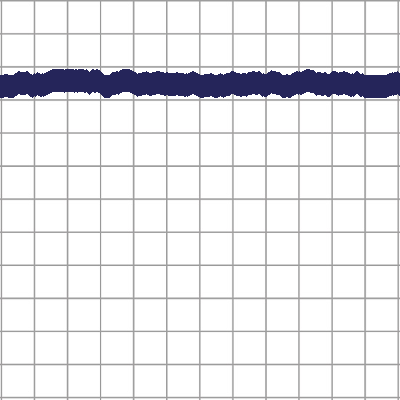

pitch78_thick5_color0_69_validation.png


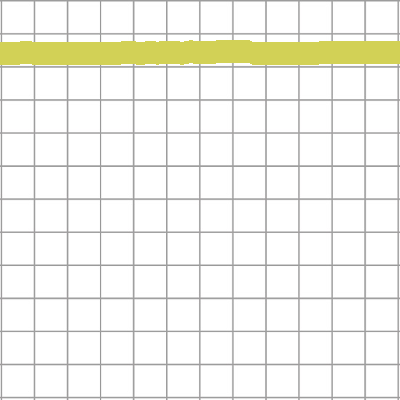

pitch79_thick5_color6_70_validation.png


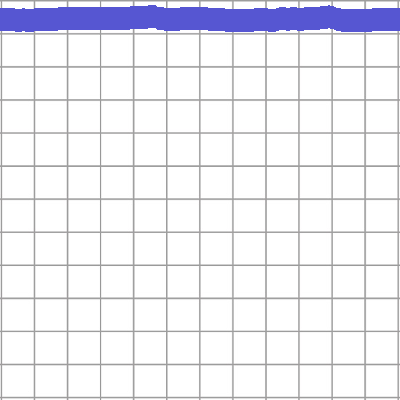

pitch80_thick5_color4_71_validation.png


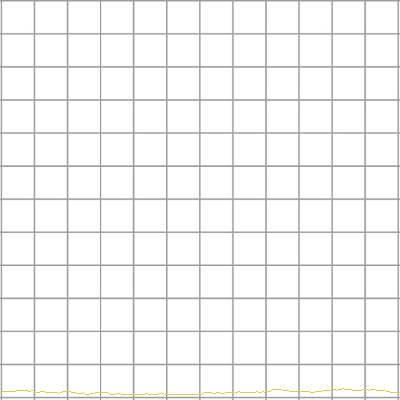

pitch69_thick0_color6_72_validation.png


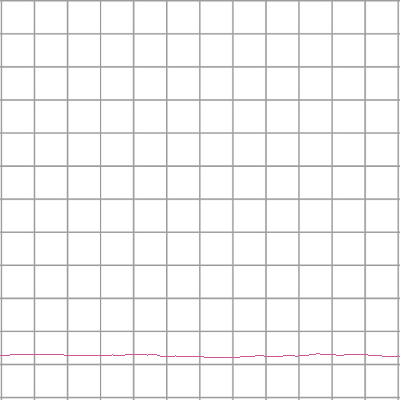

pitch70_thick0_color7_73_validation.png


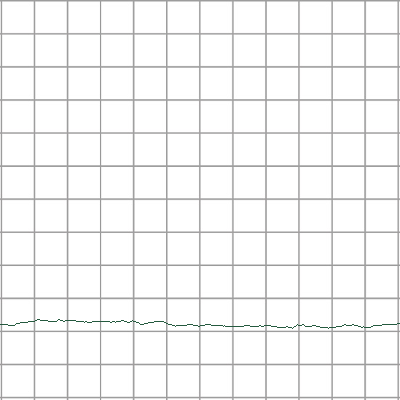

pitch71_thick0_color1_74_validation.png


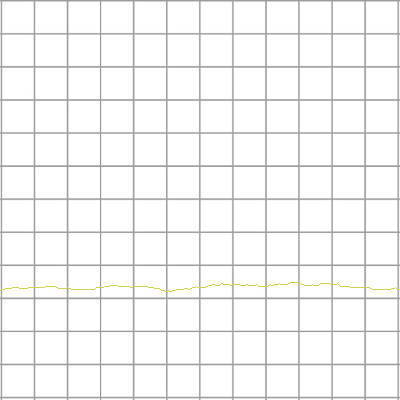

pitch72_thick0_color6_75_validation.png


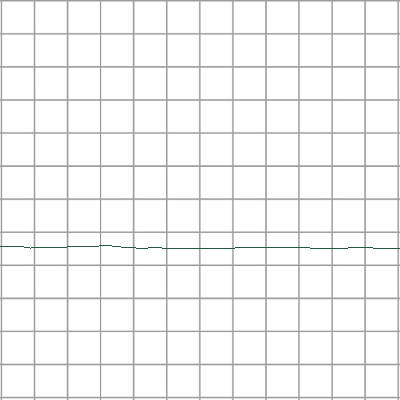

pitch73_thick0_color1_76_validation.png


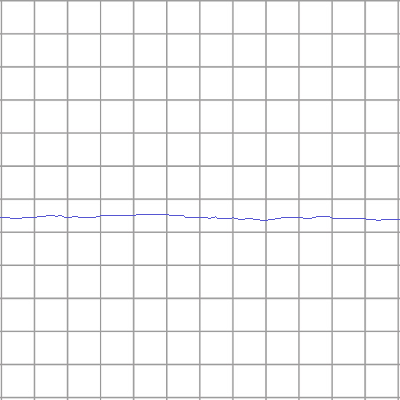

pitch74_thick0_color4_77_validation.png


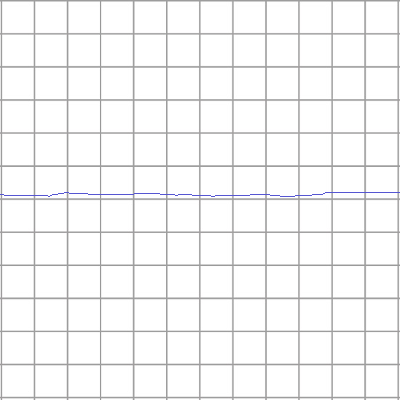

pitch75_thick0_color4_78_validation.png


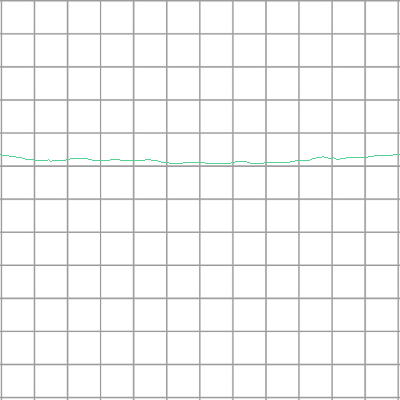

pitch76_thick0_color5_79_validation.png


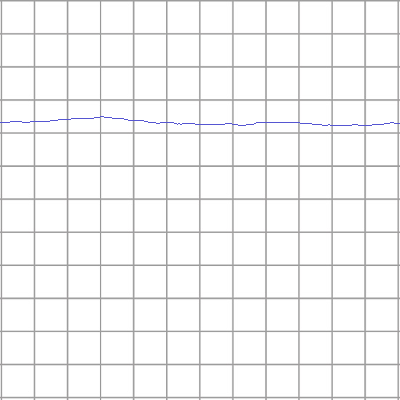

pitch77_thick0_color4_80_validation.png


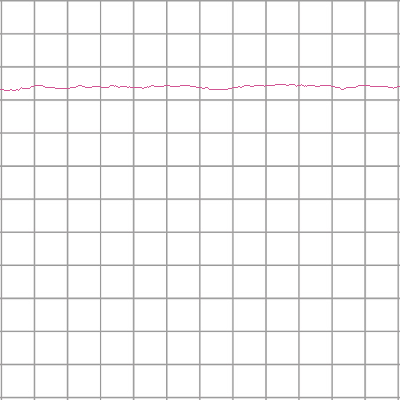

pitch78_thick0_color7_81_validation.png


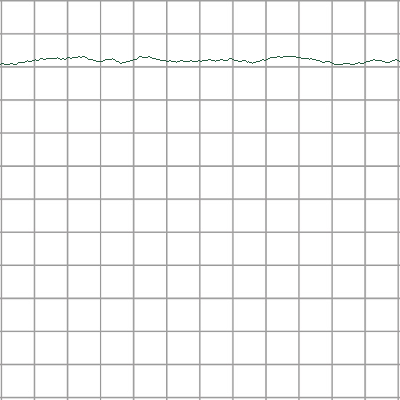

pitch79_thick0_color1_82_validation.png


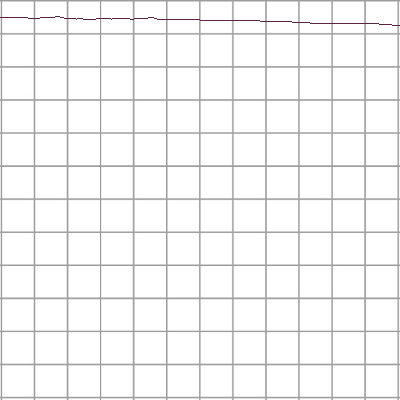

pitch80_thick0_color3_83_validation.png


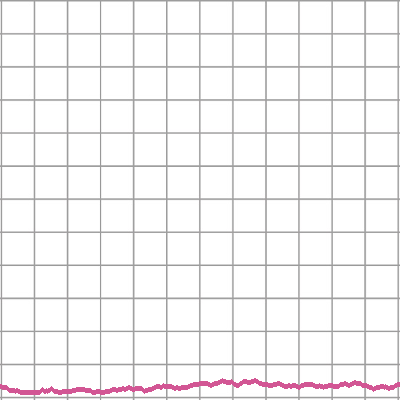

pitch69_thick1_color7_84_validation.png


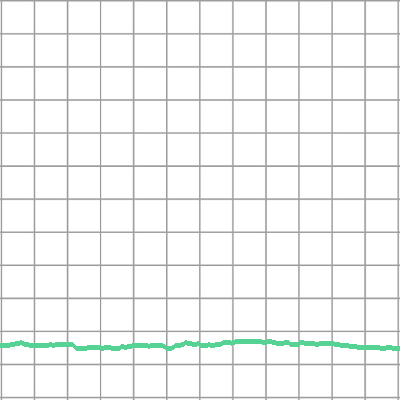

pitch70_thick1_color5_85_validation.png


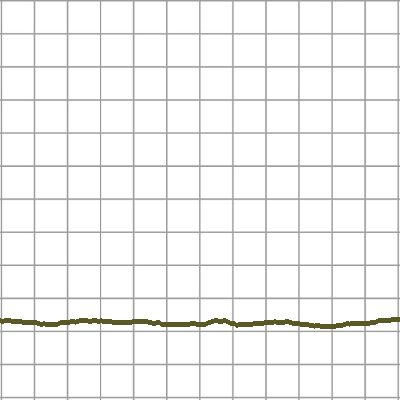

pitch71_thick1_color2_86_validation.png


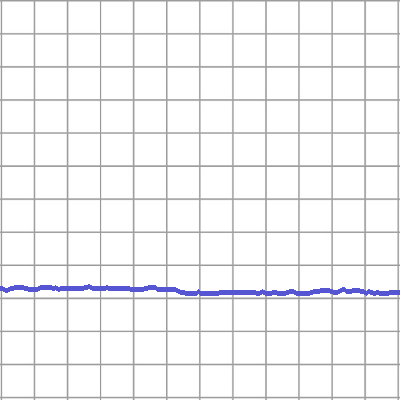

pitch72_thick1_color4_87_validation.png


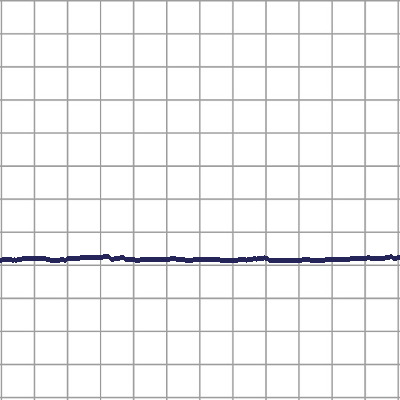

pitch73_thick1_color0_88_validation.png


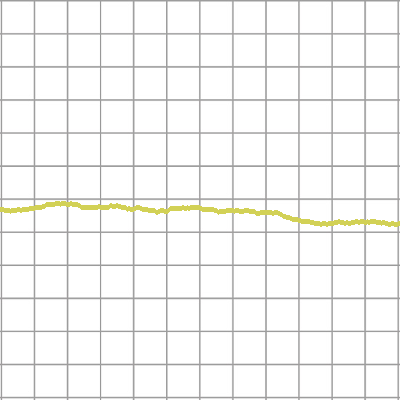

pitch74_thick1_color6_89_validation.png


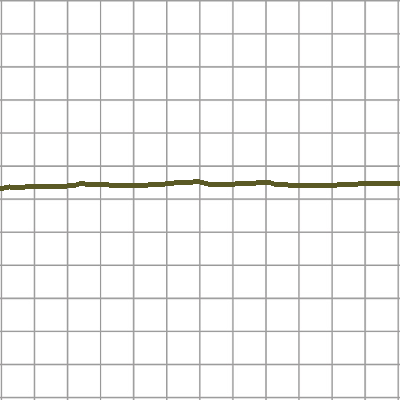

pitch75_thick1_color2_90_validation.png


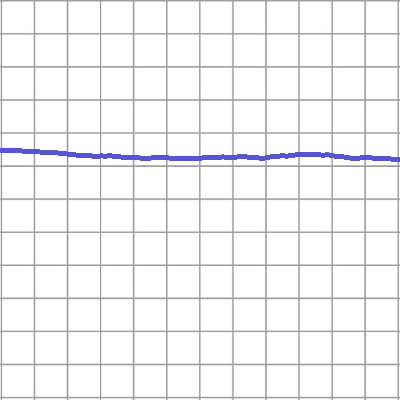

pitch76_thick1_color4_91_validation.png


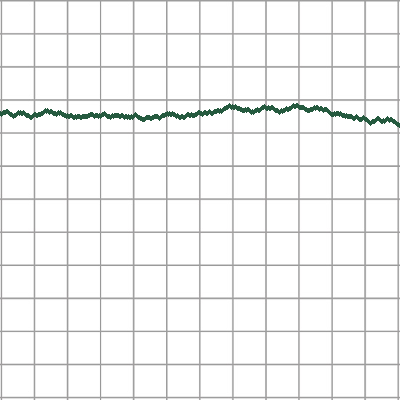

pitch77_thick1_color1_92_validation.png


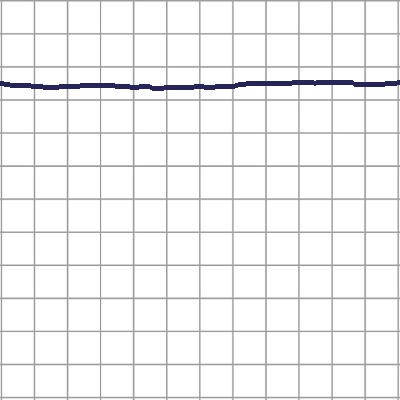

pitch78_thick1_color0_93_validation.png


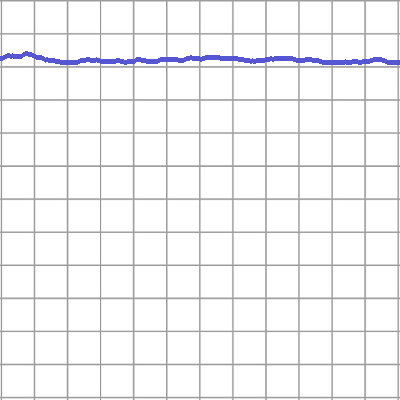

pitch79_thick1_color4_94_validation.png


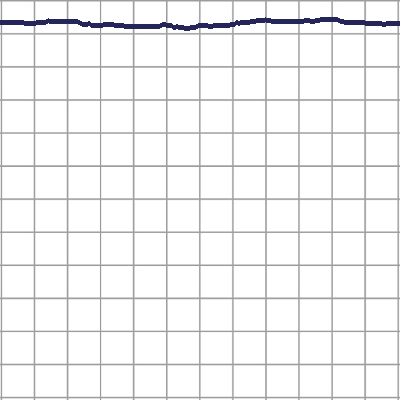

pitch80_thick1_color0_95_validation.png


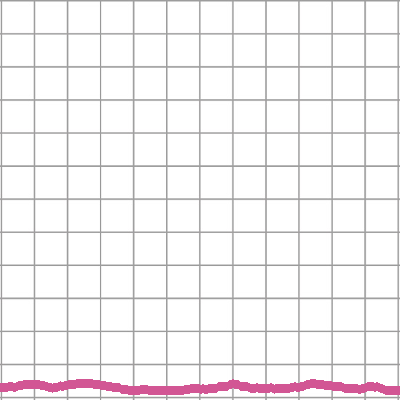

pitch69_thick2_color7_96_validation.png


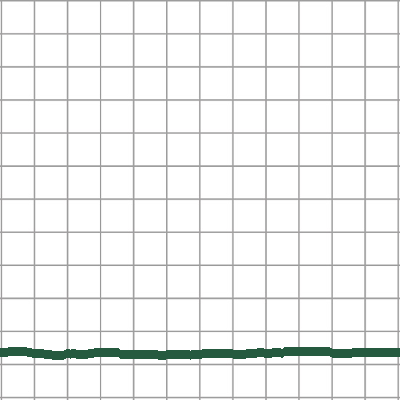

pitch70_thick2_color1_97_validation.png


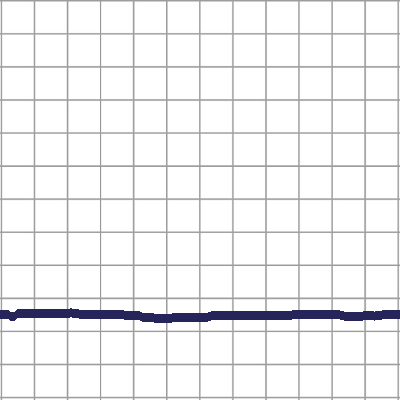

pitch71_thick2_color0_98_validation.png


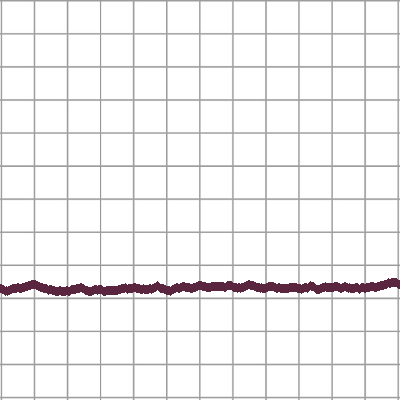

pitch72_thick2_color3_99_validation.png


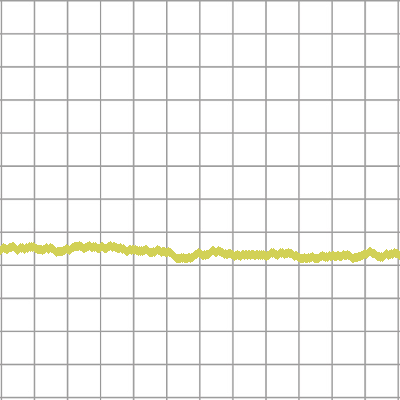

pitch73_thick2_color6_100_validation.png


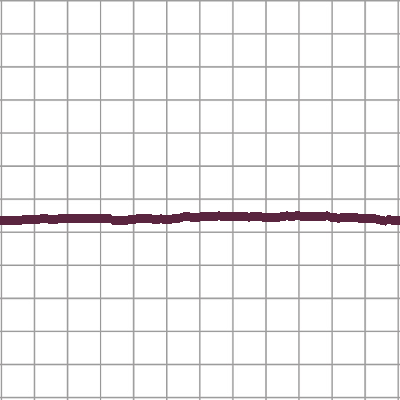

pitch74_thick2_color3_101_validation.png


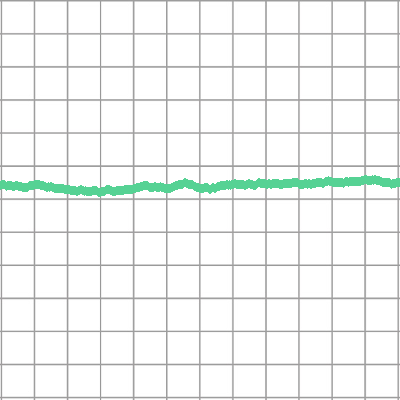

pitch75_thick2_color5_102_validation.png


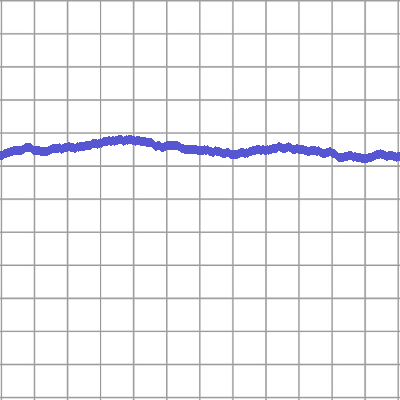

pitch76_thick2_color4_103_validation.png


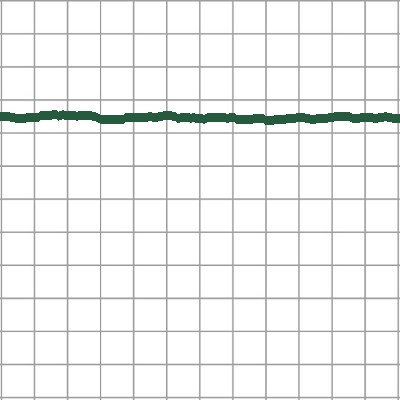

pitch77_thick2_color1_104_validation.png


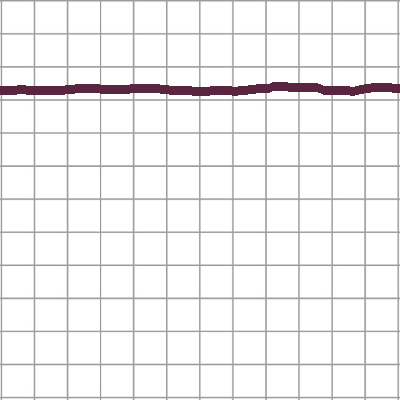

pitch78_thick2_color3_105_validation.png


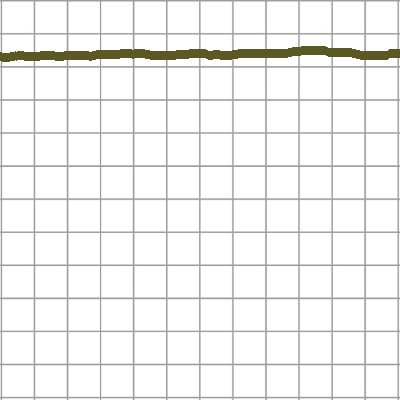

pitch79_thick2_color2_106_validation.png


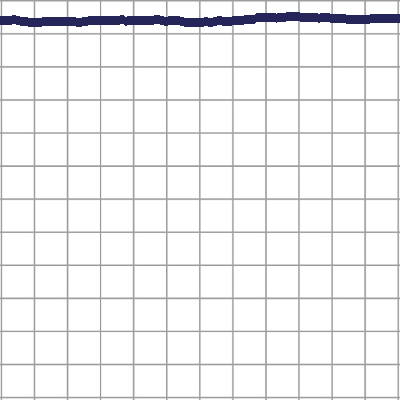

pitch80_thick2_color0_107_validation.png


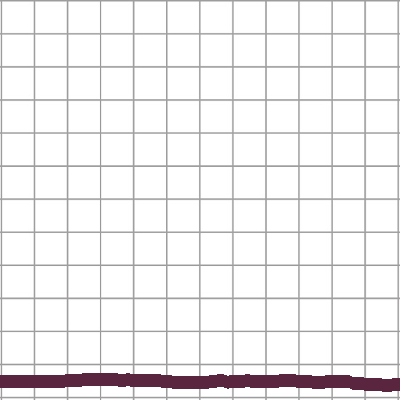

pitch69_thick3_color3_108_validation.png


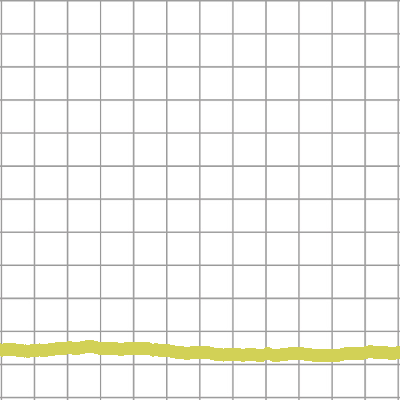

pitch70_thick3_color6_109_validation.png


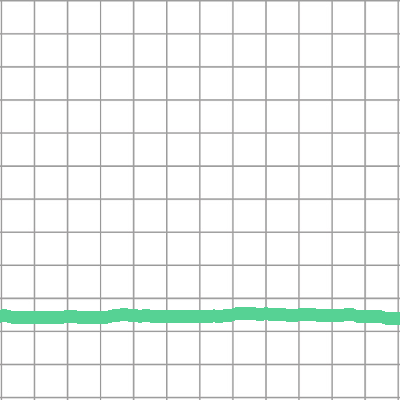

pitch71_thick3_color5_110_validation.png


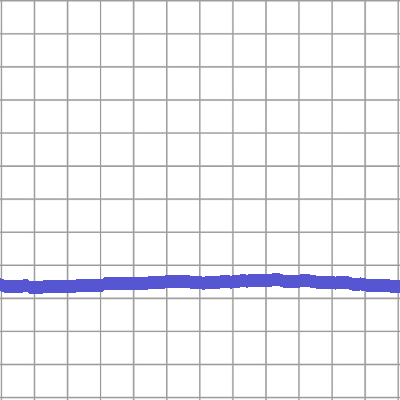

pitch72_thick3_color4_111_validation.png


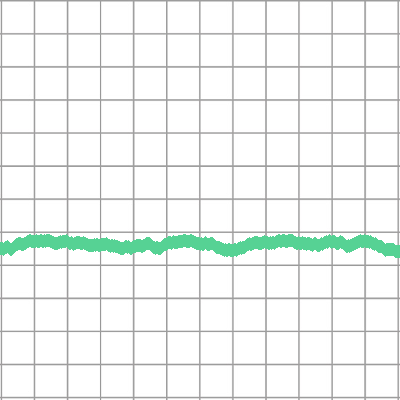

pitch73_thick3_color5_112_validation.png


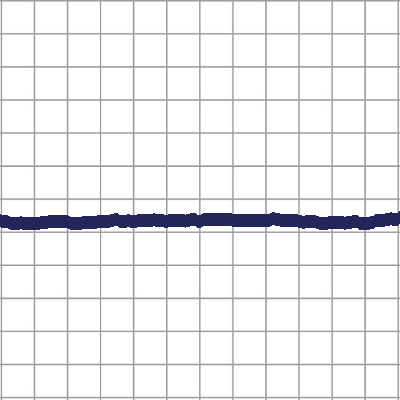

pitch74_thick3_color0_113_validation.png


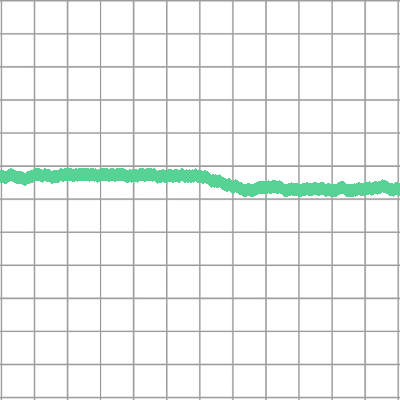

pitch75_thick3_color5_114_validation.png


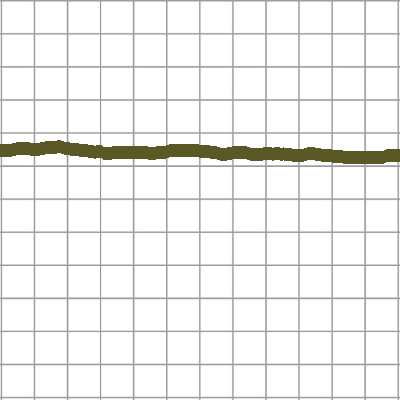

pitch76_thick3_color2_115_validation.png


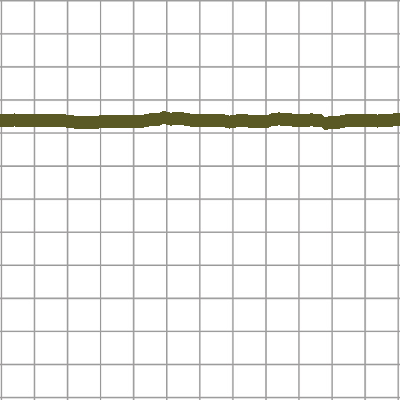

pitch77_thick3_color2_116_validation.png


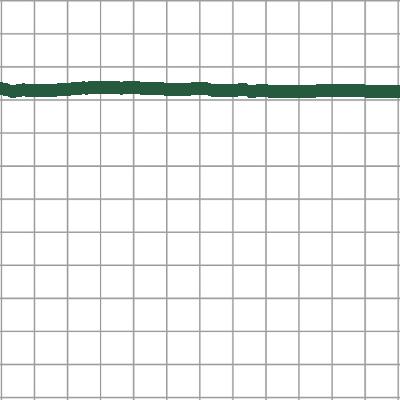

pitch78_thick3_color1_117_validation.png


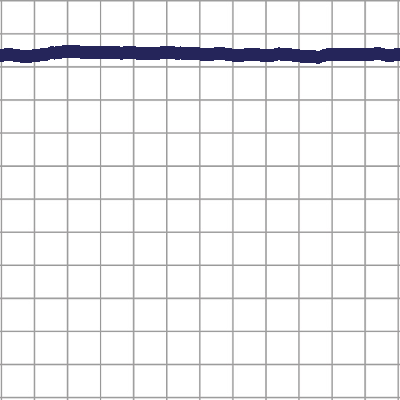

pitch79_thick3_color0_118_validation.png


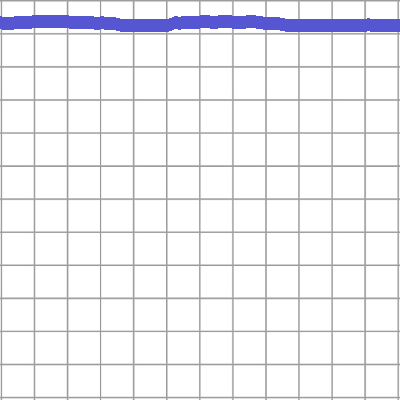

pitch80_thick3_color4_119_validation.png


In [0]:
## PICTURE GENERATION

def generate_pict(nb_pict, folder):
  """ creates nb_pictures of pitch-lines and saves them permanently in the folder img_'folder'.
      Folder has to be a string and nb_pict is an integer."""
  
  thickness = 12
  hueval_tab = [[(i*180)/(NB_COLOR//2), 90] for i in range(NB_COLOR//2)] + [[(i*180)/(NB_COLOR//2), 210] for i in range(NB_COLOR//2)]

  for i in range (nb_pict) :
    
    # creation of the baseline : quadrilled picture
    line_image_rgb = baseline.copy()
    
    line_image_hsv = cv2.cvtColor(line_image_rgb, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(line_image_hsv)
    

    # generation of lines :
    outline = 0
    if (i%NB_PITCH == 0) :               # thickness changes every 12 notes
      if(thickness == 12 ) :
        thickness = 1
        thick_ind = 0
      elif (thickness == 1 ) : # maximum of (LINE_WIDTH - 4) to obtain in this case a bit of variation in the shape and avoid the creation of two exact same pictures
        thickness = 3
        thick_ind = 1
      elif(thickness == 3 ) :
        thickness = 5
        thick_ind = 2
      elif(thickness == 5 ) :
        thickness = 7
        thick_ind = 3
      elif(thickness == 7 ) :
        thickness = 9
        thick_ind = 4
      elif(thickness == 9 ) :
        thickness = 12
        thick_ind = 5
    delta = (LINE_WIDTH - (thickness*2))//2 + outline     # delta of allowed variation of the line
    height = (i%NB_PITCH)*LINE_WIDTH + (LINE_WIDTH + 5)//2   # actual height depending on (i%12) the pitch and the width of a pitch line

    variation = np.random.randint(0,delta - outline) # the line begin at a random point in delta
    intervalle_max = np.random.randint(2,50)
    
    color_ind = np.random.randint(NB_COLOR)
    color = hueval_tab[color_ind]
    sat = 150
    hue = color[0]
    val = color[1]
    
    for j in  range (PICT_WIDTH):
      intervalle = np.random.randint(1,intervalle_max)              #to avoid a sharp variation, we keep the same variation height for each 'intervalle'
      if (j%intervalle == 0) :                         # if we want to change the height of the line
        tmp_var = np.random.randint(-1, 2)             # each variation is an increase or a decrease of 1 (or same height)
        if abs(variation + tmp_var) < delta :
          variation = variation + tmp_var
        else :
          variation = variation
          
      
      if( PICT_WIDTH - height - 1 + variation > 0 and PICT_WIDTH - height - 1 + variation < 400 ) :
        h[PICT_WIDTH - height - 1 + variation][PICT_WIDTH - j - 1] = hue      # creation of the line
        s[PICT_WIDTH - height - 1 + variation][PICT_WIDTH - j - 1] = sat 
        v[PICT_WIDTH - height - 1 + variation][PICT_WIDTH - j - 1] = val 


      for k in range (thickness) :
        if( PICT_WIDTH - height - 1 + variation - k > 0 and PICT_WIDTH - height - k + variation < 400 ) :
          h[PICT_WIDTH - height - 1 - k + variation][PICT_WIDTH - j - 1] = hue # and its thickness
          s[PICT_WIDTH - height - 1 - k + variation][PICT_WIDTH - j - 1] = sat
          v[PICT_WIDTH - height - 1 - k + variation][PICT_WIDTH - j - 1] = val

        if( PICT_WIDTH - height - 1 + variation + k > 0 and PICT_WIDTH - height + k + variation < 400 ) :
          h[PICT_WIDTH - height - 1 + k + variation][PICT_WIDTH - j - 1] = hue
          s[PICT_WIDTH - height - 1 + k + variation][PICT_WIDTH - j - 1] = sat
          v[PICT_WIDTH - height - 1 + k + variation][PICT_WIDTH - j - 1] = val


    line_image_hsv = cv2.merge((h,s,v))
    line_image = cv2.cvtColor(line_image_hsv, cv2.COLOR_HSV2RGB)
    
    cv2_imshow(line_image) #showing the images for tests
    name = 'pitch'+str(69 + i%NB_PITCH)+ '_thick'+str(thick_ind) + '_color' + str(color_ind) +'_'+str(i) + '_'+folder+'.png'
    print(name)

    # save the picture in google colab :
    cv2.imwrite('./audiosynthesis_dl/data/pitch_img/img_'+folder+'/'+name, line_image) #69 is pitch for la440
  

print('[INFO] generating training dataset...')
generate_pict(NB_TRAIN, 'train')
print('[INFO] generating training dataset...')
generate_pict(NB_VALIDATION, 'validation')

## Loading the datas


In [0]:
## LOADING THE PICTURES

#TODO : trouver un moyen d'optimiser

print('[INFO] loading training dataset...')

imagePath_train = sorted(os.listdir( "./audiosynthesis_dl/data/pitch_img/img_train")[:])
imagePath_validation = sorted(os.listdir( "./audiosynthesis_dl/data/pitch_img/img_validation")[:])

label_train = []
label_validation = []


img_train = np.empty((0,400,400,NB_CHANNEL))
for imgP in imagePath_train :
  if imgP.split(".")[-1] != "git" and imgP.split(".")[-1] != "gitignore":
    img = image.load_img( "./audiosynthesis_dl/data/pitch_img/img_train/"+imgP, 
                             target_size=(400, 400),
                             color_mode='rgb')
    img_train = np.concatenate((img_train,np.reshape(img,(1,400,400,NB_CHANNEL))),axis=0)
    l = imgP.split("_")
    labels = l[:NB_CARACTERISTICS]
    label_train.append(labels)
    

print('[INFO] loading validation dataset...')
img_validation = np.empty((0,400,400,NB_CHANNEL))
for imgP in imagePath_validation :
  if imgP.split(".")[-1] != "git" and imgP.split(".")[-1] != "gitignore":
    img = image.load_img( "./audiosynthesis_dl/data/pitch_img/img_validation/"+imgP, 
                             target_size=(400, 400),
                             color_mode='rgb')
    img_validation = np.concatenate((img_validation,np.reshape(img,(1,400,400,NB_CHANNEL))),axis=0)
    l = imgP.split("_")
    labels = l[:NB_CARACTERISTICS]
    label_validation.append(labels)


print('img_train.shape=', img_train.shape)
print('img_validation.shape=', img_validation.shape)

print(label_validation)

[INFO] loading training dataset...
[INFO] loading validation dataset...
img_train.shape= (360, 400, 400, 3)
img_validation.shape= (120, 400, 400, 3)
[['pitch69', 'thick0', 'color5'], ['pitch69', 'thick0', 'color6'], ['pitch69', 'thick1', 'color6'], ['pitch69', 'thick1', 'color7'], ['pitch69', 'thick2', 'color3'], ['pitch69', 'thick2', 'color7'], ['pitch69', 'thick3', 'color3'], ['pitch69', 'thick3', 'color4'], ['pitch69', 'thick4', 'color1'], ['pitch69', 'thick5', 'color3'], ['pitch70', 'thick0', 'color7'], ['pitch70', 'thick0', 'color7'], ['pitch70', 'thick1', 'color4'], ['pitch70', 'thick1', 'color5'], ['pitch70', 'thick2', 'color1'], ['pitch70', 'thick2', 'color1'], ['pitch70', 'thick3', 'color6'], ['pitch70', 'thick3', 'color6'], ['pitch70', 'thick4', 'color3'], ['pitch70', 'thick5', 'color4'], ['pitch71', 'thick0', 'color1'], ['pitch71', 'thick0', 'color7'], ['pitch71', 'thick1', 'color2'], ['pitch71', 'thick1', 'color4'], ['pitch71', 'thick2', 'color0'], ['pitch71', 'thick2', 'co

In [0]:
## CONVERTING THE DATA

def converting_data(img_tab) :
  """ convert the data in float between 0 et 1"""
  # Convert to float
  img_tab = img_tab.astype('float32')
  # Normalize inputs from [0; 255] to [0; 1]
  imgnorm_tab = img_tab / 255

  return imgnorm_tab

In [0]:
## MIXING THE DATA FOR A GOOD LEARNING
def shuffle_data(img_tab, label_tab, nb_pict) :
  """ create shuffled tabs of data and corresponding labels """
  imgnorm_tab = converting_data(img_tab)
    
  xy_tab = []
  for i in range(nb_pict):
    label_tab_i = []
    pitch = int(label_tab[i][0].split('pitch')[1]) - 69 #labels are converted into integer between 0 and the number of classes
    thick = int(label_tab[i][1].split('thick')[1])
    color = int(label_tab[i][2].split('color')[1])
    label_tab_i.append(pitch)
    label_tab_i.append(thick)
    label_tab_i.append(color)
    
    xy = [imgnorm_tab[i],label_tab_i]
    xy_tab.append(xy)
    
  random.shuffle(xy_tab)
  
  x_tab = np.empty((nb_pict,400,400,NB_CHANNEL))
  y_tab = np.empty((nb_pict,NB_CARACTERISTICS))
  
  for i in range(nb_pict):
    x_tab[i] = xy_tab[i][0]
    y_tab[i] = xy_tab[i][1]
    
  return [x_tab,y_tab]

x_train = np.copy(img_train)
x_validation = np.copy(img_validation)
y_train = np.copy((label_train,NB_CARACTERISTICS))
y_validation = np.copy((label_validation,NB_CARACTERISTICS))

print('[INFO] shuffle datasets...')
[x_train, y_train] = shuffle_data(img_train, label_train, NB_TRAIN)
[x_validation, y_validation] = shuffle_data(img_validation, label_validation, NB_VALIDATION)

print('x_train.shape=', x_train.shape)
print('x_validation.shape=', x_validation.shape)

print(y_validation)

[INFO] shuffle datasets...
x_train.shape= (360, 400, 400, 3)
x_validation.shape= (120, 400, 400, 3)
[[ 4.  0.  1.]
 [11.  1.  6.]
 [ 7.  2.  4.]
 [ 2.  0.  1.]
 [10.  4.  7.]
 [ 3.  5.  1.]
 [ 7.  2.  4.]
 [ 0.  4.  1.]
 [ 1.  1.  4.]
 [ 9.  0.  7.]
 [ 4.  0.  1.]
 [10.  2.  2.]
 [ 7.  1.  4.]
 [ 9.  4.  5.]
 [ 1.  2.  1.]
 [ 0.  5.  3.]
 [10.  1.  4.]
 [ 8.  0.  7.]
 [ 0.  2.  3.]
 [ 3.  3.  0.]
 [ 0.  3.  3.]
 [ 3.  0.  7.]
 [ 4.  3.  6.]
 [10.  3.  0.]
 [ 2.  2.  0.]
 [ 0.  0.  5.]
 [ 4.  1.  0.]
 [11.  0.  5.]
 [ 3.  2.  7.]
 [ 1.  5.  4.]
 [ 3.  1.  4.]
 [ 1.  3.  6.]
 [ 8.  1.  1.]
 [10.  3.  3.]
 [ 6.  1.  2.]
 [ 9.  2.  3.]
 [ 2.  3.  4.]
 [11.  2.  0.]
 [ 3.  0.  6.]
 [ 9.  3.  7.]
 [ 0.  3.  4.]
 [ 4.  4.  0.]
 [ 6.  2.  5.]
 [ 9.  2.  3.]
 [ 5.  2.  3.]
 [ 1.  1.  5.]
 [ 4.  1.  0.]
 [ 5.  4.  4.]
 [ 5.  1.  6.]
 [ 8.  3.  2.]
 [ 3.  1.  2.]
 [ 7.  3.  2.]
 [ 7.  1.  7.]
 [ 5.  3.  0.]
 [ 7.  5.  6.]
 [ 4.  3.  5.]
 [ 6.  3.  0.]
 [ 2.  1.  2.]
 [ 5.  0.  4.]
 [ 0.  0.  6.]


## Pitch labels and Neural Network

### Generation of the features tabs

In [0]:
## GENERATION OF THE PITCH FEATURES TABS

def gen_features_tabs(y_tab, y_feature, i_feature) :
  ''' generate a tab containing the labels for one specific feature '''
  for i in range(len(y_tab)) :
    y_feature[i] = y_tab[i][i_feature]

In [0]:
y_train_pitch = np.empty(NB_TRAIN)
y_validation_pitch = np.empty(NB_VALIDATION)
gen_features_tabs(y_train, y_train_pitch, 0)
gen_features_tabs(y_validation, y_validation_pitch, 0)

print('[INFO] generating pitch label tabs...')
print('y_train_pitch.shape=', y_train_pitch.shape)
print('y_validation_pitch.shape=', y_validation_pitch.shape)

print(y_validation_pitch)


[INFO] generating pitch label tabs...
y_train_pitch.shape= (360,)
y_validation_pitch.shape= (120,)
[ 4. 11.  7.  2. 10.  3.  7.  0.  1.  9.  4. 10.  7.  9.  1.  0. 10.  8.
  0.  3.  0.  3.  4. 10.  2.  0.  4. 11.  3.  1.  3.  1.  8. 10.  6.  9.
  2. 11.  3.  9.  0.  4.  6.  9.  5.  1.  4.  5.  5.  8.  3.  7.  7.  5.
  7.  4.  6.  2.  5.  0.  9. 10.  6.  2.  6.  2.  5.  1.  7.  2. 11.  5.
  2.  3. 10.  4. 10.  1.  8.  8.  0.  7.  6.  0.  6.  1.  2.  5.  4. 11.
  7. 11.  5. 10. 11.  9.  8.  5. 10.  6.  1.  9. 11.  8.  2. 11.  6. 11.
  8.  3.  6.  4.  0.  8.  7.  9.  9.  1.  3.  8.]


In [0]:
# Convert class vectors to binary class matrices ("one hot encoding")

print('[INFO] converting class vectors...')
y_train_pitch = keras.utils.to_categorical(y_train_pitch, NB_PITCH)
y_validation_pitch = keras.utils.to_categorical(y_validation_pitch, NB_PITCH)


print('y_train_pitch.shape =', y_train_pitch.shape)
print('y_validation_pitch.shape = ', y_validation_pitch.shape)

[INFO] converting class vectors...
y_train_pitch.shape = (360, 12)
y_validation_pitch.shape =  (120, 12)


### The Convolutional Neural Network

Now we need to create and compile the CNN that will classify our datas.

In [0]:
## CREATION OF THE PITCH NEURAL NETWORK

model_pitch = Sequential()

model_pitch.add(Conv2D(filters=32, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_pitch.add(BatchNormalization(axis=-1))
model_pitch.add(MaxPooling2D(pool_size=(3,3), strides=None, padding='valid', data_format=None))
              
# (CONV => RELU) * 2 => POOL
model_pitch.add(Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_pitch.add(BatchNormalization(axis=-1))
model_pitch.add(Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_pitch.add(BatchNormalization(axis=-1))
model_pitch.add(MaxPooling2D(pool_size=(2,2), strides=None, padding='valid', data_format=None))

# (CONV => RELU) * 2 => POOL
model_pitch.add(Conv2D(filters=128, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_pitch.add(BatchNormalization(axis=-1))
model_pitch.add(Conv2D(filters=128, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_pitch.add(BatchNormalization(axis=-1))
model_pitch.add(MaxPooling2D(pool_size=(2,2), strides=None, padding='valid', data_format=None))

model_pitch.add(Conv2D(filters=256, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_pitch.add(BatchNormalization(axis=-1))
model_pitch.add(Conv2D(filters=256, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_pitch.add(BatchNormalization(axis=-1))
model_pitch.add(MaxPooling2D(pool_size=(2,2), strides=None, padding='valid', data_format=None))

# first (and only) set of FC => RELU layers
model_pitch.add(Flatten())
model_pitch.add(Dense(1024))
model_pitch.add(Activation("relu"))
model_pitch.add(BatchNormalization())
model_pitch.add(Dropout(rate=0.5))
 
# use a *sigmoid* activation for multi-label classification
model_pitch.add(Dense(NB_PITCH))
model_pitch.add(Activation('softmax'))


model_pitch.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


hist_pitch = model_pitch.fit(x_train, y_train_pitch, validation_data=(x_validation, y_validation_pitch), epochs= 16, batch_size=32)
loss_and_metrics_pitch = model_pitch.evaluate(x_validation, y_validation_pitch, batch_size=32)
print('loss =', loss_and_metrics_pitch[0],'accuracy =', loss_and_metrics_pitch[1]);

model_pitch.summary();

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.
Train on 360 samples, validate on 120 samples
Epoch 1/16
360/360 [==============================] - 14s 39ms/step - loss: 0.5302 - acc: 0.8750 - val_loss: 0.4687 - val_acc: 0.9083
Epoch 2/16
360/360 [==============================] - 5s 13ms/step - loss: 0.0070 - acc: 1.0000 - val_loss: 0.2069 - val_acc: 0.9583
Epoch 3/16
360/360 [==============================] - 5s 13ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 0.1391 - val_acc: 0.9667
Epoch 4/16
360/360 [==============================] - 5s 13ms/step - loss: 7.5321e-04 - acc: 1.0000 - val_loss: 0.0916 - val_acc: 0.9833
Epoch 5/16
360/360 [==============================] - 5s 13ms/step - loss: 4.5860e-04 - acc: 1.0000 - val_loss: 0.0303 - val_acc: 0.9917
Epoch 6/16
360/360 [=========================

In [0]:
# save the model to disk
print("[INFO] serializing network...")
# creates a HDF5 file 'my_model.h5'
model_pitch.save('model_pitch.h5')

[INFO] serializing network...


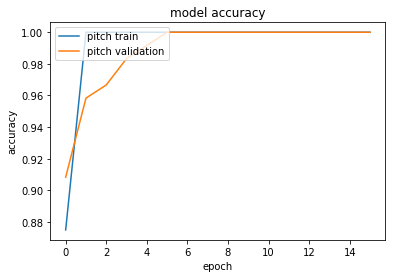

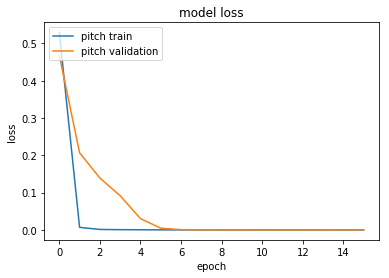

In [0]:
# summarize history for accuracy
plt.plot(hist_pitch.history['acc'])
plt.plot(hist_pitch.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['pitch train', 'pitch validation'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(hist_pitch.history['loss'])
plt.plot(hist_pitch.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['pitch train', 'pitch validation'], loc='upper left')
plt.show()


## Thickness labels and Neural Network

### Generation of the thickness feature tabs

In [0]:
## GENERATION OF THE THICKNESS FEATURES TABS

print('[INFO] generating thickness label tabs...')
y_train_thick = np.empty(NB_TRAIN)
y_validation_thick = np.empty(NB_VALIDATION)
gen_features_tabs(y_train, y_train_thick, 1)
gen_features_tabs(y_validation, y_validation_thick, 1)

print('y_train_thick.shape=', y_train_thick.shape)
print('y_validation_thick.shape=', y_validation_thick.shape)

print(y_train_thick)
print(y_validation_thick)


[INFO] generating thickness label tabs...
y_train_thick.shape= (360,)
y_validation_thick.shape= (120,)
[4. 3. 2. 5. 0. 4. 0. 2. 5. 3. 2. 3. 5. 0. 1. 2. 3. 4. 1. 2. 5. 5. 2. 3.
 4. 2. 3. 3. 5. 3. 0. 5. 3. 5. 4. 2. 3. 0. 2. 2. 4. 0. 5. 4. 5. 2. 3. 3.
 1. 0. 0. 0. 1. 2. 2. 4. 5. 2. 0. 2. 5. 0. 0. 5. 3. 2. 3. 2. 1. 3. 4. 2.
 4. 4. 3. 0. 1. 4. 5. 3. 2. 0. 4. 1. 3. 3. 1. 5. 2. 4. 3. 2. 3. 5. 5. 4.
 3. 5. 0. 3. 5. 2. 3. 5. 2. 1. 0. 2. 5. 1. 0. 4. 5. 1. 2. 0. 2. 4. 2. 4.
 2. 1. 0. 4. 3. 3. 2. 4. 0. 5. 0. 1. 4. 4. 5. 2. 0. 1. 1. 2. 4. 3. 0. 3.
 3. 1. 5. 2. 4. 3. 0. 4. 5. 5. 2. 1. 1. 0. 0. 1. 3. 4. 4. 2. 0. 2. 1. 0.
 4. 1. 1. 5. 5. 5. 5. 4. 4. 4. 3. 5. 0. 0. 0. 2. 2. 2. 4. 3. 3. 5. 4. 0.
 0. 3. 4. 5. 1. 1. 1. 1. 2. 4. 4. 0. 3. 3. 5. 4. 0. 4. 0. 2. 2. 5. 4. 3.
 1. 3. 0. 2. 4. 3. 2. 1. 1. 3. 2. 1. 0. 2. 1. 3. 1. 1. 3. 4. 1. 0. 1. 5.
 1. 2. 5. 1. 4. 4. 1. 0. 4. 0. 0. 5. 5. 2. 4. 3. 3. 0. 0. 1. 1. 2. 5. 1.
 0. 2. 5. 1. 3. 2. 5. 5. 4. 4. 2. 5. 0. 2. 0. 5. 4. 5. 2. 3. 0. 3. 5. 1.
 2. 1. 2. 3. 5. 1. 0.

In [0]:
print('[INFO] converting class vectors...')
y_train_thick = keras.utils.to_categorical(y_train_thick, NB_THICK)
y_validation_thick = keras.utils.to_categorical(y_validation_thick, NB_THICK)


print('y_train_thick.shape =', y_train_thick.shape)
print('y_validation_thick.shape =', y_validation_thick.shape)

[INFO] converting class vectors...
y_train_thick.shape = (360, 6)
y_validation_thick.shape = (120, 6)


### Creation and training of the Neural Network

In [0]:
## CREATION OF THE THICKNESS NEURAL NETWORK

print('[INFO] training THICKNESS NETWORK...')

model_thick = Sequential()

model_thick.add(Conv2D(filters=32, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_thick.add(BatchNormalization(axis=-1))
model_thick.add(Conv2D(filters=32, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_thick.add(BatchNormalization(axis=-1))
model_thick.add(MaxPooling2D(pool_size=(3,3), strides=None, padding='valid', data_format=None))
model_thick.add(Dropout(0.5))
              
# (CONV => RELU) * 2 => POOL
model_thick.add(Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_thick.add(BatchNormalization(axis=-1))
model_thick.add(Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_thick.add(BatchNormalization(axis=-1))
model_thick.add(MaxPooling2D(pool_size=(2,2), strides=None, padding='valid', data_format=None))
model_thick.add(Dropout(0.5))

# (CONV => RELU) * 2 => POOL
model_thick.add(Conv2D(filters=128, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_thick.add(BatchNormalization(axis=-1))
model_thick.add(Conv2D(filters=128, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_thick.add(BatchNormalization(axis=-1))
model_thick.add(MaxPooling2D(pool_size=(2,2), strides=None, padding='valid', data_format=None))
model_thick.add(Conv2D(filters=128, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_thick.add(BatchNormalization(axis=-1))
model_thick.add(MaxPooling2D(pool_size=(2,2), strides=None, padding='valid', data_format=None))
model_thick.add(Dropout(0.5))

# (CONV => RELU) * 2 => POOL
model_thick.add(Conv2D(filters=256, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_thick.add(BatchNormalization(axis=-1))
model_thick.add(Conv2D(filters=256, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_thick.add(BatchNormalization(axis=-1))
model_thick.add(Conv2D(filters=256, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_thick.add(BatchNormalization(axis=-1))
model_thick.add(MaxPooling2D(pool_size=(2,2), strides=None, padding='valid', data_format=None))
model_thick.add(Dropout(0.25))

# first (and only) set of FC => RELU layers
model_thick.add(Flatten())
model_thick.add(Dense(1024))
model_thick.add(Activation("relu"))
model_thick.add(BatchNormalization())
model_thick.add(Dense(1024))
model_thick.add(Activation("relu"))
model_thick.add(BatchNormalization())
model_thick.add(Dropout(0.25))
 
# use a *sigmoid* activation for multi-label classification
model_thick.add(Dense(NB_THICK))
model_thick.add(Activation('softmax'))


model_thick.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


hist_thick = model_thick.fit(x_train, y_train_thick, validation_data=(x_validation, y_validation_thick), epochs=50, batch_size=32)
loss_and_metrics_thick = model_thick.evaluate(x_validation, y_validation_thick, batch_size=32)
print('loss =', loss_and_metrics_thick[0],'accuracy =', loss_and_metrics_thick[1]);

model_thick.summary();


[INFO] training THICKNESS NETWORK...
Train on 360 samples, validate on 120 samples
Epoch 1/50
360/360 [==============================] - 13s 36ms/step - loss: 3.0542 - acc: 0.1778 - val_loss: 2.8127 - val_acc: 0.1750
Epoch 2/50
360/360 [==============================] - 7s 19ms/step - loss: 3.2437 - acc: 0.1667 - val_loss: 5.6732 - val_acc: 0.1333
Epoch 3/50
360/360 [==============================] - 7s 19ms/step - loss: 2.5604 - acc: 0.1833 - val_loss: 2.6036 - val_acc: 0.2083
Epoch 4/50
360/360 [==============================] - 7s 19ms/step - loss: 2.0168 - acc: 0.2972 - val_loss: 2.9819 - val_acc: 0.1083
Epoch 5/50
360/360 [==============================] - 7s 19ms/step - loss: 1.8689 - acc: 0.3028 - val_loss: 3.4444 - val_acc: 0.1083
Epoch 6/50
360/360 [==============================] - 7s 19ms/step - loss: 1.6510 - acc: 0.4222 - val_loss: 3.3026 - val_acc: 0.1167
Epoch 7/50
360/360 [==============================] - 7s 19ms/step - loss: 1.4288 - acc: 0.4778 - val_loss: 3.1166 - v

In [0]:
# save the model to disk
print("[INFO] serializing network...")
# creates a HDF5 file 'my_model.h5'
model_thick.save('model_thick.h5')

[INFO] serializing network...


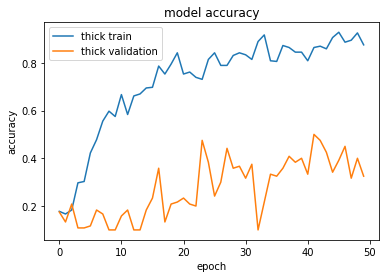

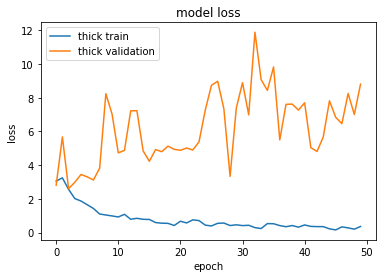

In [0]:
# summarize history for accuracy
plt.plot(hist_thick.history['acc'])
plt.plot(hist_thick.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['thick train', 'thick validation'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(hist_thick.history['loss'])
plt.plot(hist_thick.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['thick train', 'thick validation'], loc='upper left')
plt.show()


## Results

OK with 144+48 samples on epoch=10 batch=12 :

loss = 0.014248562511056662 accuracy = 1.0


## Color labels and Neural Network

### Generation of the color feature tabs

In [0]:
y_train_color = np.empty(NB_TRAIN)
y_validation_color = np.empty(NB_VALIDATION)
gen_features_tabs(y_train, y_train_color, 2)
gen_features_tabs(y_validation, y_validation_color, 2)

print('[INFO] generating color label tabs...')
print('y_train_color.shape=', y_train_color.shape)
print('y_validation_color.shape=', y_validation_color.shape)

print(y_validation_color)

[INFO] generating color label tabs...
y_train_color.shape= (360,)
y_validation_color.shape= (120,)
[1. 6. 4. 1. 7. 1. 4. 1. 4. 7. 1. 2. 4. 5. 1. 3. 4. 7. 3. 0. 3. 7. 6. 0.
 0. 5. 0. 5. 7. 4. 4. 6. 1. 3. 2. 3. 4. 0. 6. 7. 4. 0. 5. 3. 3. 5. 0. 4.
 6. 2. 2. 2. 7. 0. 6. 5. 0. 2. 4. 6. 5. 2. 5. 1. 0. 5. 7. 6. 1. 2. 0. 6.
 1. 1. 5. 6. 6. 3. 5. 6. 7. 3. 7. 7. 1. 1. 4. 1. 7. 3. 5. 4. 4. 6. 3. 6.
 1. 5. 1. 4. 7. 1. 4. 4. 7. 4. 4. 0. 6. 4. 5. 0. 6. 2. 5. 0. 0. 7. 3. 1.]


In [0]:
# Convert class vectors to binary class matrices ("one hot encoding")

print('[INFO] converting class vectors...')
y_train_color = keras.utils.to_categorical(y_train_color, NB_COLOR)
y_validation_color = keras.utils.to_categorical(y_validation_color, NB_COLOR)


print('y_train_color.shape =', y_train_color.shape)
print('y_validation_color.shape = ', y_validation_color.shape)

[INFO] converting class vectors...
y_train_color.shape = (360, 8)
y_validation_color.shape =  (120, 8)


## Graphics


In [0]:
## CREATION OF THE COLOR NEURAL NETWORK

print('[INFO] training color NETWORK...')

model_color = Sequential()

model_color.add(Conv2D(filters=32, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_color.add(BatchNormalization(axis=-1))
model_color.add(MaxPooling2D(pool_size=(3,3), strides=None, padding='valid', data_format=None))
              
# (CONV => RELU) * 2 => POOL
model_color.add(Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_color.add(BatchNormalization(axis=-1))
model_color.add(Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_color.add(BatchNormalization(axis=-1))
model_color.add(MaxPooling2D(pool_size=(2,2), strides=None, padding='valid', data_format=None))
 
# (CONV => RELU) * 2 => POOL
model_color.add(Conv2D(filters=128, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_color.add(BatchNormalization(axis=-1))
model_color.add(Conv2D(filters=128, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_color.add(BatchNormalization(axis=-1))
model_color.add(MaxPooling2D(pool_size=(2,2), strides=None, padding='valid', data_format=None))

model_color.add(Conv2D(filters=256, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_color.add(BatchNormalization(axis=-1))
model_color.add(Conv2D(filters=256, kernel_size=(3,3), strides=1, padding='valid', activation='relu'))
model_color.add(BatchNormalization(axis=-1))
model_color.add(MaxPooling2D(pool_size=(2,2), strides=None, padding='valid', data_format=None))


# first (and only) set of FC => RELU layers
model_color.add(Flatten(data_format=None))
model_color.add(Dense(units=1024, activation='relu'))
model_color.add(BatchNormalization())
model_color.add(Dropout(0.75))
 
# use a *sigmoid* activation for multi-label classification
model_color.add(Dense(units=NB_COLOR, activation='softmax'))


model_color.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


hist_color = model_color.fit(x_train, y_train_color, validation_data=(x_validation, y_validation_color), epochs=50, batch_size=64)
loss_and_metrics_color = model_color.evaluate(x_validation, y_validation_color, batch_size=64)
print('loss =', loss_and_metrics_color[0],'accuracy =', loss_and_metrics_color[1]);

model_color.summary();


[INFO] training color NETWORK...
Train on 360 samples, validate on 120 samples
Epoch 1/50
360/360 [==============================] - 18s 49ms/step - loss: 3.7720 - acc: 0.1750 - val_loss: 12.1325 - val_acc: 0.1000
Epoch 2/50
360/360 [==============================] - 4s 12ms/step - loss: 2.3365 - acc: 0.3750 - val_loss: 12.0600 - val_acc: 0.1167
Epoch 3/50
360/360 [==============================] - 4s 12ms/step - loss: 1.6067 - acc: 0.4778 - val_loss: 12.3763 - val_acc: 0.1083
Epoch 4/50
360/360 [==============================] - 4s 12ms/step - loss: 1.3443 - acc: 0.5611 - val_loss: 4.4915 - val_acc: 0.3750
Epoch 5/50
360/360 [==============================] - 4s 12ms/step - loss: 0.8320 - acc: 0.7250 - val_loss: 12.7452 - val_acc: 0.1417
Epoch 6/50
360/360 [==============================] - 4s 12ms/step - loss: 0.6383 - acc: 0.7806 - val_loss: 11.2850 - val_acc: 0.1917
Epoch 7/50
360/360 [==============================] - 4s 12ms/step - loss: 0.4482 - acc: 0.8528 - val_loss: 11.4045 -

In [0]:
# save the model to disk
print("[INFO] serializing network...")
# creates a HDF5 file 'my_model.h5'
model_color.save('model_color.h5')

[INFO] serializing network...


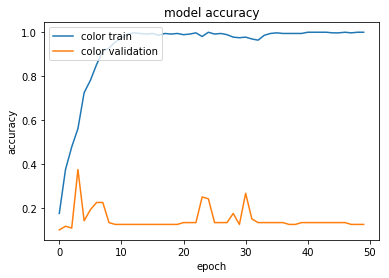

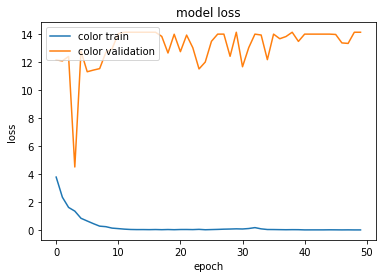

In [0]:
# summarize history for accuracy
plt.plot(hist_color.history['acc'])
plt.plot(hist_color.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['color train', 'color validation'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(hist_color.history['loss'])
plt.plot(hist_color.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['color train', 'color validation'], loc='upper left')
plt.show()


Plot all neural network stats in one graph :

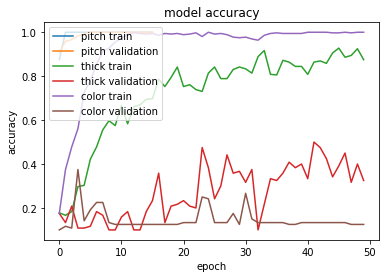

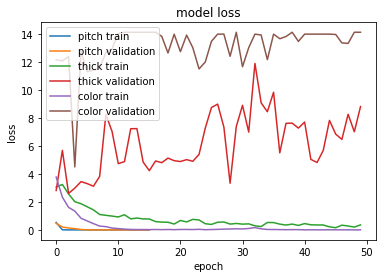

In [0]:
# summarize history for accuracy
plt.plot(hist_pitch.history['acc'])
plt.plot(hist_pitch.history['val_acc'])
plt.plot(hist_thick.history['acc'])
plt.plot(hist_thick.history['val_acc'])
plt.plot(hist_color.history['acc'])
plt.plot(hist_color.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['pitch train', 'pitch validation', 'thick train', 'thick validation','color train', 'color validation'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(hist_pitch.history['loss'])
plt.plot(hist_pitch.history['val_loss'])
plt.plot(hist_thick.history['loss'])
plt.plot(hist_thick.history['val_loss'])
plt.plot(hist_color.history['loss'])
plt.plot(hist_color.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['pitch train', 'pitch validation','thick train', 'thick validation','color train', 'color validation'], loc='upper left')
plt.show()


## Test

In [0]:
def evaluate(label_tab, y_tab, nb_pict) :
  cpt = 0
  for i in range(nb_pict):
    if(label_tab[i] == y_tab[i]) :
      cpt += 1
  value = cpt/nb_pict
  print("Accuracy of prediction of the test dataset :", value)

In [0]:
## With the img_test folder :

NB_TEST = 0
imagePath_test = sorted(os.listdir( "./audiosynthesis_dl/data/pitch_img/img_test")[:])
img_test = np.empty((0,400,400,NB_CHANNEL))
for imgP in imagePath_test :
  if imgP.split(".")[-1] != "git":
    NB_TEST += 1
    img = image.load_img( "./audiosynthesis_dl/data/pitch_img/img_test/"+imgP, 
                             target_size=(400, 400),
                             color_mode='rgb')
    img_test = np.concatenate((img_test,np.reshape(img,(1,400,400,NB_CHANNEL))),axis=0)

imgnorm_test = converting_data(img_test)
x_test = np.copy(imgnorm_test)

y_test_pitch = model_pitch.predict_classes(x_test)
y_test_thick = model_thick.predict_classes(x_test)
y_test_color = model_color.predict_classes(x_test)

# show the inputs and predicted outputs
for i in range(len(x_test)):
  print("label y_test_pitch[%s] = %s" % (i, y_test_pitch[i]))
  print("label y_test_thick[%s] = %s" % (i, y_test_thick[i] + 1))
  print("label y_test_color[%s] = %s\n" % (i, y_test_color[i]))

label y_test_pitch[0] = 0
label y_test_thick[0] = 1
label y_test_color[0] = 7

label y_test_pitch[1] = 0
label y_test_thick[1] = 1
label y_test_color[1] = 7

label y_test_pitch[2] = 0
label y_test_thick[2] = 1
label y_test_color[2] = 7

label y_test_pitch[3] = 0
label y_test_thick[3] = 1
label y_test_color[3] = 7

label y_test_pitch[4] = 0
label y_test_thick[4] = 6
label y_test_color[4] = 7

label y_test_pitch[5] = 0
label y_test_thick[5] = 1
label y_test_color[5] = 7

label y_test_pitch[6] = 0
label y_test_thick[6] = 1
label y_test_color[6] = 7

label y_test_pitch[7] = 1
label y_test_thick[7] = 1
label y_test_color[7] = 7

label y_test_pitch[8] = 1
label y_test_thick[8] = 6
label y_test_color[8] = 7

label y_test_pitch[9] = 1
label y_test_thick[9] = 1
label y_test_color[9] = 7

label y_test_pitch[10] = 1
label y_test_thick[10] = 1
label y_test_color[10] = 7

label y_test_pitch[11] = 1
label y_test_thick[11] = 6
label y_test_color[11] = 7

label y_test_pitch[12] = 1
label y_test_thick[

[INFO] generating testgen dataset...


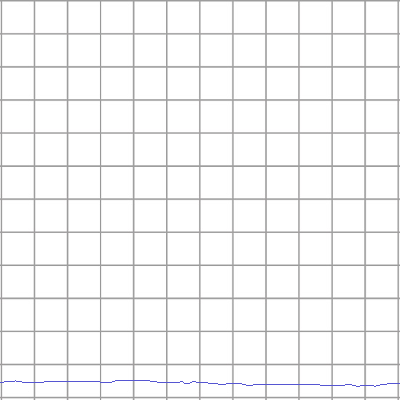

pitch69_thick0_color4_0_testgen.png


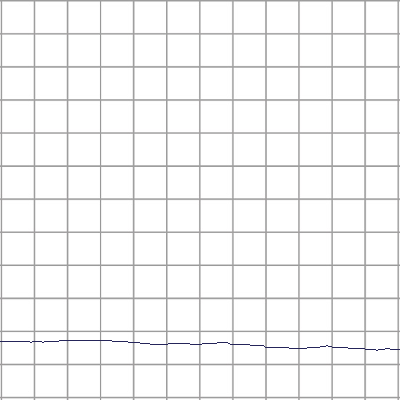

pitch70_thick0_color0_1_testgen.png


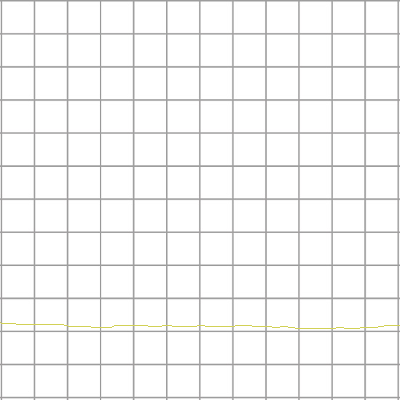

pitch71_thick0_color6_2_testgen.png


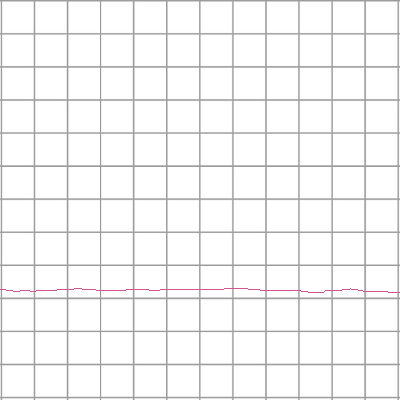

pitch72_thick0_color7_3_testgen.png


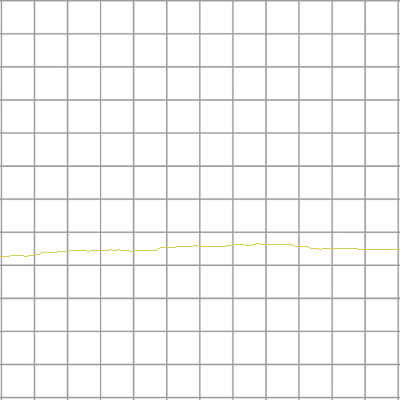

pitch73_thick0_color6_4_testgen.png


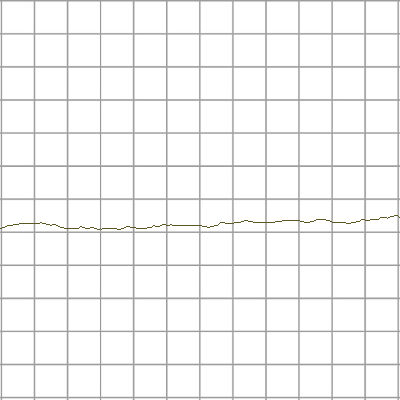

pitch74_thick0_color2_5_testgen.png


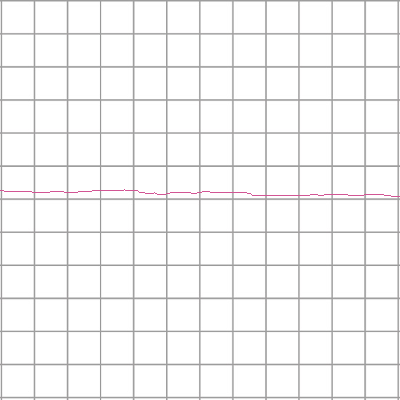

pitch75_thick0_color7_6_testgen.png


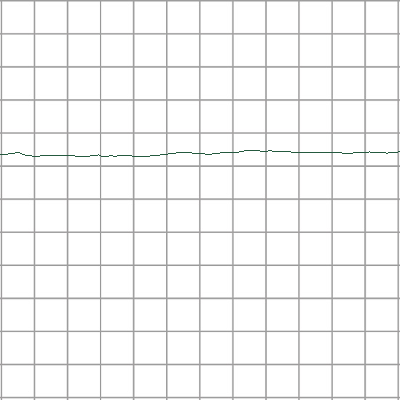

pitch76_thick0_color1_7_testgen.png


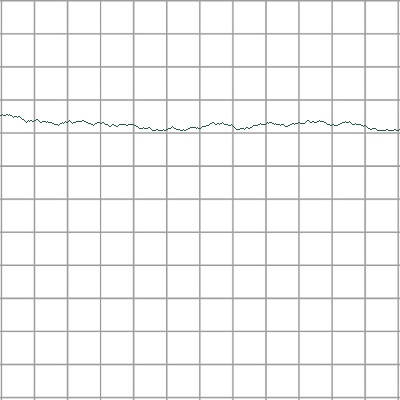

pitch77_thick0_color1_8_testgen.png


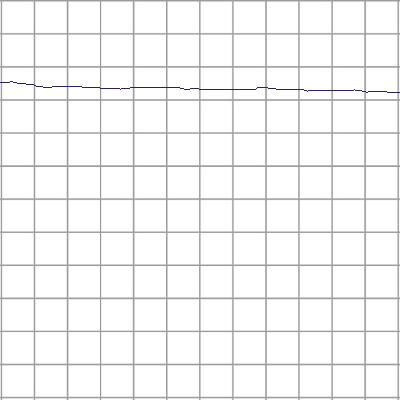

pitch78_thick0_color0_9_testgen.png


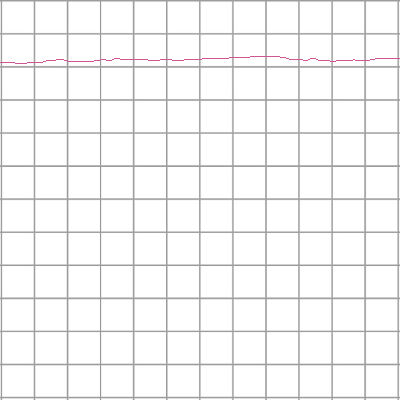

pitch79_thick0_color7_10_testgen.png


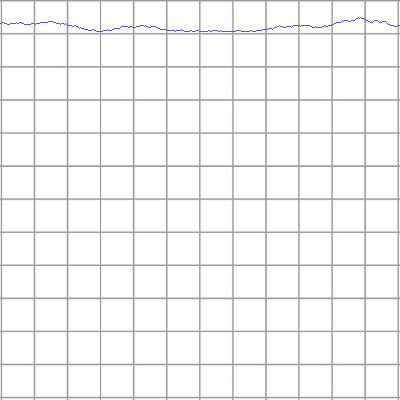

pitch80_thick0_color4_11_testgen.png


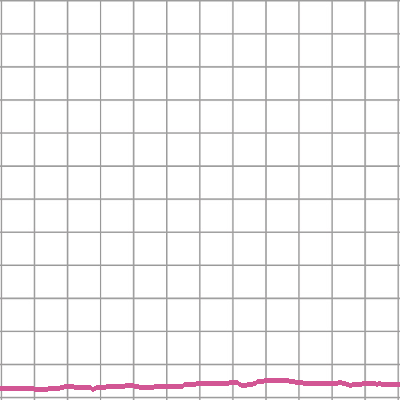

pitch69_thick1_color7_12_testgen.png


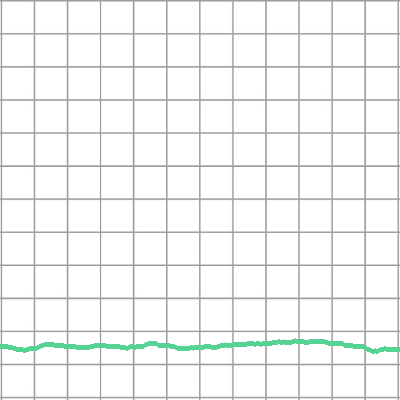

pitch70_thick1_color5_13_testgen.png


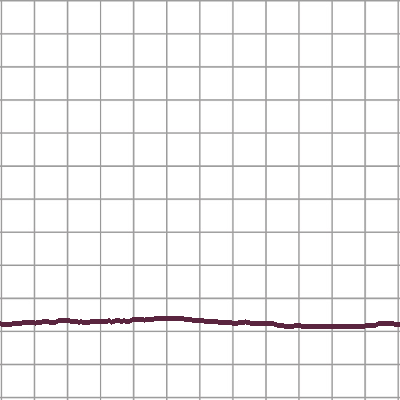

pitch71_thick1_color3_14_testgen.png


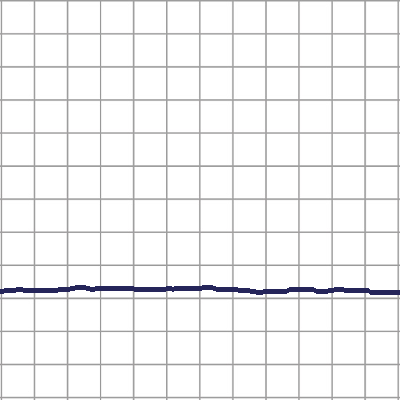

pitch72_thick1_color0_15_testgen.png


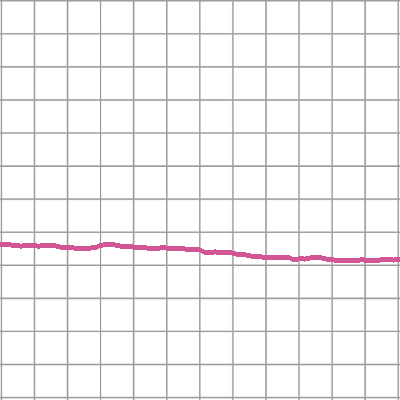

pitch73_thick1_color7_16_testgen.png


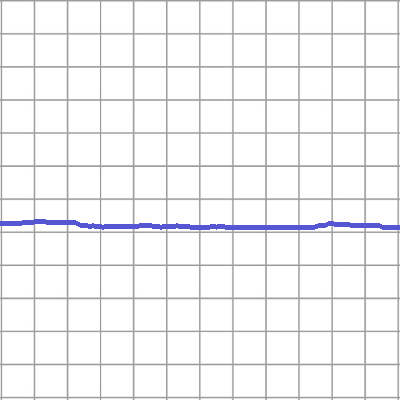

pitch74_thick1_color4_17_testgen.png


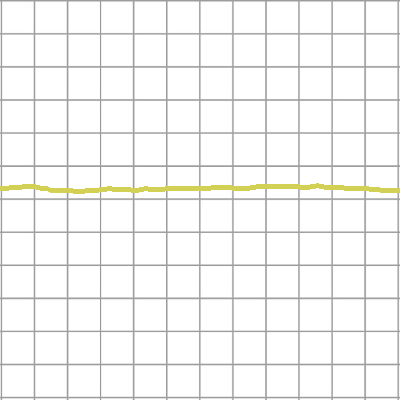

pitch75_thick1_color6_18_testgen.png


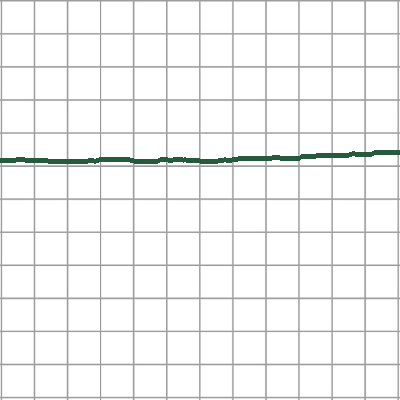

pitch76_thick1_color1_19_testgen.png


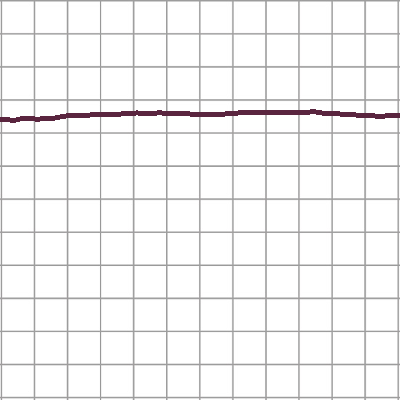

pitch77_thick1_color3_20_testgen.png


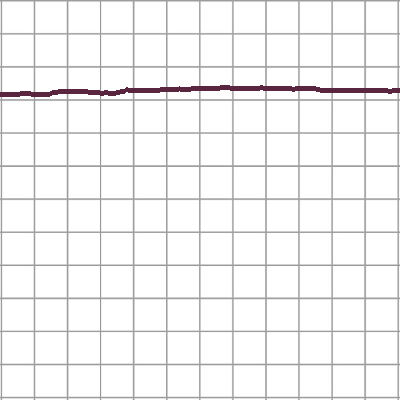

pitch78_thick1_color3_21_testgen.png


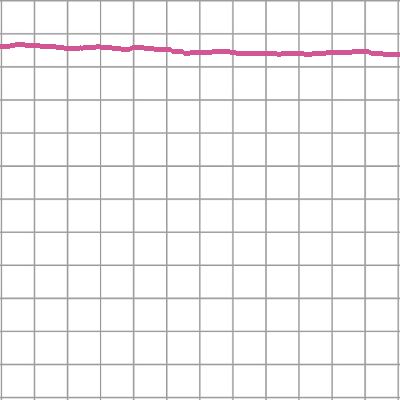

pitch79_thick1_color7_22_testgen.png


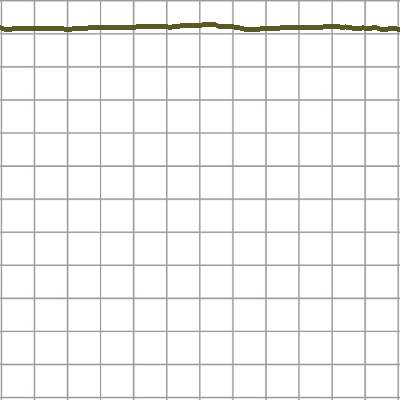

pitch80_thick1_color2_23_testgen.png


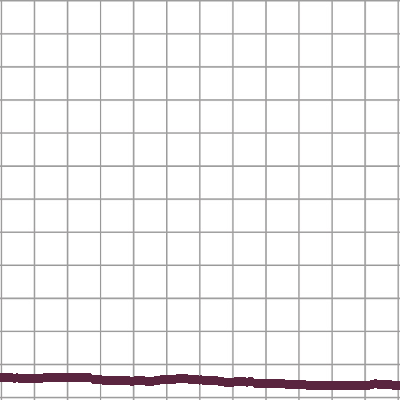

pitch69_thick2_color3_24_testgen.png


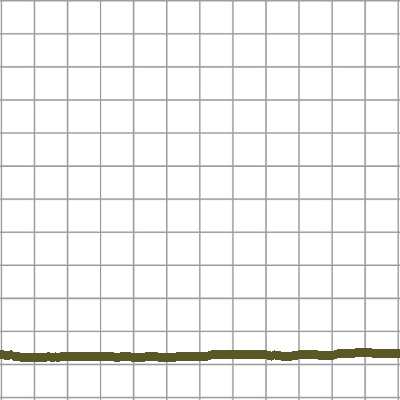

pitch70_thick2_color2_25_testgen.png


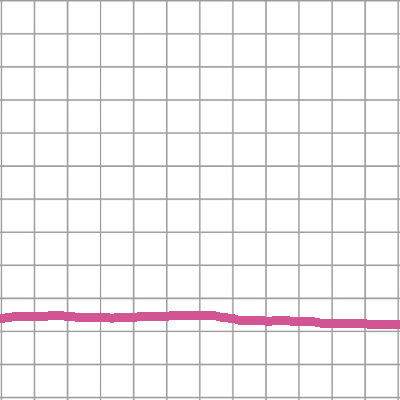

pitch71_thick2_color7_26_testgen.png


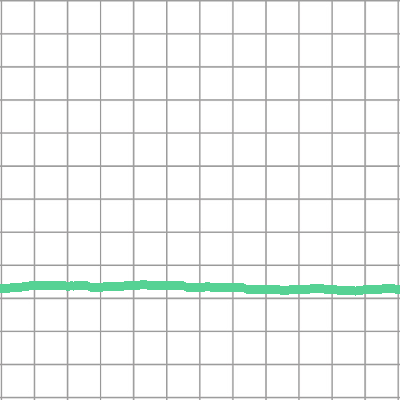

pitch72_thick2_color5_27_testgen.png


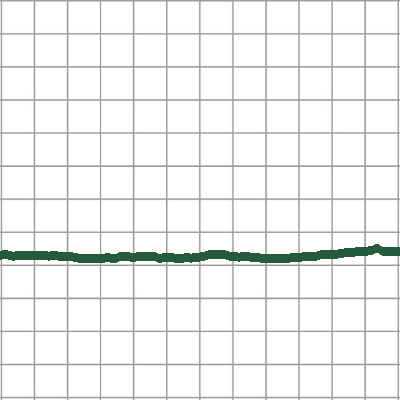

pitch73_thick2_color1_28_testgen.png


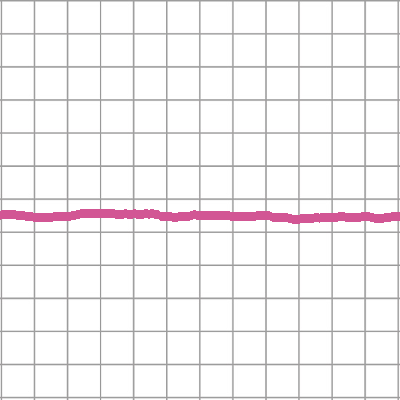

pitch74_thick2_color7_29_testgen.png


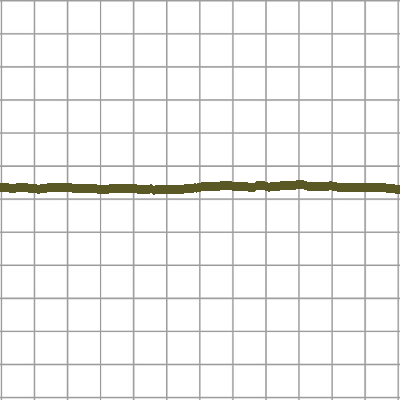

pitch75_thick2_color2_30_testgen.png


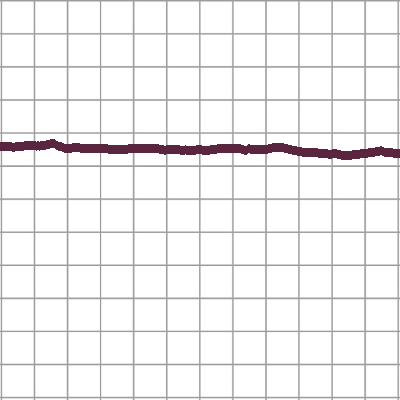

pitch76_thick2_color3_31_testgen.png


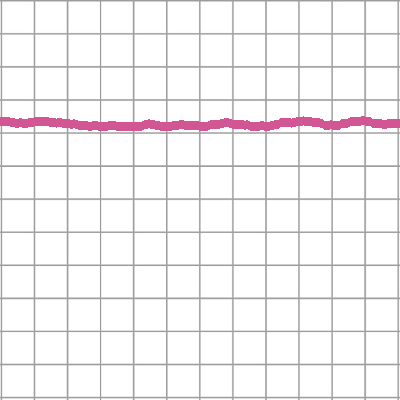

pitch77_thick2_color7_32_testgen.png


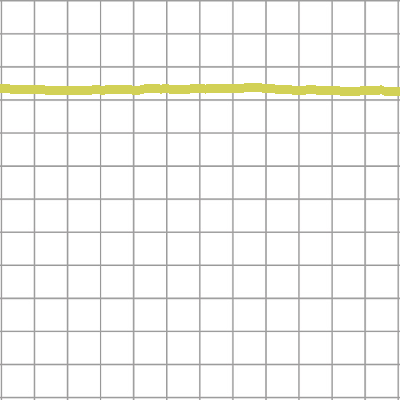

pitch78_thick2_color6_33_testgen.png


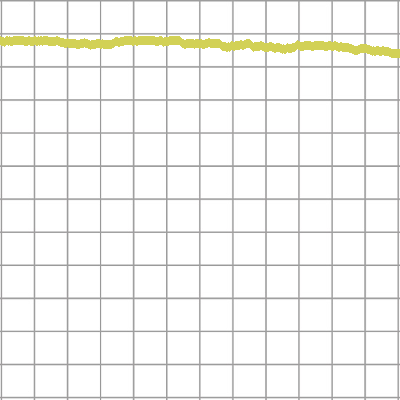

pitch79_thick2_color6_34_testgen.png


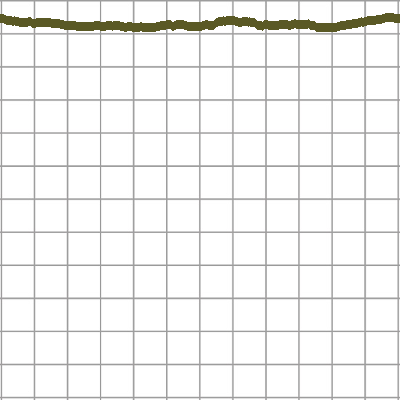

pitch80_thick2_color2_35_testgen.png


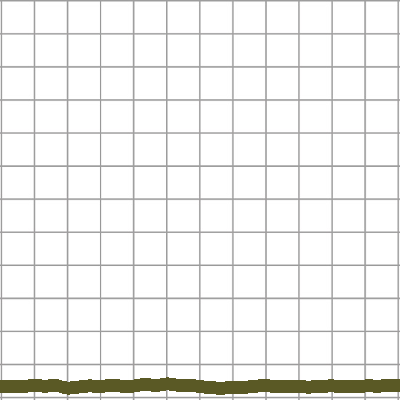

pitch69_thick3_color2_36_testgen.png


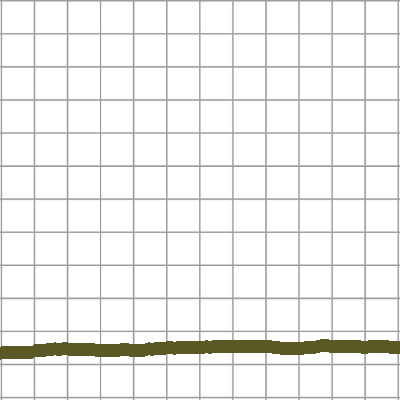

pitch70_thick3_color2_37_testgen.png


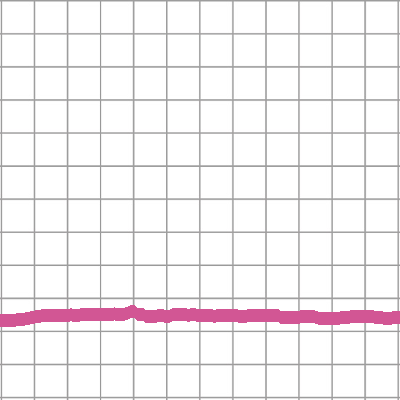

pitch71_thick3_color7_38_testgen.png


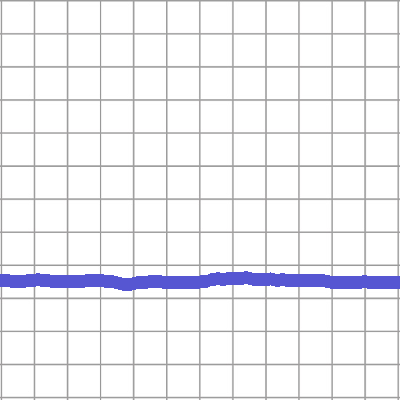

pitch72_thick3_color4_39_testgen.png


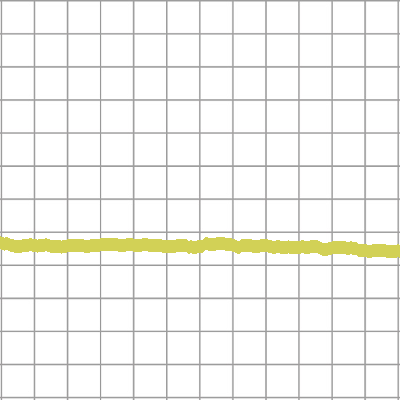

pitch73_thick3_color6_40_testgen.png


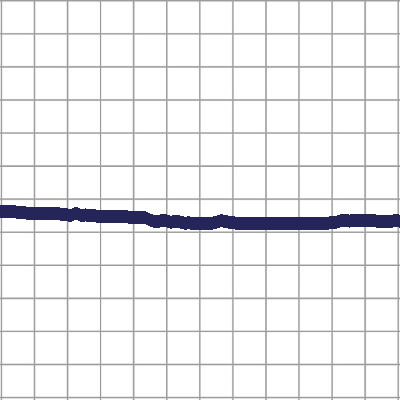

pitch74_thick3_color0_41_testgen.png


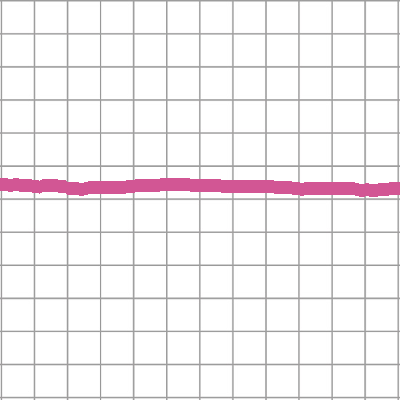

pitch75_thick3_color7_42_testgen.png


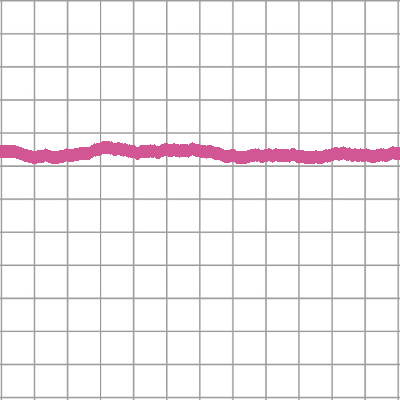

pitch76_thick3_color7_43_testgen.png


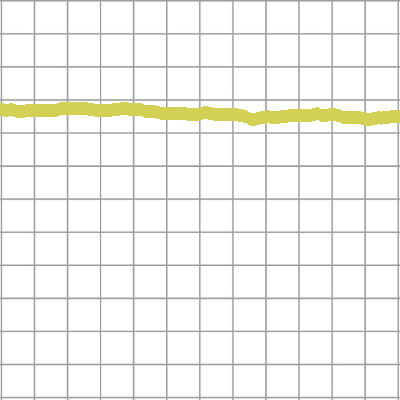

pitch77_thick3_color6_44_testgen.png


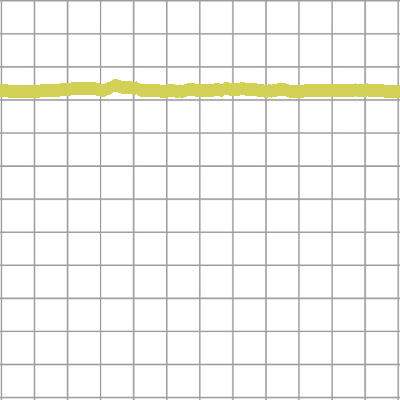

pitch78_thick3_color6_45_testgen.png


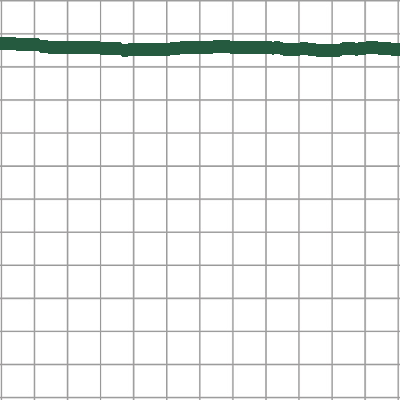

pitch79_thick3_color1_46_testgen.png


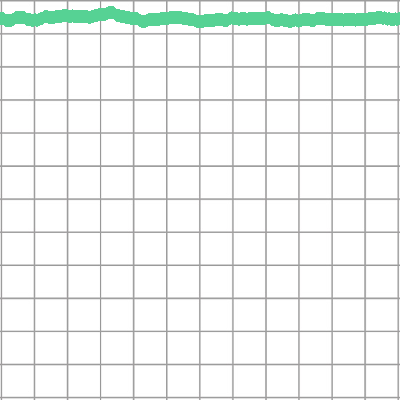

pitch80_thick3_color5_47_testgen.png


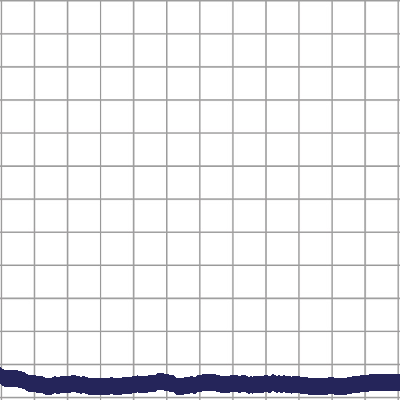

pitch69_thick4_color0_48_testgen.png


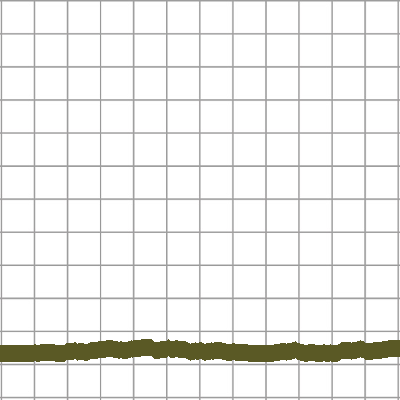

pitch70_thick4_color2_49_testgen.png


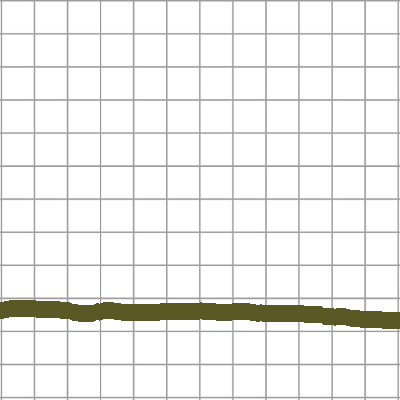

pitch71_thick4_color2_50_testgen.png


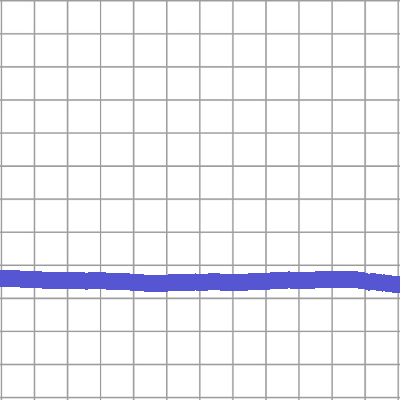

pitch72_thick4_color4_51_testgen.png


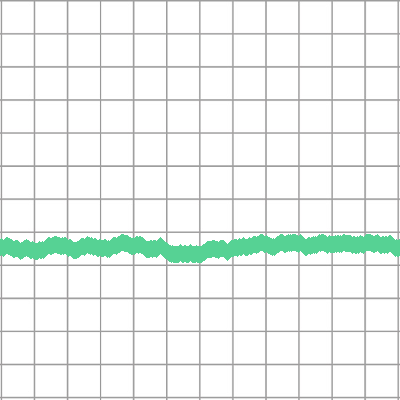

pitch73_thick4_color5_52_testgen.png


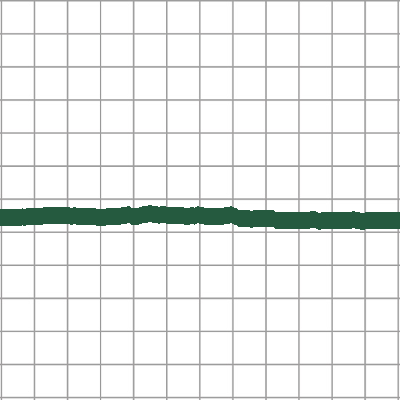

pitch74_thick4_color1_53_testgen.png


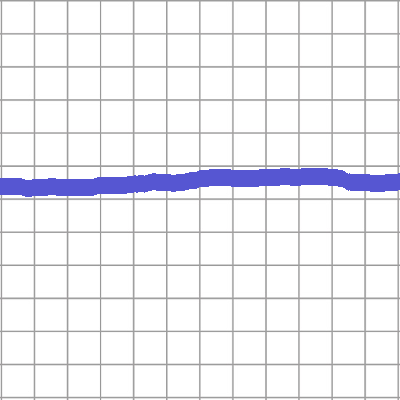

pitch75_thick4_color4_54_testgen.png


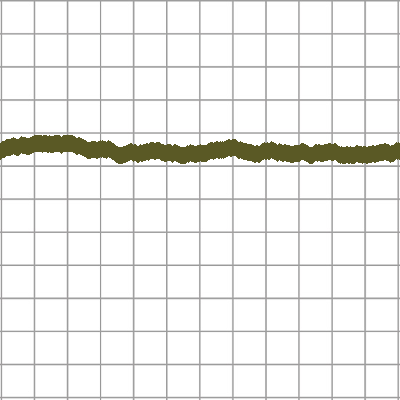

pitch76_thick4_color2_55_testgen.png


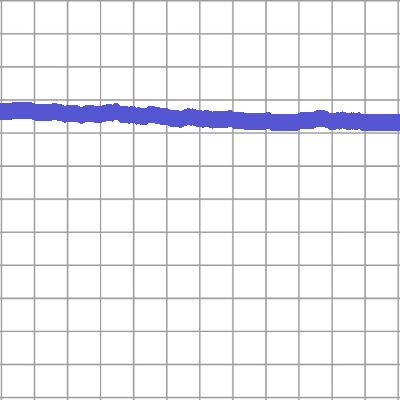

pitch77_thick4_color4_56_testgen.png


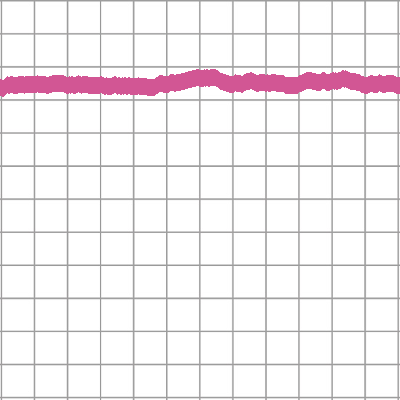

pitch78_thick4_color7_57_testgen.png


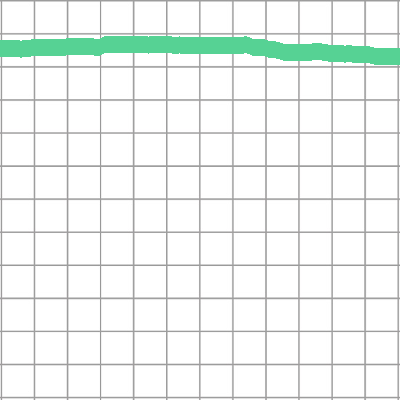

pitch79_thick4_color5_58_testgen.png


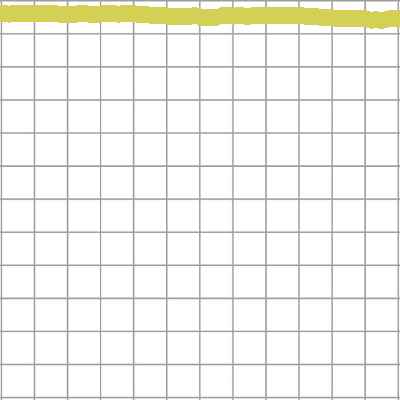

pitch80_thick4_color6_59_testgen.png


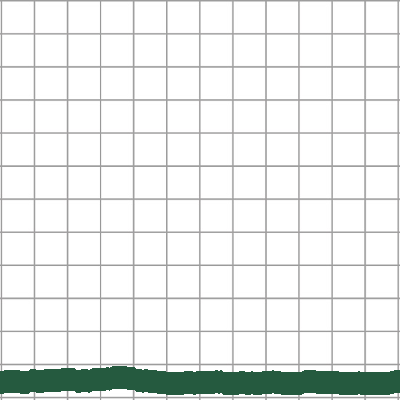

pitch69_thick5_color1_60_testgen.png


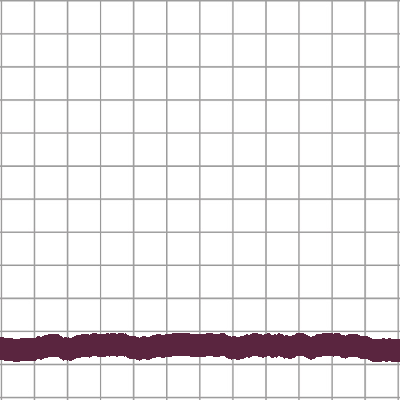

pitch70_thick5_color3_61_testgen.png


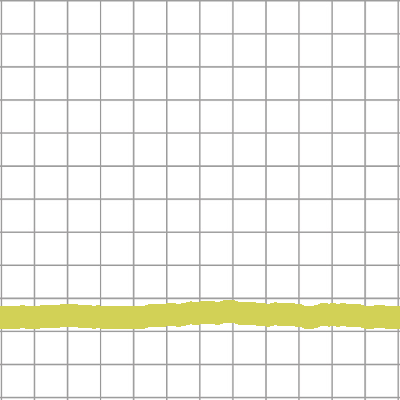

pitch71_thick5_color6_62_testgen.png


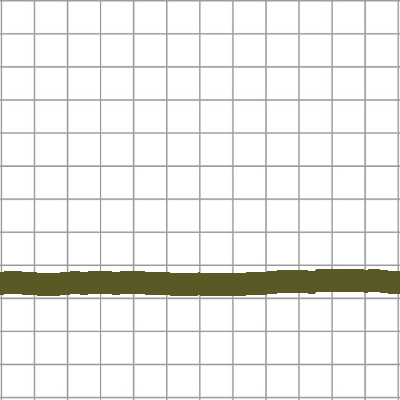

pitch72_thick5_color2_63_testgen.png


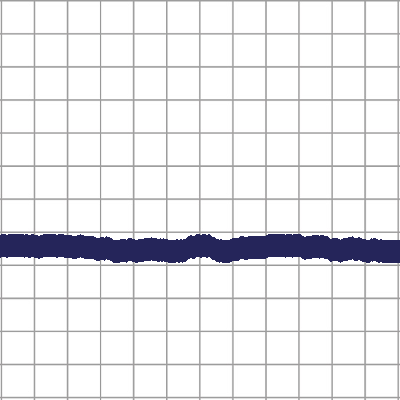

pitch73_thick5_color0_64_testgen.png


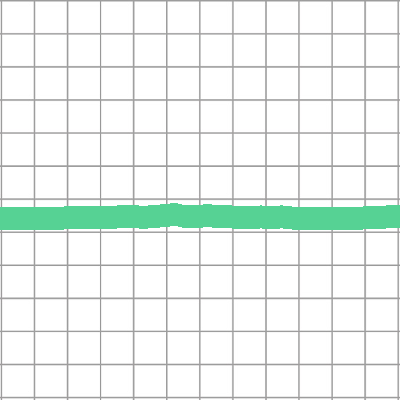

pitch74_thick5_color5_65_testgen.png


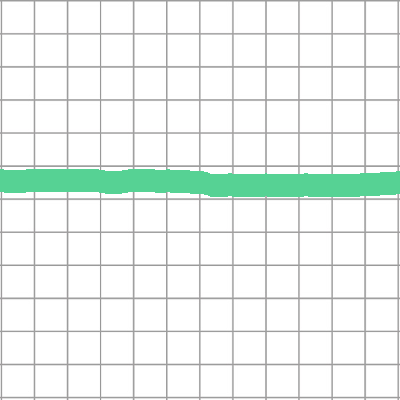

pitch75_thick5_color5_66_testgen.png


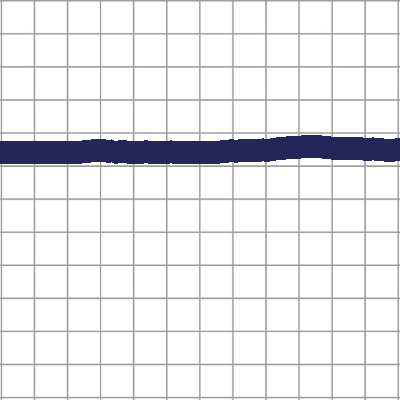

pitch76_thick5_color0_67_testgen.png


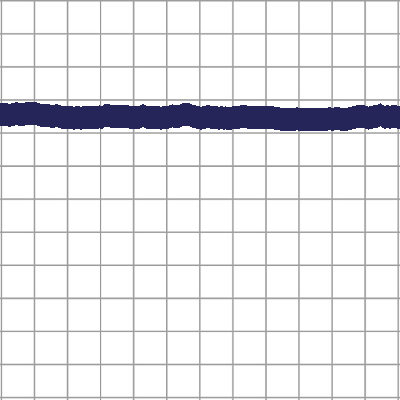

pitch77_thick5_color0_68_testgen.png


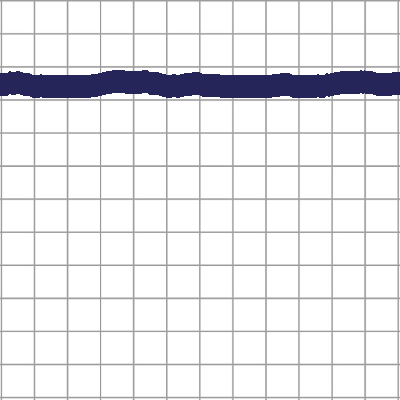

pitch78_thick5_color0_69_testgen.png


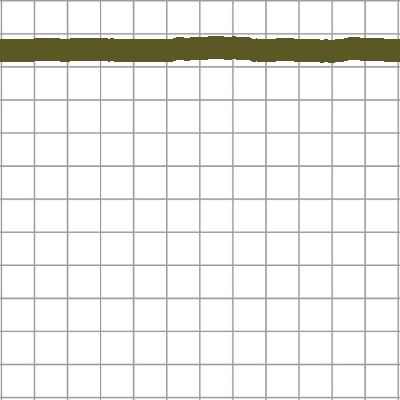

pitch79_thick5_color2_70_testgen.png


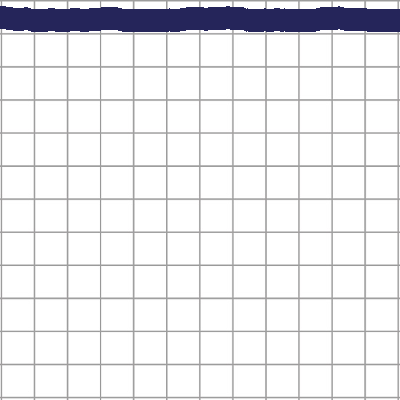

pitch80_thick5_color0_71_testgen.png


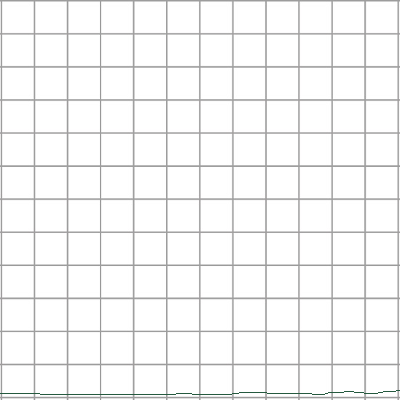

pitch69_thick0_color1_72_testgen.png


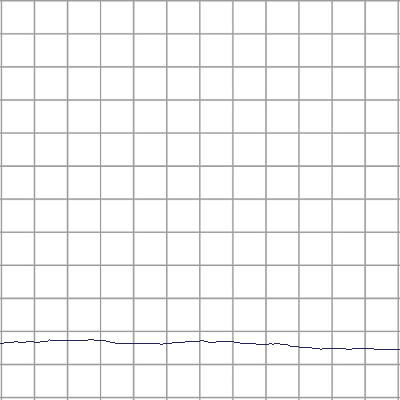

pitch70_thick0_color0_73_testgen.png


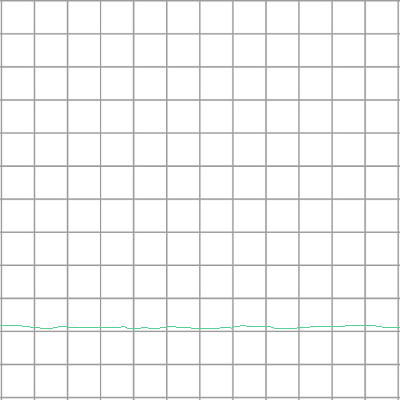

pitch71_thick0_color5_74_testgen.png


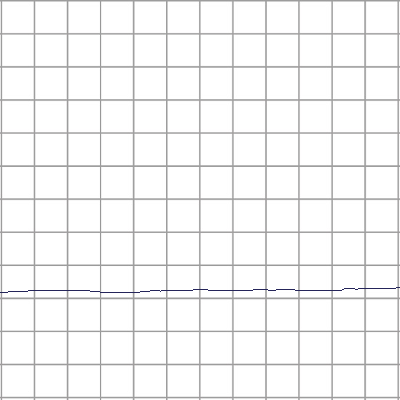

pitch72_thick0_color0_75_testgen.png


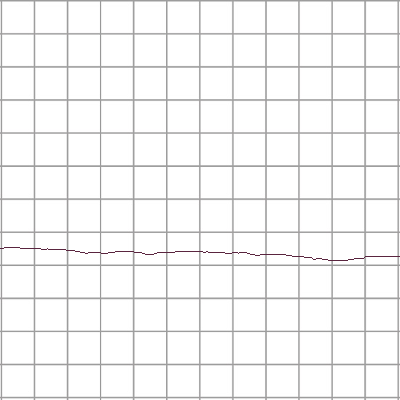

pitch73_thick0_color3_76_testgen.png


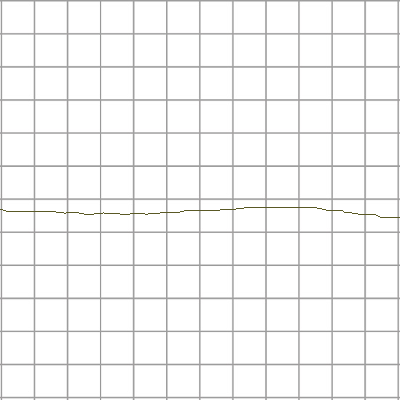

pitch74_thick0_color2_77_testgen.png


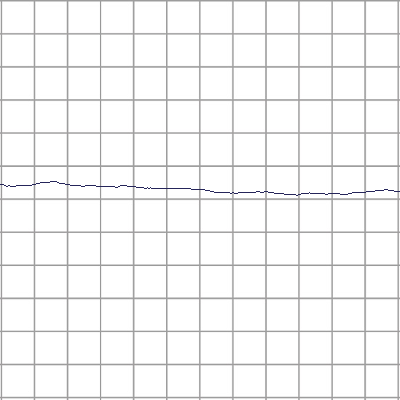

pitch75_thick0_color0_78_testgen.png


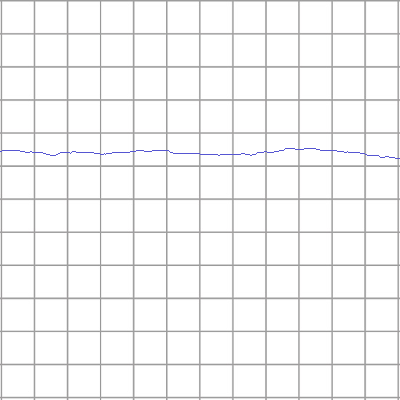

pitch76_thick0_color4_79_testgen.png


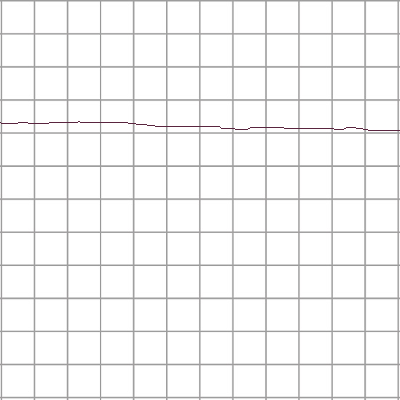

pitch77_thick0_color3_80_testgen.png


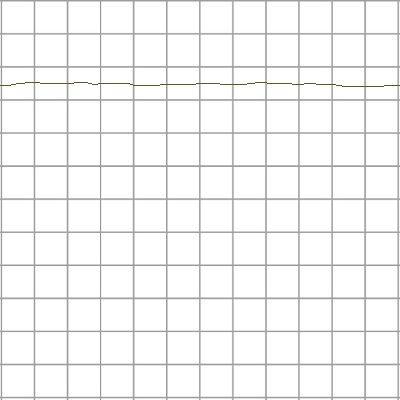

pitch78_thick0_color2_81_testgen.png


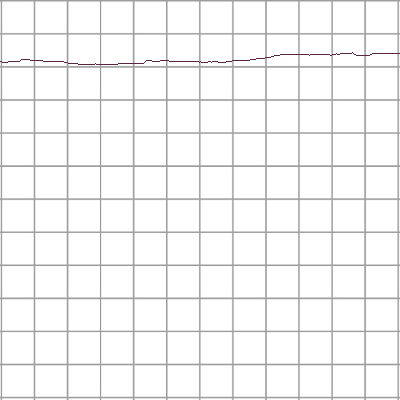

pitch79_thick0_color3_82_testgen.png


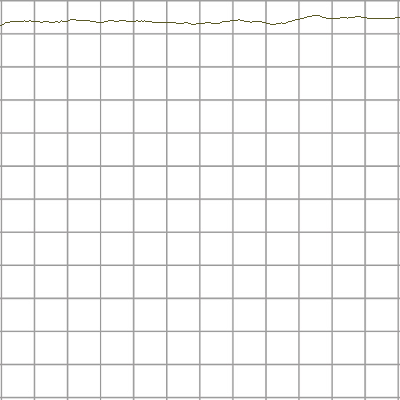

pitch80_thick0_color2_83_testgen.png


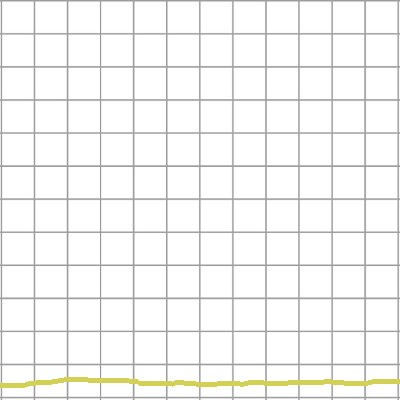

pitch69_thick1_color6_84_testgen.png


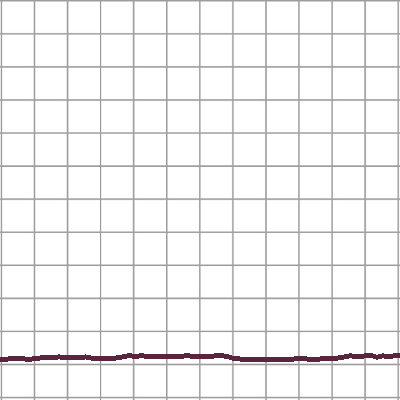

pitch70_thick1_color3_85_testgen.png


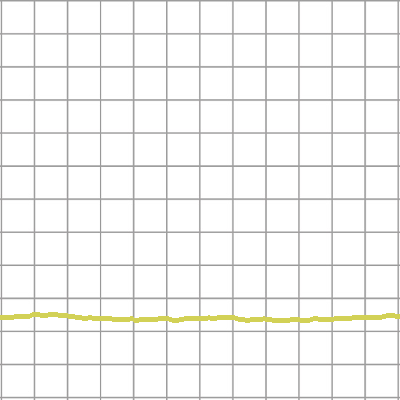

pitch71_thick1_color6_86_testgen.png


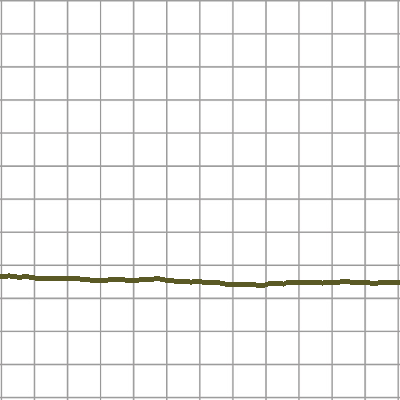

pitch72_thick1_color2_87_testgen.png


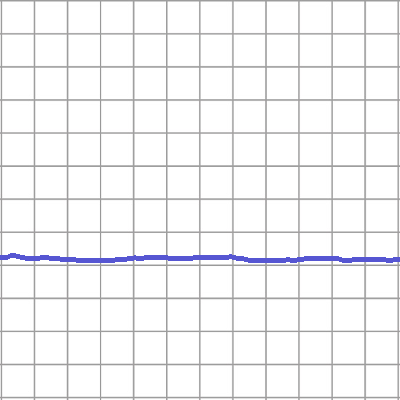

pitch73_thick1_color4_88_testgen.png


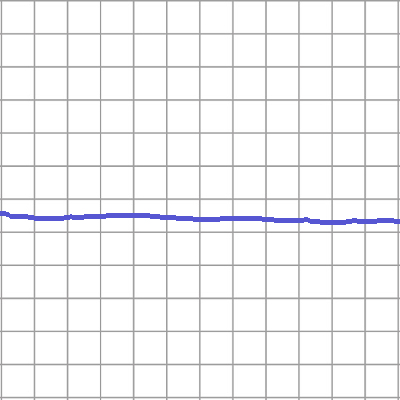

pitch74_thick1_color4_89_testgen.png


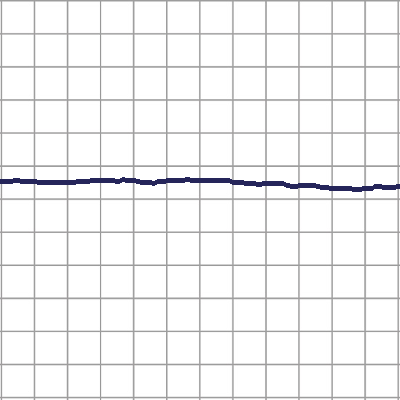

pitch75_thick1_color0_90_testgen.png


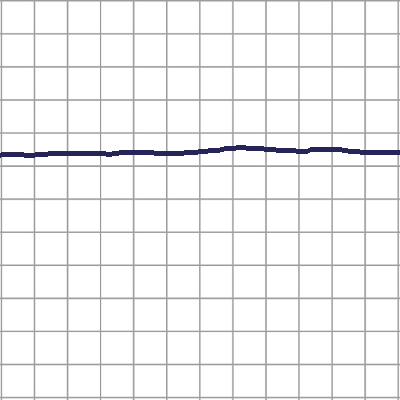

pitch76_thick1_color0_91_testgen.png


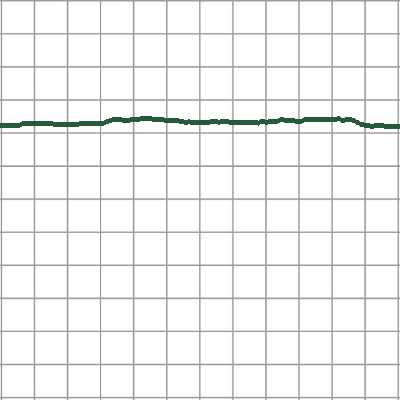

pitch77_thick1_color1_92_testgen.png


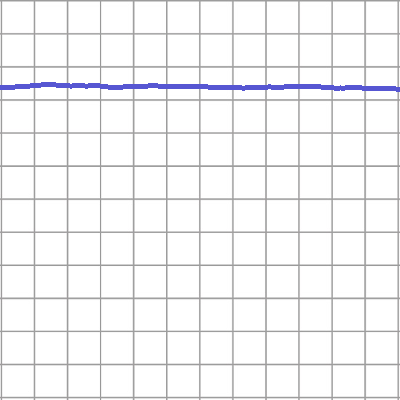

pitch78_thick1_color4_93_testgen.png


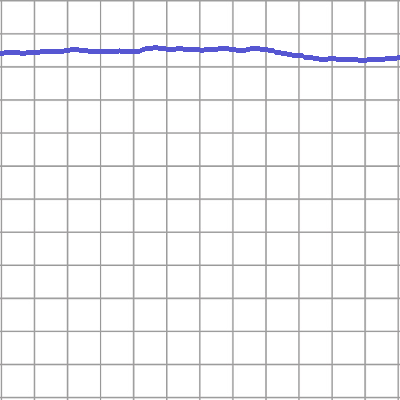

pitch79_thick1_color4_94_testgen.png


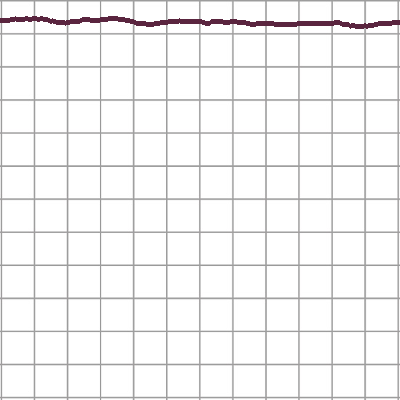

pitch80_thick1_color3_95_testgen.png


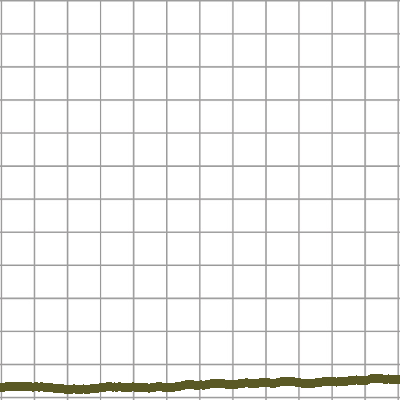

pitch69_thick2_color2_96_testgen.png


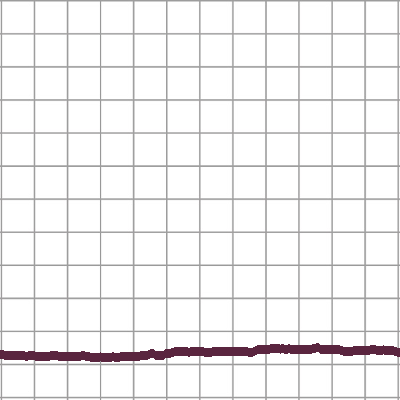

pitch70_thick2_color3_97_testgen.png


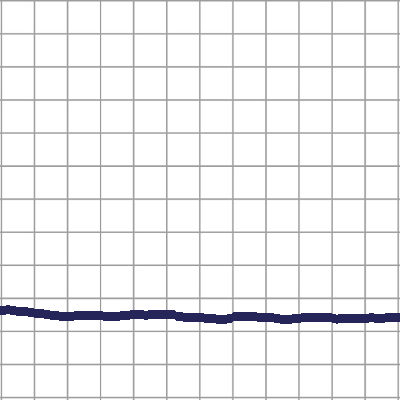

pitch71_thick2_color0_98_testgen.png


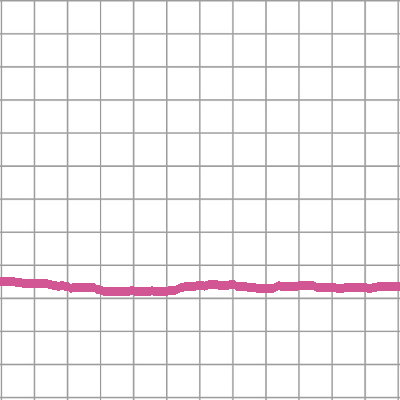

pitch72_thick2_color7_99_testgen.png


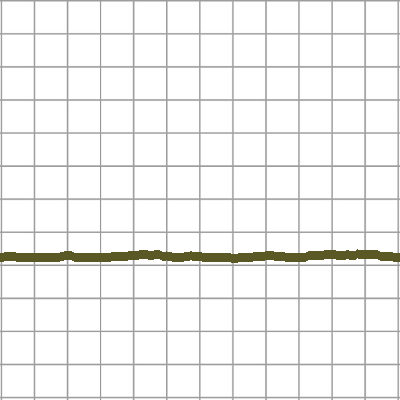

pitch73_thick2_color2_100_testgen.png


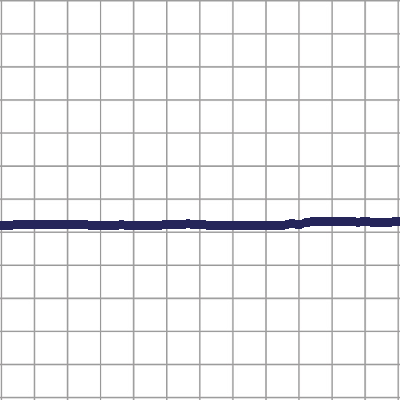

pitch74_thick2_color0_101_testgen.png


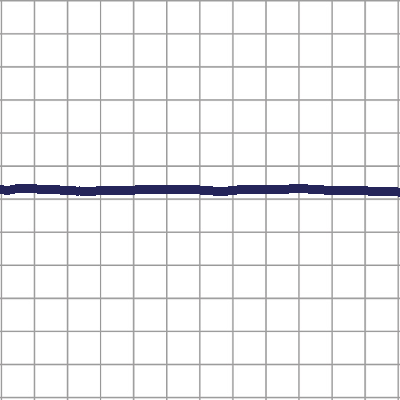

pitch75_thick2_color0_102_testgen.png


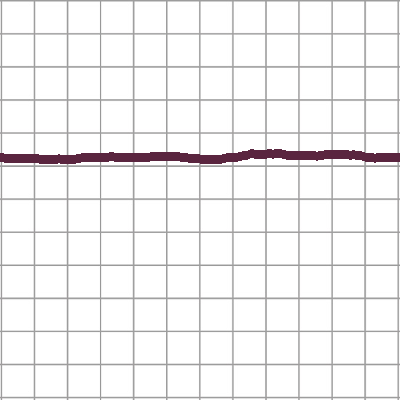

pitch76_thick2_color3_103_testgen.png


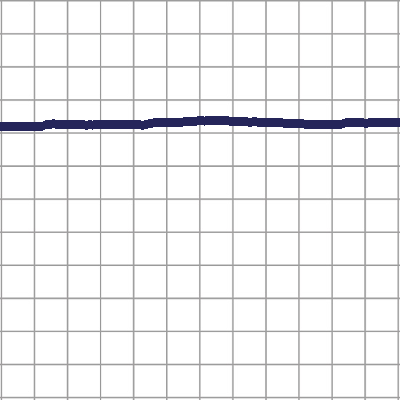

pitch77_thick2_color0_104_testgen.png


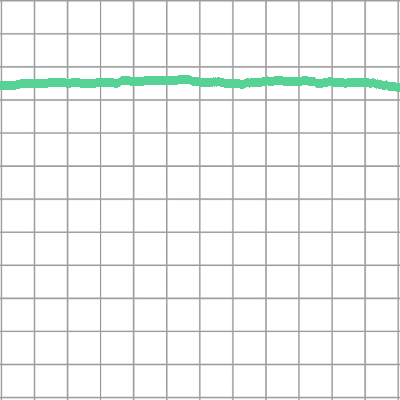

pitch78_thick2_color5_105_testgen.png


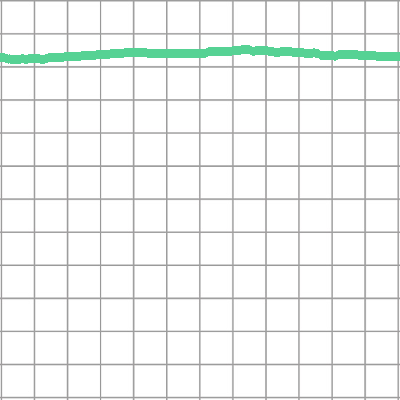

pitch79_thick2_color5_106_testgen.png


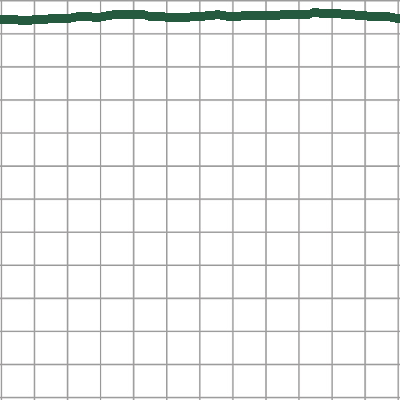

pitch80_thick2_color1_107_testgen.png


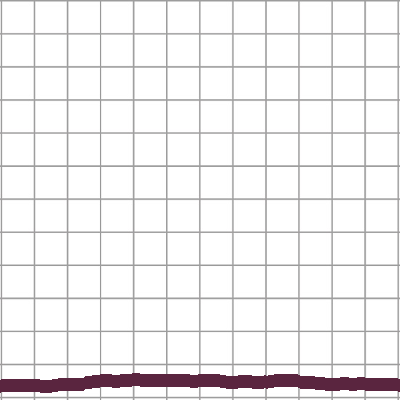

pitch69_thick3_color3_108_testgen.png


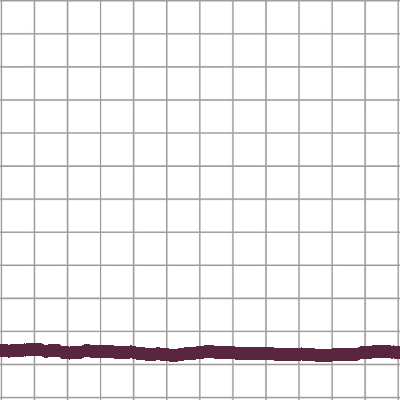

pitch70_thick3_color3_109_testgen.png


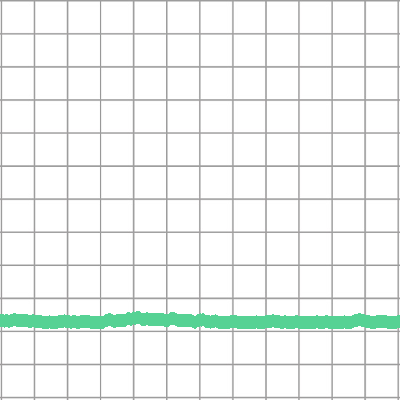

pitch71_thick3_color5_110_testgen.png


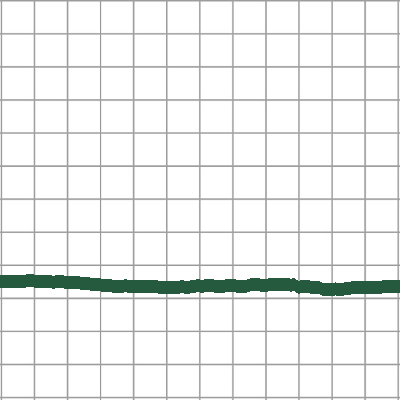

pitch72_thick3_color1_111_testgen.png


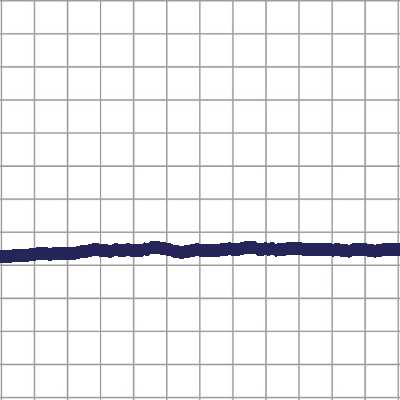

pitch73_thick3_color0_112_testgen.png


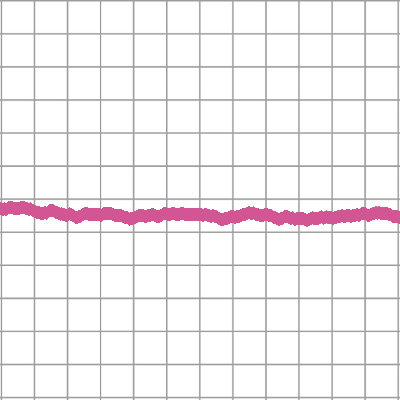

pitch74_thick3_color7_113_testgen.png


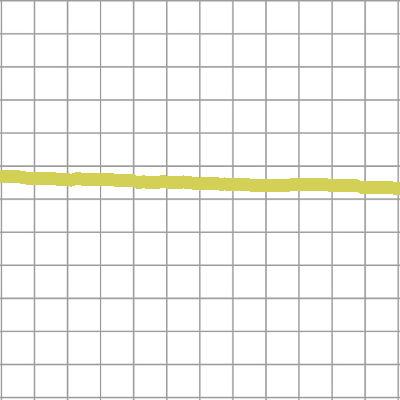

pitch75_thick3_color6_114_testgen.png


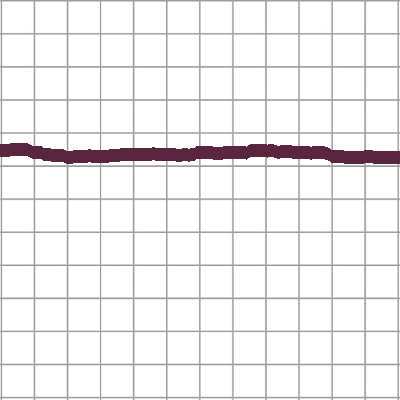

pitch76_thick3_color3_115_testgen.png


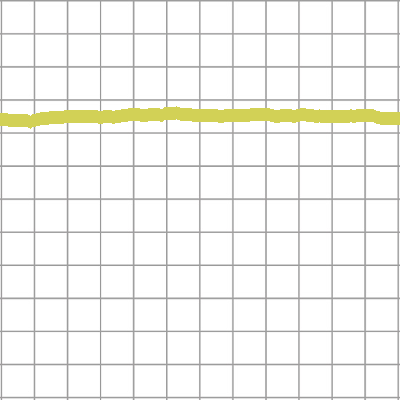

pitch77_thick3_color6_116_testgen.png


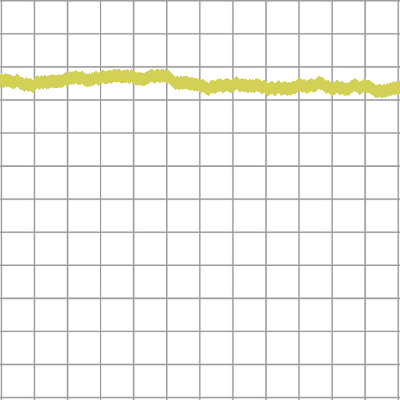

pitch78_thick3_color6_117_testgen.png


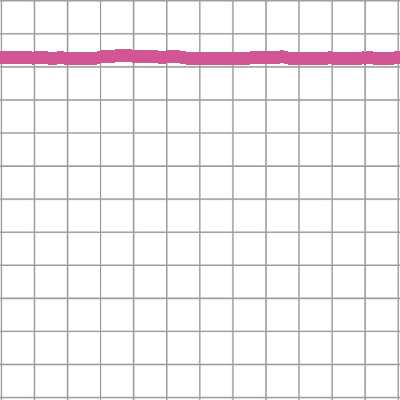

pitch79_thick3_color7_118_testgen.png


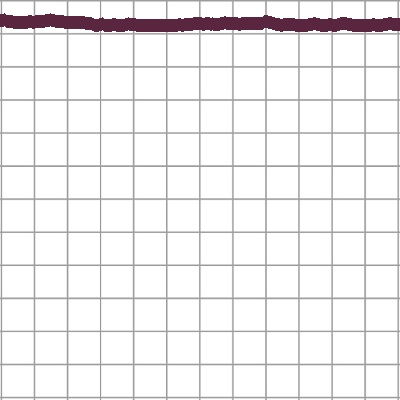

pitch80_thick3_color3_119_testgen.png
[INFO] loading the testgen dataset...
[INFO] shuffle testgen dataset...
x_testgen.shape= (120, 400, 400, 3)
y_testgenstat.shape= (120, 3)
label y_testgen_pitch[0] = 8
label y_testgen_thick[0] = 1
label y_testgen_color[0] = 7

label y_testgen_pitch[1] = 4
label y_testgen_thick[1] = 1
label y_testgen_color[1] = 7

label y_testgen_pitch[2] = 7
label y_testgen_thick[2] = 1
label y_testgen_color[2] = 7

label y_testgen_pitch[3] = 6
label y_testgen_thick[3] = 5
label y_testgen_color[3] = 7

label y_testgen_pitch[4] = 5
label y_testgen_thick[4] = 1
label y_testgen_color[4] = 7

label y_testgen_pitch[5] = 9
label y_testgen_thick[5] = 1
label y_testgen_color[5] = 7

label y_testgen_pitch[6] = 8
label y_testgen_thick[6] = 6
label y_testgen_color[6] = 7

label y_testgen_pitch[7] = 2
label y_testgen_thick[7] = 1
label y_testgen_color[7] = 7

label y_testgen_pitch[8] = 3
label y_testgen_thick[8] = 1
label y_testgen_color[8] = 7

label y_testgen_pitch[9] = 6
lab

In [0]:
NB_VERSION_TESTGEN = 10
NB_TESTGEN = NB_PITCH*NB_VERSION_TESTGEN

print("[INFO] generating testgen dataset...")
generate_pict(NB_TESTGEN, 'testgen')

label_testgen = []

print("[INFO] loading the testgen dataset...")
img_testgen = np.empty((0,400,400,NB_CHANNEL))
for imgP in sorted(os.listdir( "./audiosynthesis_dl/data/pitch_img/img_testgen")[:]) :
  if imgP.split(".")[-1] != "git" and imgP.split(".")[-1] != "gitignore":
    img = image.load_img( "./audiosynthesis_dl/data/pitch_img/img_testgen/"+imgP, 
                             target_size=(400, 400),
                             color_mode='rgb')
    img_testgen = np.concatenate((img_testgen,np.reshape(img,(1,400,400,NB_CHANNEL))),axis=0)
    l = imgP.split("_")
    labels = l[:NB_CARACTERISTICS]
    label_testgen.append(labels)


x_testgen = np.copy(img_testgen)
y_testgenstat = np.copy((label_testgen,NB_CARACTERISTICS))

print("[INFO] shuffle testgen dataset...")
[x_testgen, y_testgenstat] = shuffle_data(img_testgen, label_testgen, NB_TESTGEN)   

y_testgen_pitch = model_pitch.predict_classes(x_testgen)
y_testgen_thick = model_thick.predict_classes(x_testgen)
y_testgen_color = model_color.predict_classes(x_testgen)

print('x_testgen.shape=', x_testgen.shape)
print('y_testgenstat.shape=', y_testgenstat.shape)

# show the inputs and predicted outputs
for i in range(10):
  print("label y_testgen_pitch[%s] = %s" % (i, y_testgen_pitch[i]))
  print("label y_testgen_thick[%s] = %s" % (i, y_testgen_thick[i] + 1))
  print("label y_testgen_color[%s] = %s\n" % (i, y_testgen_color[i]))
  

x_testgen.shape (120, 400, 400, 3) dtype float64


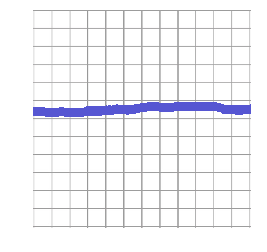

<Figure size 432x288 with 0 Axes>

In [0]:
i = 3;
print('x_testgen.shape', x_testgen.shape, 'dtype', x_testgen.dtype)
plt.imshow(x_testgen[i,:].reshape(400,400,NB_CHANNEL))
plt.axis("off")
plt.show()
plt.gcf().clear()

## Sound synthesis according to the labelisation

full independant code here : https://colab.research.google.com/drive/1KzM-NMSlj87XU_--cifmipAuYd57zZc4


In [0]:
import math as m
import IPython

In [0]:
volume = 0.5     # range [0.0, 1.0]
fs = 44100       # sampling rate, Hz, must be integer
duration = 4.0   # in seconds, may be float
f0 = 440.0        # sine frequency, Hz, may be float
label = 0 # default value, take the one given by the neural network

In [0]:
def sinusoid(pitch_lab, thick_lab, color_lab, duration) :
  """ generate an audio of a sinusoid """
  samples = []
  fm  =  (2**(pitch_lab/12))*f0
  volume = (thick_lab + 1)/NB_THICK
  # generate samples
  for i in range(int(fs*duration)) :
    t = i/fs # seconds
    a = 2*m.pi*fm*t # radians
    v = volume*m.sin(a)
    for j in range(1,color_lab+1):
      b = 2*m.pi*j*fm*t
      v += (volume/j)*(m.sin(b))
    samples.append(v)
  return samples


In [0]:
i = 4
pitch_lab_i = y_test_pitch[i]
thick_lab_i = y_test_thick[i]
color_lab_i = y_test_color[i]

sin = sinusoid(pitch_lab_i, thick_lab_i, color_lab_i, duration)
IPython.display.Audio(sin, rate=fs)

## Tests with VGG16

code here :
https://colab.research.google.com/drive/1YG-4crZ56U0_Idz4r5Mu04R5zzrM5-1L